In [ ]:
import trino
import pandas as pd
import numpy as np
import matplotlib.ticker as ticker
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable


plt.rcParams['figure.figsize'] = [10, 8]

conn = trino.dbapi.connect(
    host='kakaoent-presto-adhoc.kakaoent.io',
    port=8443,
    user='samuel-ch',
    catalog='hadoop_kent',
    schema='default',                          # 사용할 Database 지정
    http_scheme='https',
    auth=trino.auth.BasicAuthentication("samuel-ch", "melon!Q2w3e"),  # 카카오 LDAP이 아닌 하둡 LDAP 입력
    http_headers={
        'X-Presto-User': 'samuel-ch',
        'X-Presto-Time-Zone': 'Asia/Seoul'
    },
)
cur = conn.cursor()

In [2]:
# Set CSS properties for th elements in dataframe
th_props = [
  ('font-size', '11px'),
  ('text-align', 'center'),
  ('font-weight', 'bold'),
  ('color', '#6d6d6d'),
  ('background-color', '#f7f7f9')
  ]

# Set CSS properties for td elements in dataframe
td_props = [
  ('font-size', '11px')
  ]

# Set table styles
styles = [
  dict(selector="th", props=th_props),
  dict(selector="td", props=td_props)
  ]

cm = sns.light_palette("green", as_cmap=True)

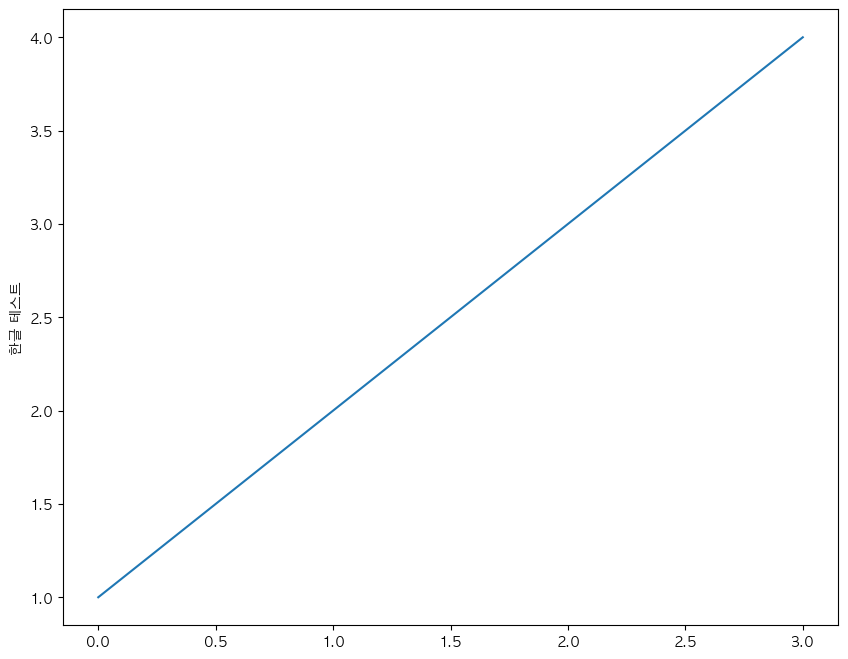

In [3]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# AppleGothic 폰트 설정
plt.rcParams['font.family'] = 'AppleGothic'

# 테스트 플롯
plt.plot([1, 2, 3, 4])
plt.ylabel('한글 테스트')
plt.show()

In [21]:
tmp_query = '''
select A.year_month
	 , A.vip_grade_nm
	 , A.USER_TRGT_NM as user_type    
     , count(distinct member_key) as user_cnt
     , cast(count(distinct member_key) as double)/cast(tot_user_cnt as double)*100 as user_ratio
	 , count(distinct if(out_yn = '유지',member_key)) as keep_user_cnt
     , round(cast(count(distinct if(out_yn = '유지',member_key)) as double)/cast(tot_keep_user_cnt as double)*100,2) as keep_user_ratio_by_user_type
     , count(distinct if(out_yn = '해지',member_key)) as out_user_cnt
     , round(cast(count(distinct if(out_yn = '해지',member_key)) as double)/cast(tot_out_user_cnt as double)*100,2) as out_user_ratio_by_user_type
	 , round(cast(count(distinct if(out_yn = '해지',member_key)) as double)/cast(count(distinct member_key) as double)*100,2) as ratio     
from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_DTL_TB A
left join(
	select year_month
		 , vip_grade_nm
		 , count(distinct member_key) as tot_user_cnt
         , count(distinct if(out_yn = '유지',member_key)) as tot_keep_user_cnt
     	 , count(distinct if(out_yn = '해지',member_key)) as tot_out_user_cnt
	from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_DTL_TB
    group by 1, 2	 
) B ON A.year_month = B.year_month and A.vip_grade_nm = B.vip_grade_nm
group by 1, 2, 3,tot_user_cnt,tot_keep_user_cnt,tot_out_user_cnt
order by 3, 2, 1
'''

cur.execute(tmp_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

tmp_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
tmp_df.head()

,year_month,vip_grade_nm,user_type,user_cnt,user_ratio,keep_user_cnt,keep_user_ratio_by_user_type,out_user_cnt,out_user_ratio_by_user_type,ratio
0,202201,A_일반,Blist,79109,9.177793,53860,8.33,25249,11.72,31.92
1,202202,A_일반,Blist,62825,8.018681,45354,7.24,17471,11.12,27.81
2,202203,A_일반,Blist,56008,7.228863,38010,6.20,17998,11.12,32.13
3,202204,A_일반,Blist,56188,6.966056,37477,5.77,18711,11.87,33.30
4,202205,A_일반,Blist,47842,6.145147,32259,5.10,15583,10.71,32.57


In [22]:
# 소수점 처리
tmp_df['user_ratio'] = tmp_df['user_ratio'].round(2)
tmp_df['keep_user_ratio_by_user_type'] = tmp_df['keep_user_ratio_by_user_type'].round(2)
tmp_df['out_user_ratio_by_user_type'] = tmp_df['out_user_ratio_by_user_type'].round(2)
# year_month를 datetime 형식으로 변환
tmp_df['log_month'] = pd.to_datetime(tmp_df['year_month'], format='%Y%m')


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


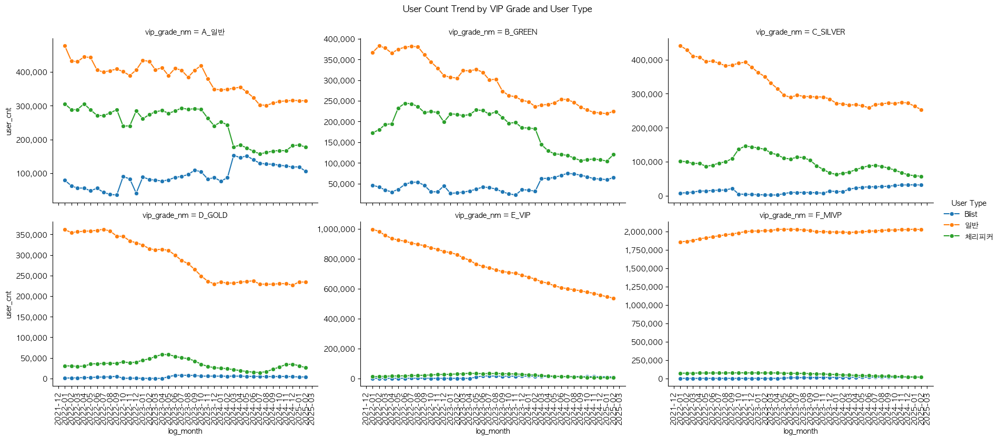

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


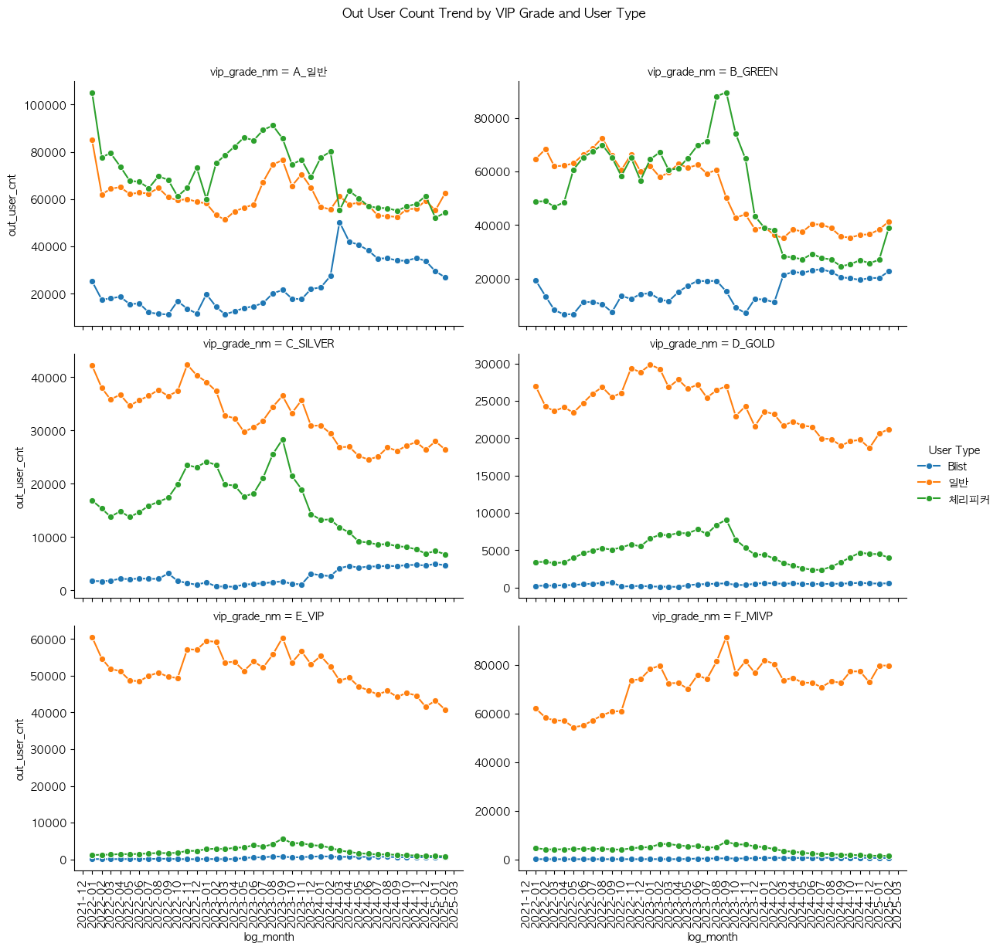

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


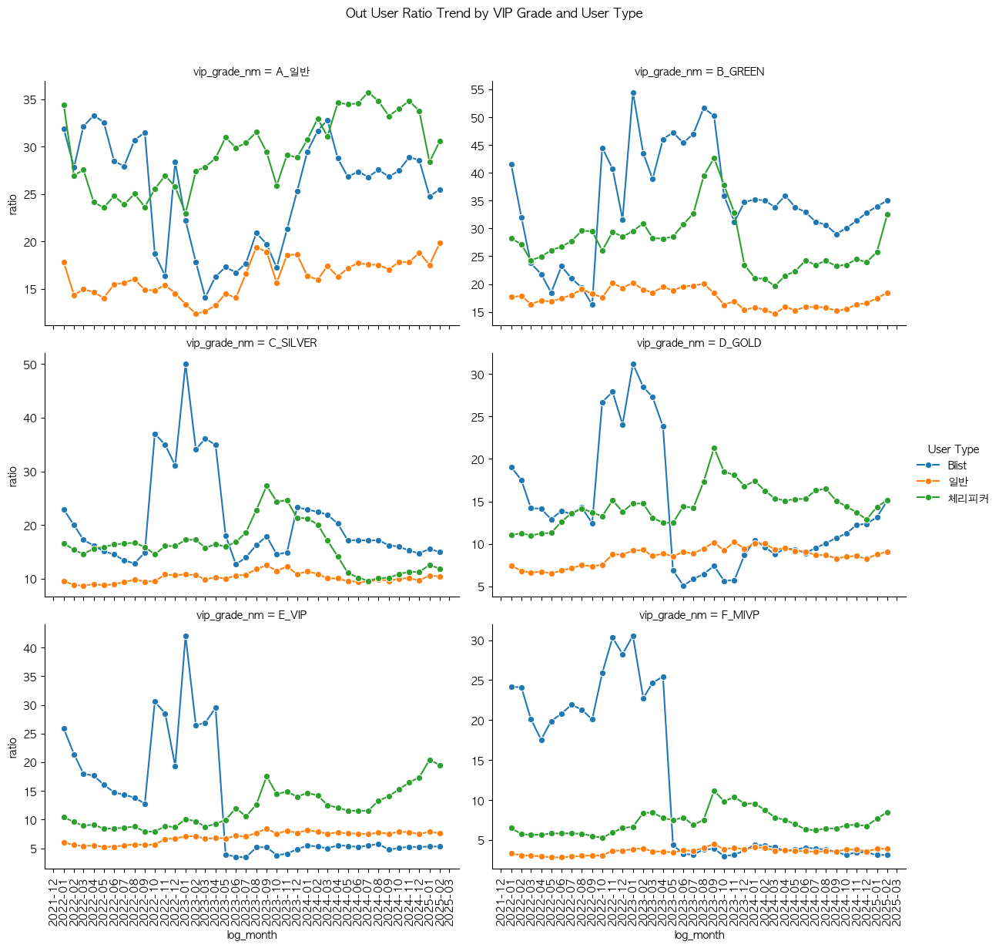

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1914478421.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


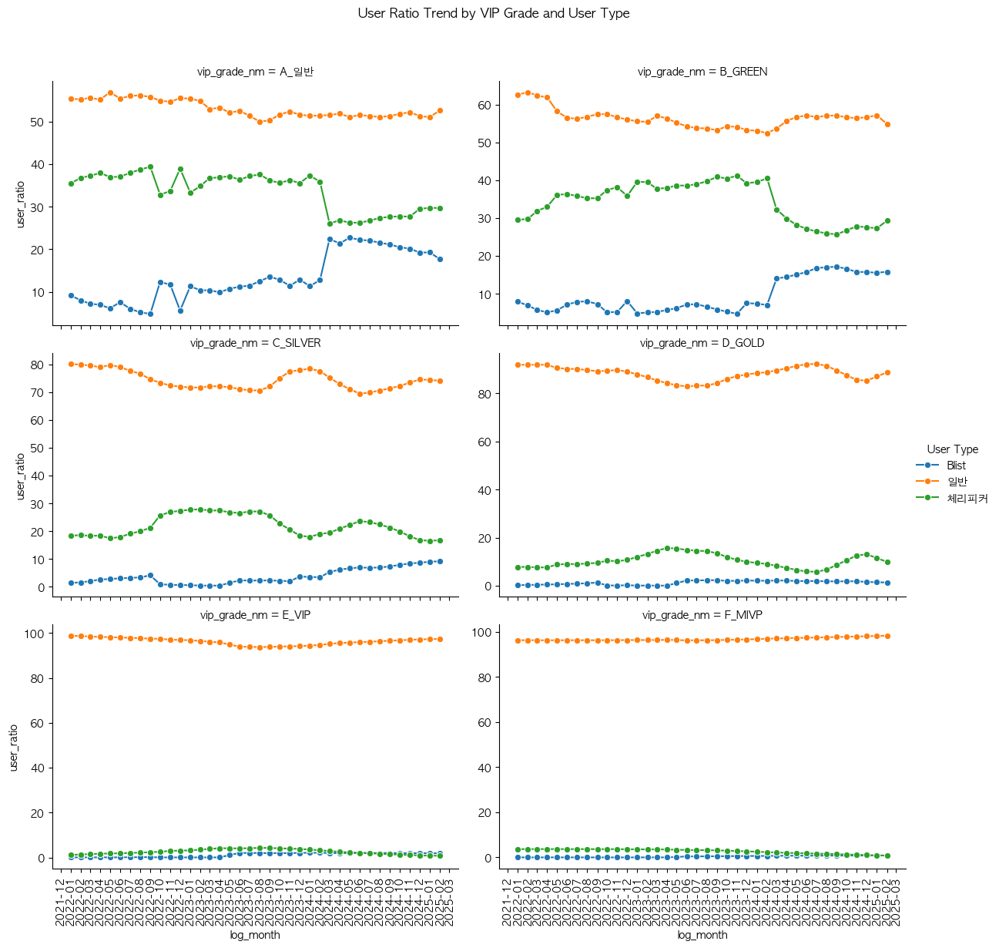

In [31]:
# vip_grade_nm 별로 user_type에 따른 user_cnt 추이 확인
g = sns.FacetGrid(tmp_df, col="vip_grade_nm", col_wrap=3, height=4, aspect=1.5, sharey=False)
g.map(sns.lineplot, "log_month", "user_cnt", "user_type", marker="o")
g.add_legend(title='User Type')

# x축 레이블 90도 회전
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    # y축 레이블을 콤마가 있는 숫자 형식으로 설정
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))

plt.subplots_adjust(top=0.9)
g.fig.suptitle('User Count Trend by VIP Grade and User Type')
plt.show()

# vip_grade_nm 별로 user_type에 따른 user_cnt 추이 확인
g = sns.FacetGrid(tmp_df, col="vip_grade_nm", col_wrap=2, height=4, aspect=1.5,sharey=False)
g.map(sns.lineplot, "log_month", "out_user_cnt", "user_type", marker="o")
g.add_legend(title='User Type')

# x축 레이블 90도 회전
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Out User Count Trend by VIP Grade and User Type')
plt.show()

# vip_grade_nm 별로 user_type에 따른 user_cnt 추이 확인
g = sns.FacetGrid(tmp_df, col="vip_grade_nm", col_wrap=2, height=4, aspect=1.5,sharey=False)
g.map(sns.lineplot, "log_month", "ratio", "user_type", marker="o")
g.add_legend(title='User Type')

# x축 레이블 90도 회전
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Out User Ratio Trend by VIP Grade and User Type')
plt.show()


# vip_grade_nm 별로 user_type에 따른 user_cnt 추이 확인
g = sns.FacetGrid(tmp_df, col="vip_grade_nm", col_wrap=2, height=4, aspect=1.5,sharey=False)
g.map(sns.lineplot, "log_month", "user_ratio", "user_type", marker="o")
g.add_legend(title='User Type')

# x축 레이블 90도 회전
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
plt.subplots_adjust(top=0.9)
g.fig.suptitle('User Ratio Trend by VIP Grade and User Type')
plt.show()

In [37]:
blist_df

,year_month,vip_grade_nm,user_type,user_cnt,user_ratio,keep_user_cnt,keep_user_ratio_by_user_type,out_user_cnt,out_user_ratio_by_user_type,ratio,log_month
0,202201,A_일반,Blist,79109,9.18,53860,8.33,25249,11.72,31.92,2022-01-01
1,202202,A_일반,Blist,62825,8.02,45354,7.24,17471,11.12,27.81,2022-02-01
2,202203,A_일반,Blist,56008,7.23,38010,6.20,17998,11.12,32.13,2022-03-01
3,202204,A_일반,Blist,56188,6.97,37477,5.77,18711,11.87,33.30,2022-04-01
4,202205,A_일반,Blist,47842,6.15,32259,5.10,15583,10.71,32.57,2022-05-01
...,...,...,...,...,...,...,...,...,...,...,...
223,202410,F_MIVP,Blist,16995,0.82,16461,0.83,534,0.67,3.14,2024-10-01
224,202411,F_MIVP,Blist,17343,0.84,16734,0.84,609,0.77,3.51,2024-11-01
225,202412,F_MIVP,Blist,17536,0.85,16927,0.85,609,0.81,3.47,2024-12-01
226,202501,F_MIVP,Blist,17649,0.85,17097,0.86,552,0.68,3.13,2025-01-01


In [45]:
pivot_table_ratio

vip_grade_nm,A_일반,B_GREEN,C_SILVER,D_GOLD,E_VIP,F_MIVP
year_month,,,,,,
202201,31.92,41.60,22.92,19.05,25.89,24.19
202202,27.81,31.99,20.00,17.50,21.39,24.09
202203,32.13,23.75,17.27,14.24,18.02,20.17
202204,33.30,21.80,16.17,14.13,17.65,17.55
202205,32.57,18.45,15.15,12.91,16.11,19.89
202206,28.48,23.21,14.53,13.90,14.74,20.81
202207,27.93,21.02,13.44,13.48,14.35,21.94
202208,30.67,19.35,12.85,14.29,13.83,21.30
202209,31.52,16.28,14.89,12.43,12.78,20.10


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/2078693953.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


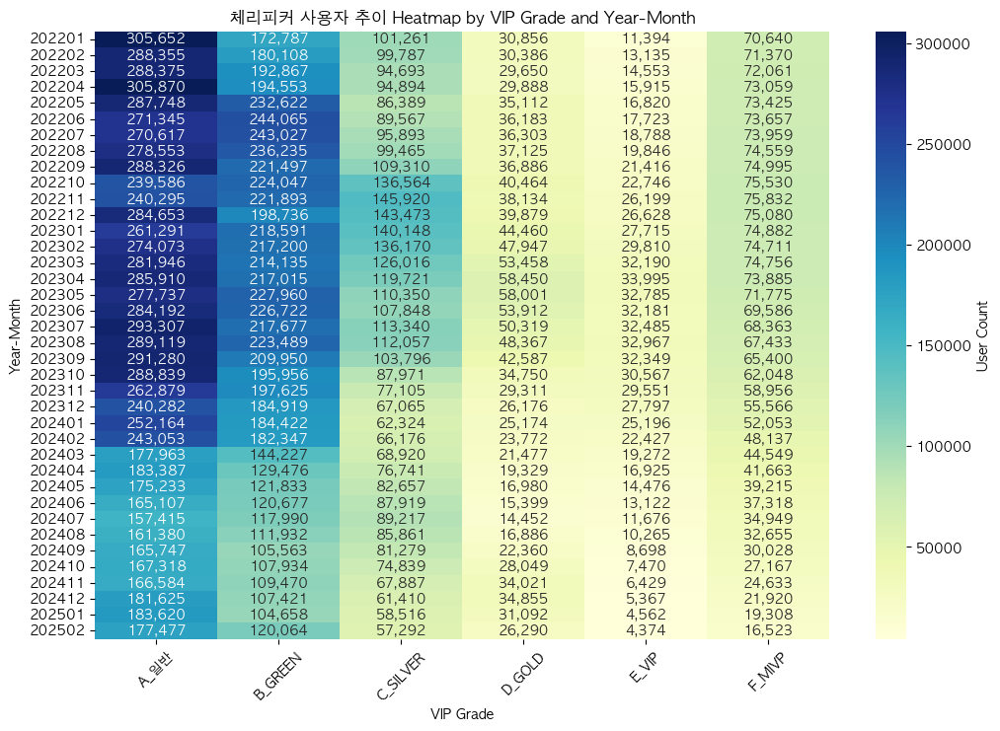

In [47]:
# user_type이 Blist인 경우만 필터링
blist_df = tmp_df[tmp_df['user_type'] == '체리피커']

# 피벗 테이블 생성
pivot_table = blist_df.pivot(index='year_month', columns='vip_grade_nm', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': 'User Count'})
plt.title('체리피커 사용자 추이 Heatmap by VIP Grade and Year-Month')
plt.xlabel('VIP Grade')
plt.ylabel('Year-Month')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1821400561.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


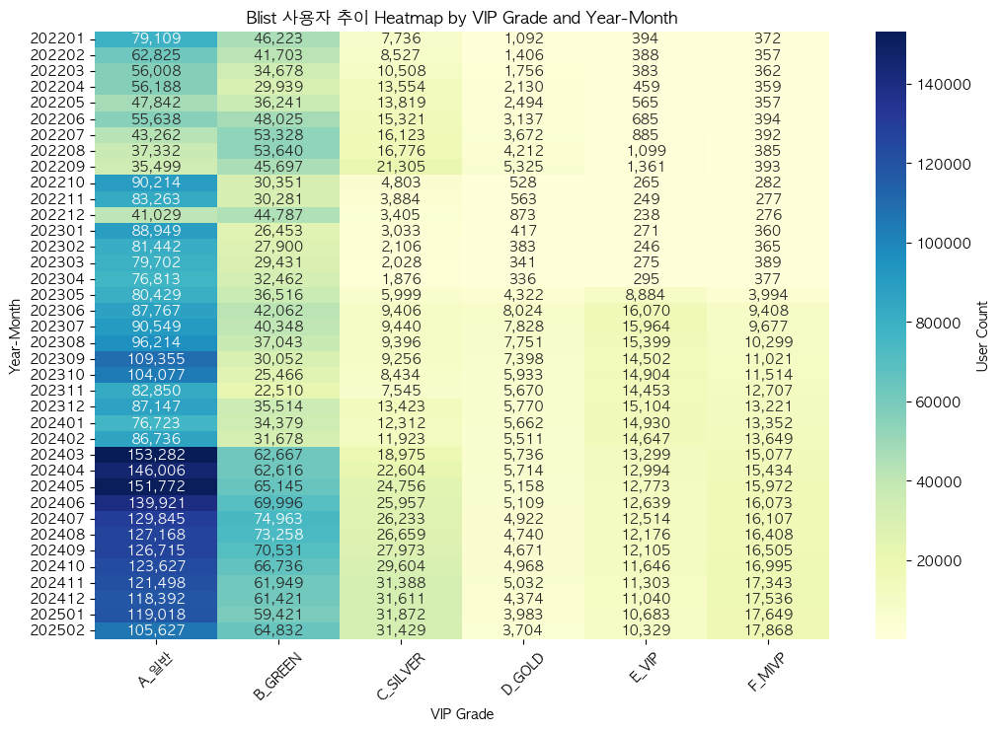

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1821400561.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values_out_user_cnt = pivot_table_out_user_cnt.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


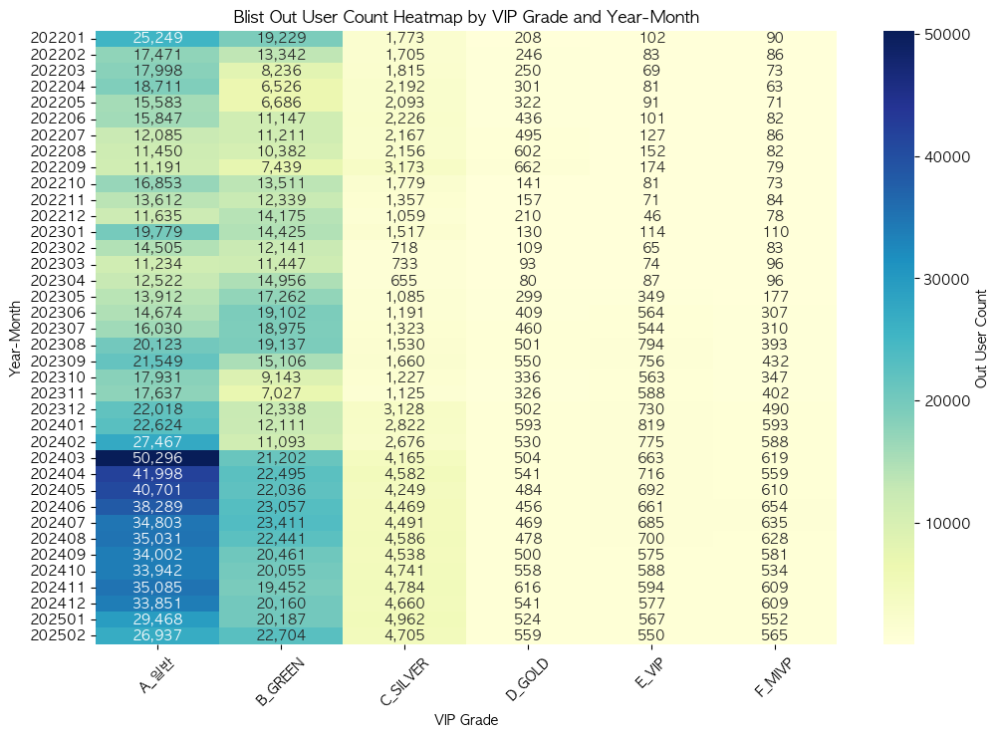

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1821400561.py:46: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values_ratio = pivot_table_ratio.applymap(lambda x: f'{x:.2f}' if pd.notnull(x) else '')


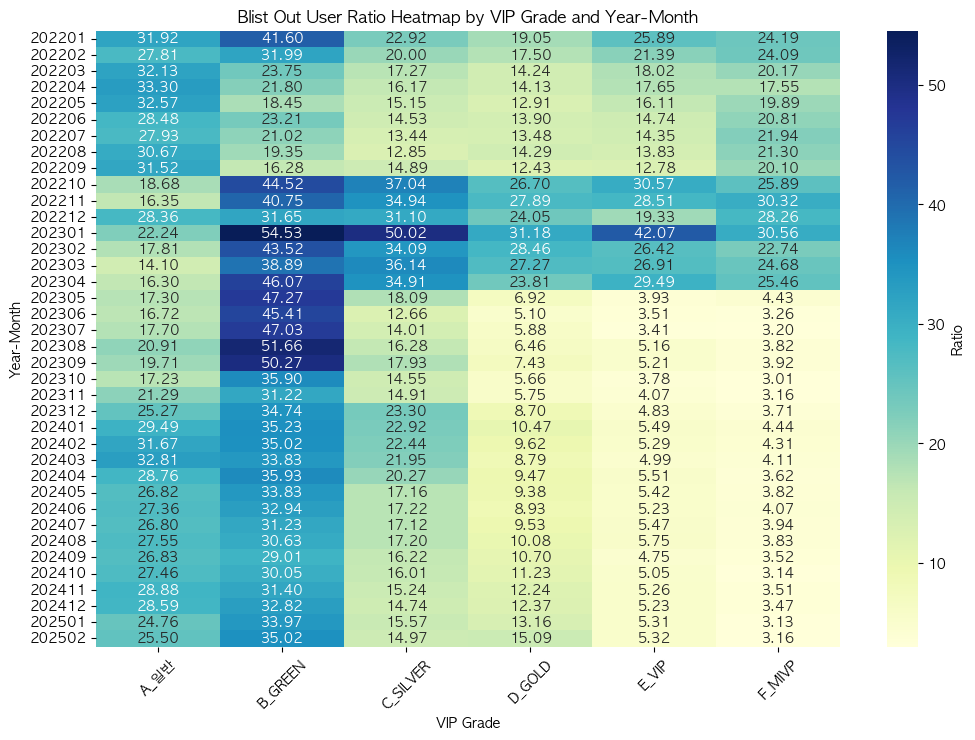

In [46]:
# user_type이 Blist인 경우만 필터링
blist_df = tmp_df[tmp_df['user_type'] == 'Blist']

# 피벗 테이블 생성
pivot_table = blist_df.pivot(index='year_month', columns='vip_grade_nm', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': 'User Count'})
plt.title('Blist 사용자 추이 Heatmap by VIP Grade and Year-Month')
plt.xlabel('VIP Grade')
plt.ylabel('Year-Month')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성 (out_user_cnt)
pivot_table_out_user_cnt = blist_df.pivot(index='year_month', columns='vip_grade_nm', values='out_user_cnt')

# 히트맵 그리기 (out_user_cnt)
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values_out_user_cnt = pivot_table_out_user_cnt.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table_out_user_cnt, annot=formatted_values_out_user_cnt, fmt="", cmap="YlGnBu", cbar_kws={'label': 'Out User Count'})
plt.title('Blist Out User Count Heatmap by VIP Grade and Year-Month')
plt.xlabel('VIP Grade')
plt.ylabel('Year-Month')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성 (ratio)
pivot_table_ratio = blist_df.pivot(index='year_month', columns='vip_grade_nm', values='ratio')

# 히트맵 그리기 (ratio)
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 소수점 2자리까지 표시
formatted_values_ratio = pivot_table_ratio.applymap(lambda x: f'{x:.2f}' if pd.notnull(x) else '')

sns.heatmap(pivot_table_ratio, annot=formatted_values_ratio, fmt="", cmap="YlGnBu", cbar_kws={'label': 'Ratio'})
plt.title('Blist Out User Ratio Heatmap by VIP Grade and Year-Month')
plt.xlabel('VIP Grade')
plt.ylabel('Year-Month')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/9200171.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


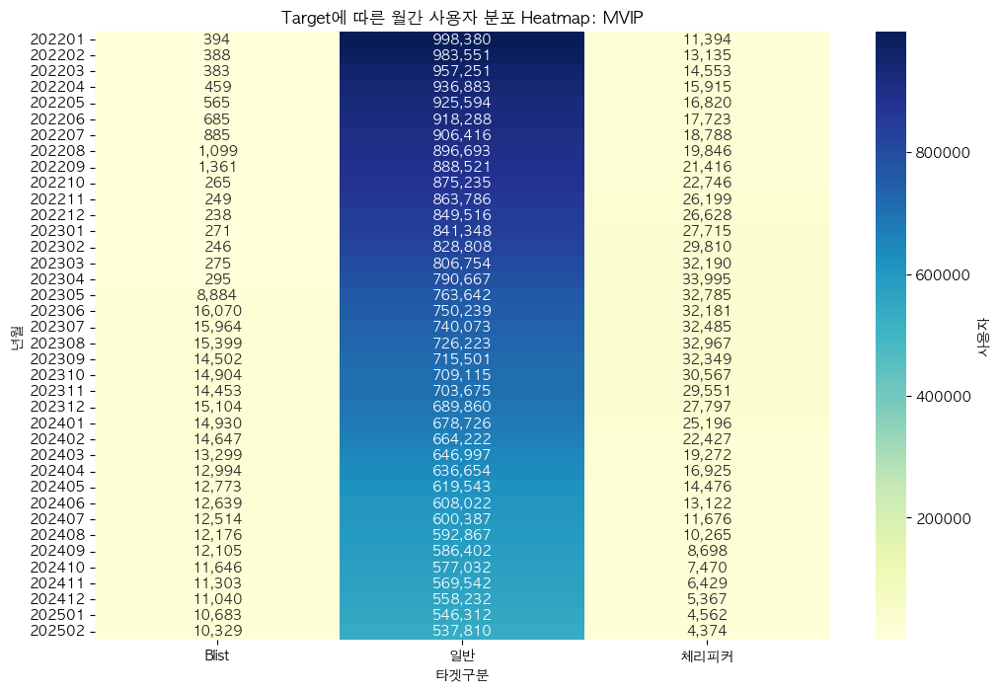

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/9200171.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


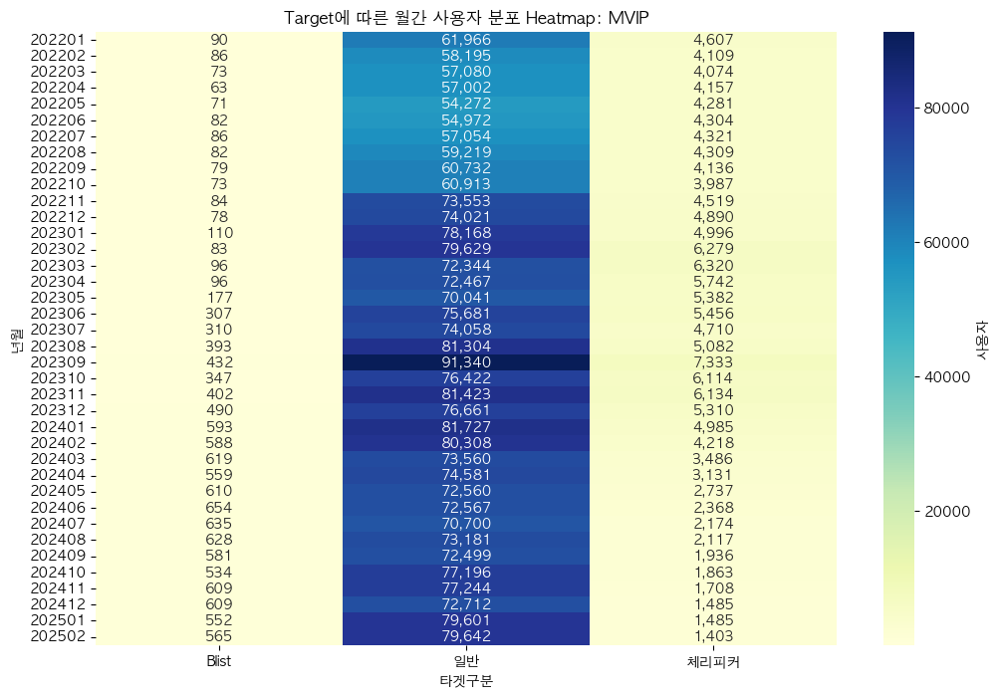

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/9200171.py:49: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


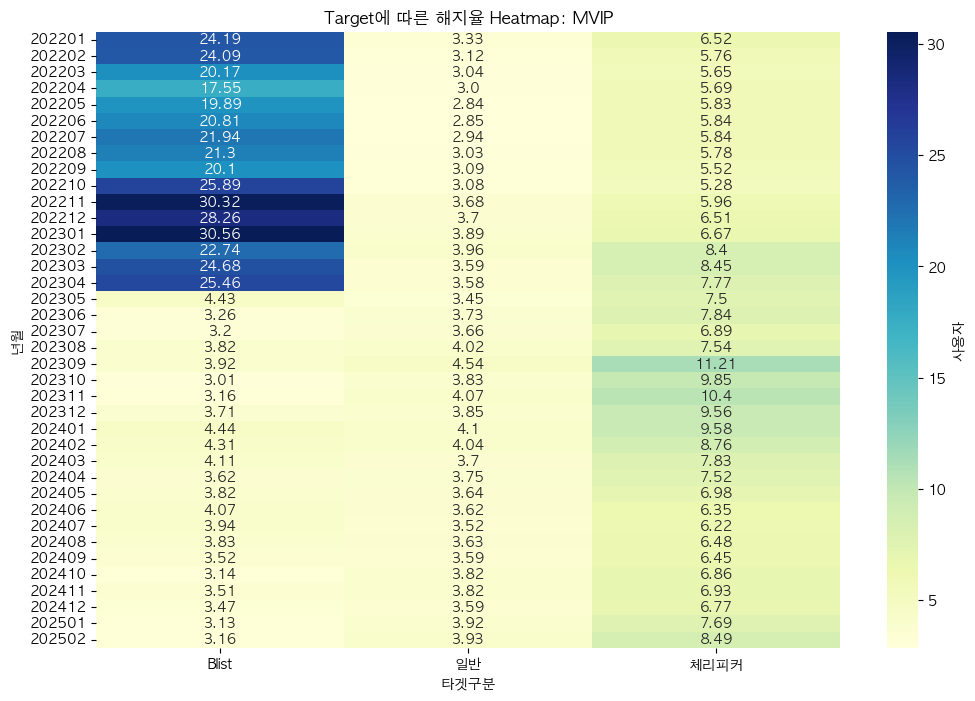

In [ ]:

# MVIP 등급만 필터링
pivot_df = tmp_df[tmp_df['vip_grade_nm'] == 'E_VIP']

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='user_type', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('Target에 따른 월간 사용자 분포 Heatmap: MVIP')
plt.xlabel('타겟구분')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()

# MVIP 등급만 필터링
pivot_df = tmp_df[tmp_df['vip_grade_nm'] == 'F_MIVP']

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='user_type', values='out_user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('Target에 따른 월간 사용자 분포 Heatmap: MVIP')
plt.xlabel('타겟구분')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()

# MVIP 등급만 필터링
pivot_df = tmp_df[tmp_df['vip_grade_nm'] == 'F_MIVP']

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='user_type', values='ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('Target에 따른 해지율 Heatmap: MVIP')
plt.xlabel('타겟구분')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/IPython/core/events.py:82: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) DejaVu Sans.
  func(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/IPython/core/events.py:82: UserWarning: Glyph 48152 (\N{HANGUL SYLLABLE BAN}) missing from font(s) DejaVu Sans.
  func(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/IPython/core/events.py:82: UserWarning: Glyph 52404 (\N{HANGUL SYLLABLE CE}) missing from font(s) DejaVu Sans.
  func(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/IPython/core/events.py:82: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from font(s) DejaVu Sans.
  func(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/IPython/core/events.py:82: UserWarning: Glyph 54588 (\N{HAN

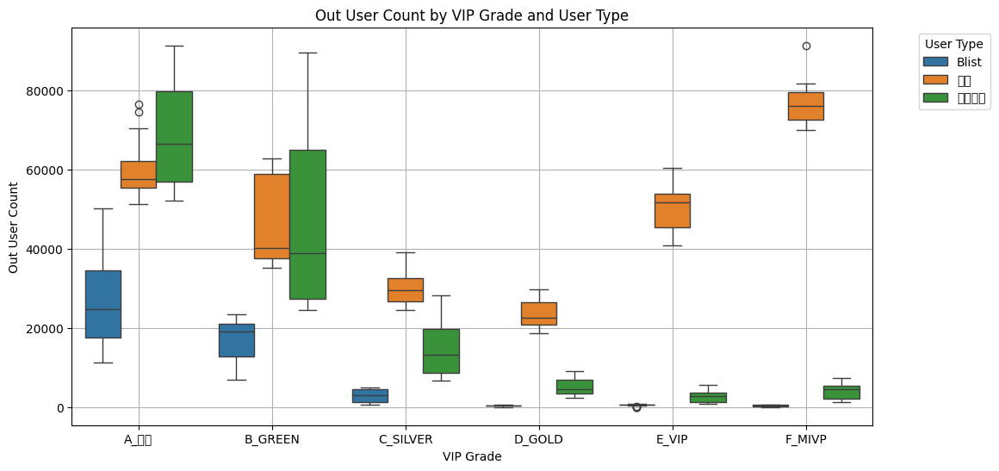

In [23]:
# vip_grade_nm 별로 user_type에 따른 out_user_cnt 추이 확인 (Box Plot)
plt.figure(figsize=(12, 6))
sns.boxplot(data=tmp_df, x='vip_grade_nm', y='out_user_cnt', hue='user_type')
plt.title('Out User Count by VIP Grade and User Type')
plt.xlabel('VIP Grade')
plt.ylabel('Out User Count')
plt.legend(title='User Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

In [20]:
st_query = '''
select year_month
     , vip_grade_nm	 
     , if(out_yn = '유지','keep','out') as out_yn
     , count(distinct member_key) as user_cnt
     , avg(ST_DAY_RATIO*100) as avg_st_day_ratio     
     --, stddev_samp(ST_DAY_RATIO*100) AS sd_st_day_ratio
     --, APPROX_PERCENTILE(ST_DAY_RATIO*100, 0.25) AS q1_st_day_ratio
     , APPROX_PERCENTILE(ST_DAY_RATIO*100, 0.5) AS q2_st_day_ratio
     --, APPROX_PERCENTILE(ST_DAY_RATIO*100, 0.75) AS q3_st_day_ratio
     , avg(DAILY_ST_CNT) as avg_daily_st_cnt
     , APPROX_PERCENTILE(DAILY_ST_CNT, 0.5) AS q2_daily_st_cnt
     , avg(LST_3MON_TOT_ST_CNT) AS avg_lst_3mon_tot_st_cnt     
from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_DTL_TB 
group by year_month, vip_grade_nm, out_yn
order by out_yn, vip_grade_nm, year_month
'''

cur.execute(st_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

st_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
st_df.head()

,year_month,vip_grade_nm,out_yn,user_cnt,avg_st_day_ratio,q2_st_day_ratio,avg_daily_st_cnt,q2_daily_st_cnt,avg_lst_3mon_tot_st_cnt
0,202201,A_일반,keep,646534,63.576675,71.428571,28.919487,14.648437,1686.955869
1,202202,A_일반,keep,626331,62.896384,70.588235,29.386767,14.257812,1631.439133
2,202203,A_일반,keep,612933,63.994023,71.875000,31.688903,14.878906,1527.723792
3,202204,A_일반,keep,648975,65.237784,73.626374,33.848943,15.859375,1610.000379
4,202205,A_일반,keep,632994,65.225751,73.684211,36.605083,15.937500,1725.524418


  year_month vip_grade_nm out_yn  user_cnt  avg_st_day_ratio  q2_st_day_ratio  \
0     202201         A_일반   keep    646534         63.576675        71.428571   
1     202202         A_일반   keep    626331         62.896384        70.588235   
2     202203         A_일반   keep    612933         63.994023        71.875000   
3     202204         A_일반   keep    648975         65.237784        73.626374   
4     202205         A_일반   keep    632994         65.225751        73.684211   

   avg_daily_st_cnt  q2_daily_st_cnt  avg_lst_3mon_tot_st_cnt  
0         28.919487        14.656250              1686.955869  
1         29.386767        14.259766              1631.439133  
2         31.688903        14.890625              1527.723792  
3         33.848943        15.843750              1610.000379  
4         36.605083        15.937500              1725.524418  


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_64323/1515037648.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_64323/1515037648.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


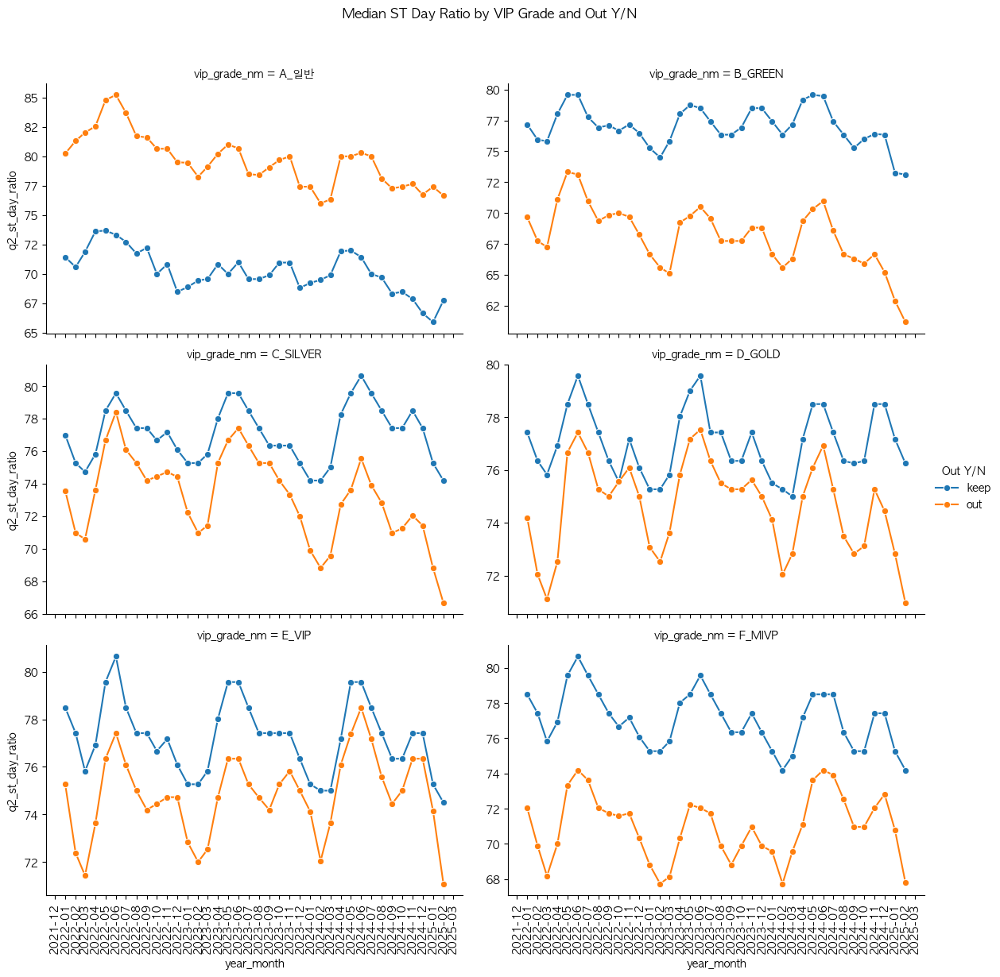

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_64323/1515037648.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_64323/1515037648.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


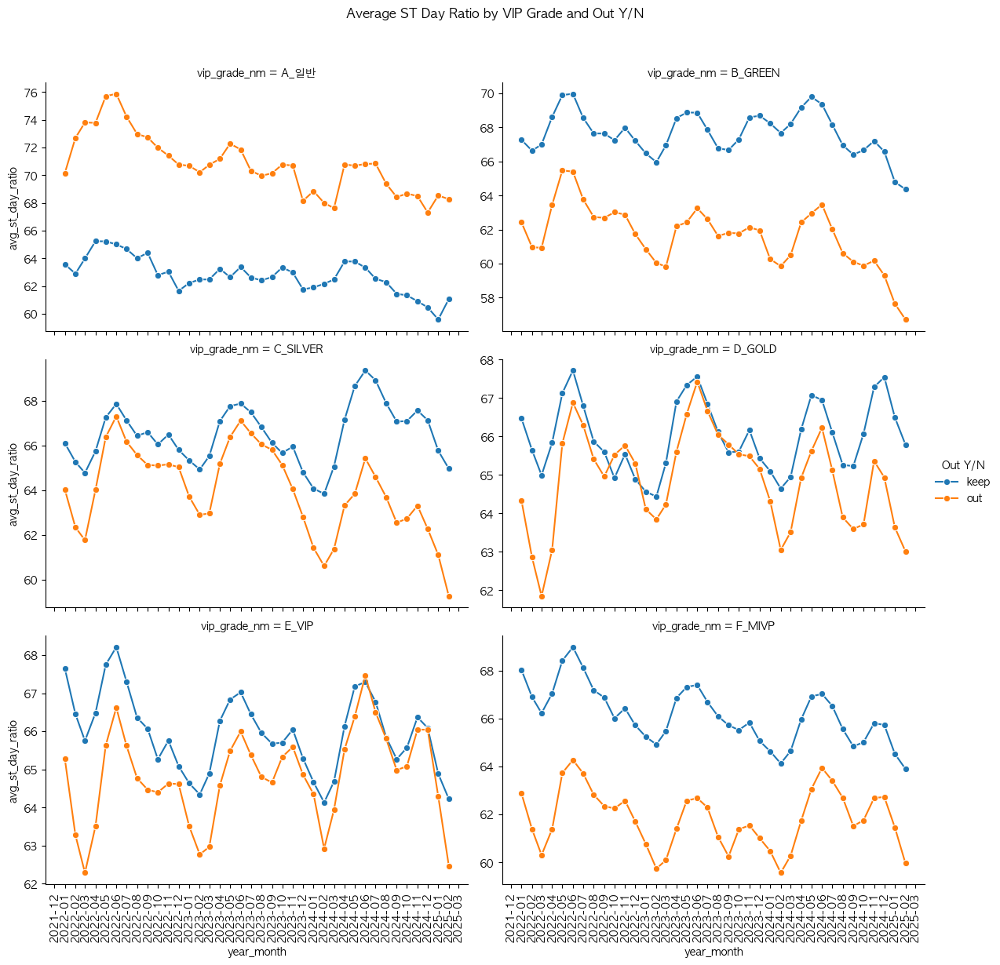

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_64323/1515037648.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_64323/1515037648.py:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


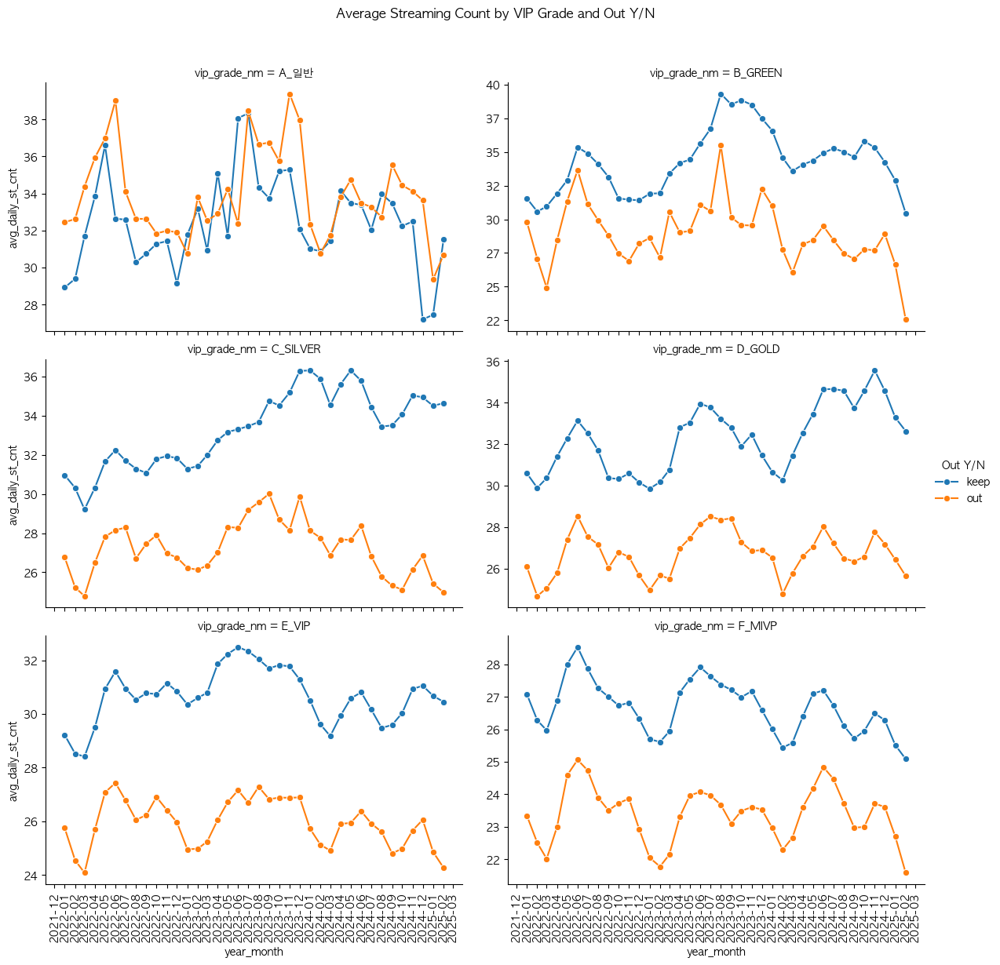

In [34]:
# 데이터프레임 확인
print(st_df.head())

# year_month를 datetime 형식으로 변환
st_df['year_month'] = pd.to_datetime(st_df['year_month'], format='%Y%m')

# vip_grade_nm 별로 year_month를 x축, q2_st_day_ratio를 y축으로 하고, out_yn에 따라 두 개의 선을 그리는 라인 플롯
g = sns.FacetGrid(st_df, col="vip_grade_nm", col_wrap=2, height=4, aspect=1.5,sharey=False)
g.map_dataframe(sns.lineplot, x='year_month', y='q2_st_day_ratio', hue='out_yn', marker='o')
g.add_legend(title='Out Y/N')

# x축 레이블 90도 회전 및 년월 형식으로 설정
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    # y축 레이블을 콤마가 있는 숫자 형식으로 설정
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Median ST Day Ratio by VIP Grade and Out Y/N')
plt.show()

# vip_grade_nm 별로 year_month를 x축, q2를 y축으로 하고, out_yn에 따라 두 개의 선을 그리는 라인 플롯
g = sns.FacetGrid(st_df, col="vip_grade_nm", col_wrap=2, height=4, aspect=1.5,sharey=False)
g.map_dataframe(sns.lineplot, x='year_month', y='avg_st_day_ratio', hue='out_yn', marker='o')
g.add_legend(title='Out Y/N')

# x축 레이블 90도 회전 및 년월 형식으로 설정
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    # y축 레이블을 콤마가 있는 숫자 형식으로 설정
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Average ST Day Ratio by VIP Grade and Out Y/N')
plt.show()


# vip_grade_nm 별로 year_month를 x축, avg_daily_st_cnt를 y축으로 하고, out_yn에 따라 두 개의 선을 그리는 라인 플롯
g = sns.FacetGrid(st_df, col="vip_grade_nm", col_wrap=2, height=4, aspect=1.5,sharey=False)
g.map_dataframe(sns.lineplot, x='year_month', y='avg_daily_st_cnt', hue='out_yn', marker='o')
g.add_legend(title='Out Y/N')

# x축 레이블 90도 회전 및 년월 형식으로 설정
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    # y축 레이블을 콤마가 있는 숫자 형식으로 설정
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Average Streaming Count by VIP Grade and Out Y/N')
plt.show()

In [98]:
print(st_df.head())

  year_month vip_grade_nm out_yn  user_cnt  avg_st_day_ratio  sd_st_day_ratio  \
0 2022-01-01         A_일반   keep    646534         62.938382        31.364888   
1 2022-02-01         A_일반   keep    626331         61.981828        31.850725   
2 2022-03-01         A_일반   keep    612933         63.290965        31.501691   
3 2022-04-01         A_일반   keep    648975         64.686192        31.170305   
4 2022-05-01         A_일반   keep    632994         64.734876        31.295350   

   q1_st_day_ratio  q2_st_day_ratio  q3_st_day_ratio  avg_lst_3mon_tot_st_cnt  \
0        38.709677        70.652174        91.176471              2930.736519   
1        36.734694        69.354839        90.625000              2948.284609   
2        38.709677        70.967742        91.666667              3179.261973   
3        41.176471        72.727273        92.592593              3380.520640   
4        40.740741        73.076923        92.982456              3642.622633   

   sd_lst_3mon_tot_st_cnt 

  year_month vip_grade_nm out_yn  user_cnt  avg_st_day_ratio  sd_st_day_ratio  \
0     202201         A_일반   keep    646534         63.576675        31.220825   
1     202202         A_일반   keep    626331         62.896384        31.547943   
2     202203         A_일반   keep    612933         63.994023        31.340790   
3     202204         A_일반   keep    648975         65.237784        31.074490   
4     202205         A_일반   keep    632994         65.225751        31.231486   

   q1_st_day_ratio  q2_st_day_ratio  q3_st_day_ratio  avg_lst_3mon_tot_st_cnt  \
0        40.000000        71.428571        91.397849              2891.948670   
1        38.636364        70.588235        91.304348              2938.676745   
2        40.000000        71.875000        92.307692              3168.890329   
3        42.062500        73.626374        93.103448              3384.894258   
4        41.666667        73.684211        93.333333              3660.508273   

   sd_lst_3mon_tot_st_cnt 

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) DejaVu Sans.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 48152 (\N{HANGUL SYLLABLE BAN}) missing from font(s) DejaVu Sans.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning: Glyph 48152 (\N{HANGUL SYLLABLE BAN}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_25213/2941617403.py:16: UserWarning: set_ticklabels() should 

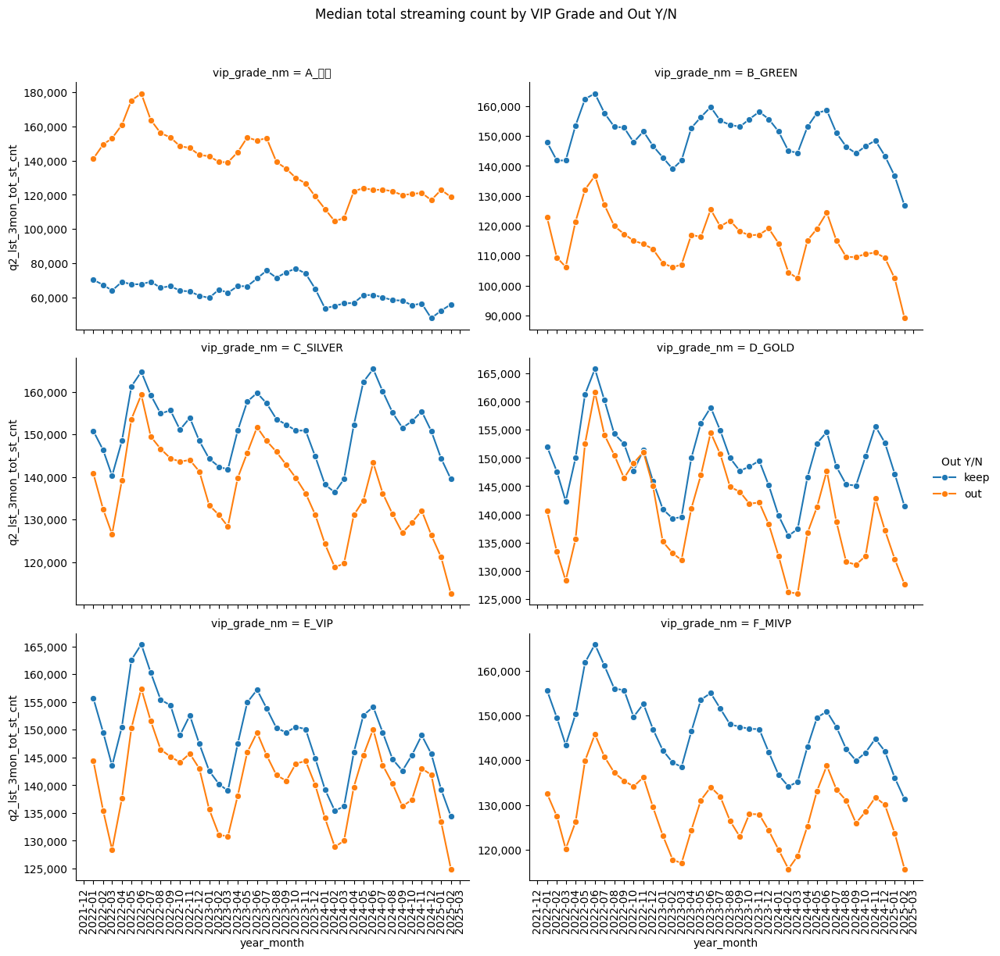

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) DejaVu Sans.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/axisgrid.py:123: UserWarning: Glyph 48152 (\N{HANGUL SYLLABLE BAN}) missing from font(s) DejaVu Sans.
  self._figure.tight_layout(*args, **kwargs)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/seaborn/utils.py:61: UserWarning: Glyph 48152 (\N{HANGUL SYLLABLE BAN}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_25213/2941617403.py:33: UserWarning: set_ticklabels() should 

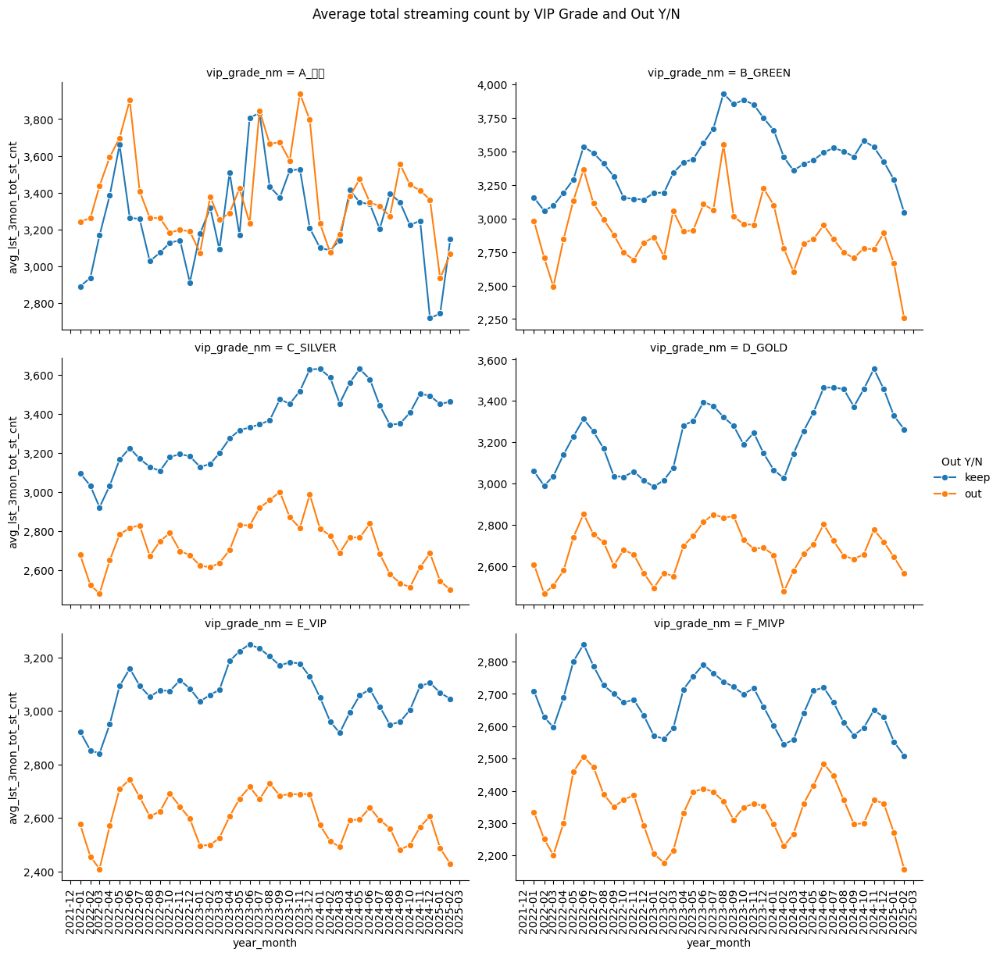

In [18]:
# 데이터프레임 확인
print(st_df.head())

# year_month를 datetime 형식으로 변환
st_df['year_month'] = pd.to_datetime(st_df['year_month'], format='%Y%m')

# vip_grade_nm 별로 year_month를 x축, q2_lst_3mon_tot_st_cnt를 y축으로 하고, out_yn에 따라 두 개의 선을 그리는 라인 플롯
g = sns.FacetGrid(st_df, col="vip_grade_nm", col_wrap=2, height=4, aspect=1.5,sharey=False)
g.map_dataframe(sns.lineplot, x='year_month', y='q2_lst_3mon_tot_st_cnt', hue='out_yn', marker='o')
g.add_legend(title='Out Y/N')

# x축 레이블 90도 회전 및 년월 형식으로 설정
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    # y축 레이블을 콤마가 있는 숫자 형식으로 설정
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Median total streaming count by VIP Grade and Out Y/N')
plt.show()

# vip_grade_nm 별로 year_month를 x축, q2를 y축으로 하고, out_yn에 따라 두 개의 선을 그리는 라인 플롯
g = sns.FacetGrid(st_df, col="vip_grade_nm", col_wrap=2, height=4, aspect=1.5,sharey=False)
g.map_dataframe(sns.lineplot, x='year_month', y='avg_lst_3mon_tot_st_cnt', hue='out_yn', marker='o')
g.add_legend(title='Out Y/N')

# x축 레이블 90도 회전 및 년월 형식으로 설정
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    # y축 레이블을 콤마가 있는 숫자 형식으로 설정
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: f'{int(x):,}'))

plt.subplots_adjust(top=0.9)
g.fig.suptitle('Average total streaming count by VIP Grade and Out Y/N')
plt.show()

In [77]:
st_day_ratio_query = '''
select A.year_month
     , A.log_month
     , case
        when A.lst_d30_st_day_ratio = 0 or lst_d30_st_day_ratio is null then '0%'
        when A.lst_d30_st_day_ratio < 25 then '1-25%'
        when A.lst_d30_st_day_ratio < 50 then '25-50%'
        when A.lst_d30_st_day_ratio < 75 then '50-75%'
        else '75-100%'
        end as st_day_ratio_group
    , count(distinct member_key) as user_cnt
    , round(cast(count(distinct member_key) as double)/cast(tot_user_cnt as double)*100,2) as user_ratio_by_st_day_ratio
	 , count(distinct if(out_yn = '유지',member_key)) as keep_user_cnt
    , round(cast(count(distinct if(out_yn = '유지',member_key)) as double)/cast(tot_keep_user_cnt as double)*100,2) as keep_user_ratio_by_st_day_ratio
    , count(distinct if(out_yn = '해지',member_key)) as out_user_cnt
    , round(cast(count(distinct if(out_yn = '해지',member_key)) as double)/cast(tot_out_user_cnt as double)*100,2) as out_user_ratio_by_st_day_ratio
	 , round(cast(count(distinct if(out_yn = '해지',member_key)) as double)/cast(count(distinct member_key) as double)*100,2) as ratio     
from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_ST_DTL_TB A
left join(
   select year_month
        , count(distinct member_key) as tot_user_cnt
        , count(distinct if(out_yn = '유지',member_key)) as tot_keep_user_cnt
        , count(distinct if(out_yn = '해지',member_key)) as tot_out_user_cnt
   from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_ST_DTL_TB
   group by 1
) B ON A.year_month = B.year_month
group by 1,2,3,tot_user_cnt,tot_keep_user_cnt,tot_out_user_cnt
order by 1,2,3
'''

cur.execute(st_day_ratio_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

st_day_ratio_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
st_day_ratio_df.head()

,year_month,log_month,st_day_ratio_group,user_cnt,user_ratio_by_st_day_ratio,keep_user_cnt,keep_user_ratio_by_st_day_ratio,out_user_cnt,out_user_ratio_by_st_day_ratio,ratio
0,202201,202201,0%,608549,11.42,557121,11.70,51428,9.05,8.45
1,202201,202201,1-25%,528713,9.92,459923,9.66,68790,12.11,13.01
2,202201,202201,25-50%,579604,10.87,509179,10.69,70425,12.40,12.15
3,202201,202201,50-75%,984688,18.47,874973,18.37,109715,19.32,11.14
4,202201,202201,75-100%,2628713,49.32,2361077,49.58,267636,47.12,10.18


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/3481532976.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['year'] = group_data['year_month'].dt.year
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/3481532976.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  group_data['year'] = group_data['year_month'].dt.year
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/3481532976.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy 

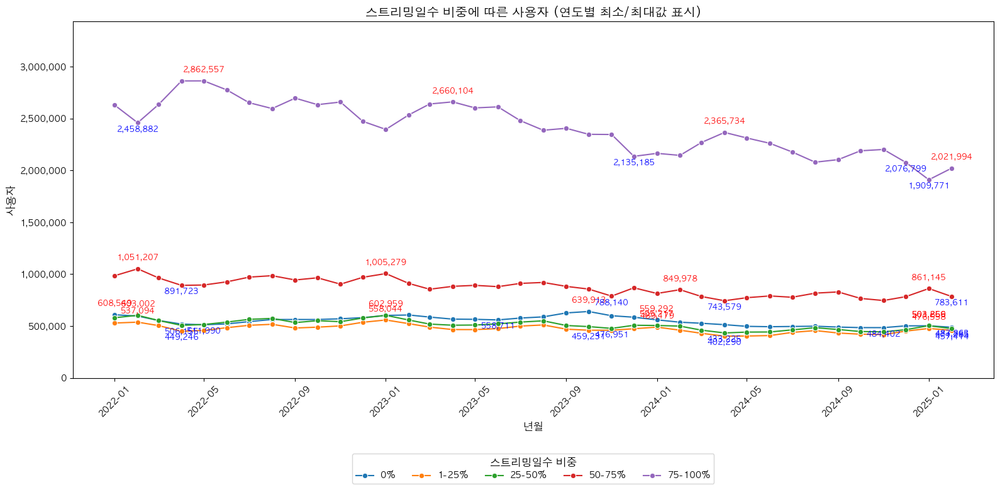

In [10]:
# year_month를 datetime 형식으로 변환
st_day_ratio_df['year_month'] = pd.to_datetime(st_day_ratio_df['year_month'], format='%Y%m')

# 라인 플롯 그리기
plt.figure(figsize=(16, 8))
ax = sns.lineplot(
    data=st_day_ratio_df,
    x='year_month',
    y='user_cnt',
    hue='st_day_ratio_group',
    marker='o'
)

# 각 데이터 포인트에 연도별 최소값 및 최대값 라벨 표시
for line in st_day_ratio_df['st_day_ratio_group'].unique():
    group_data = st_day_ratio_df[st_day_ratio_df['st_day_ratio_group'] == line]
    
    # 연도별 최소값 및 최대값 계산
    group_data['year'] = group_data['year_month'].dt.year
    min_values = group_data.loc[group_data.groupby('year')['user_cnt'].idxmin()]
    max_values = group_data.loc[group_data.groupby('year')['user_cnt'].idxmax()]
    
    # 최소값과 최대값 라벨 표시
    for x, y in zip(min_values['year_month'], min_values['user_cnt']):
        ax.annotate(
            f'{y:,.0f}', (x, y), textcoords="offset points", 
            xytext=(0, -10), ha='center', fontsize=9, color='blue', fontweight='bold'
        )
    for x, y in zip(max_values['year_month'], max_values['user_cnt']):
        ax.annotate(
            f'{y:,.0f}', (x, y), textcoords="offset points", 
            xytext=(0, 10), ha='center', fontsize=9, color='red', fontweight='bold'
        )

# y축 범위 설정 (길이를 늘림)
plt.ylim(0, st_day_ratio_df['user_cnt'].max() * 1.2)  # 최대값의 20% 여유 추가

# 그래프 제목 및 레이블 설정
plt.title('스트리밍일수 비중에 따른 사용자 (연도별 최소/최대값 표시)', fontsize=14)
plt.xlabel('년월', fontsize=12)
plt.ylabel('사용자', fontsize=12)

# x축 레이블 45도 회전
plt.xticks(rotation=45)

# y축을 천 단위 콤마 형식으로 설정
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: f'{int(x):,}'))

# 범례 설정 (아래로 이동)
plt.legend(
    title='스트리밍일수 비중',
    bbox_to_anchor=(0.5, -0.2),  # 그래프 아래 중앙에 위치
    loc='upper center',
    ncol=5,  # 범례를 여러 열로 나눔
    fontsize=10,
    title_fontsize=12
)

# 그래프 표시
plt.tight_layout()
plt.show()

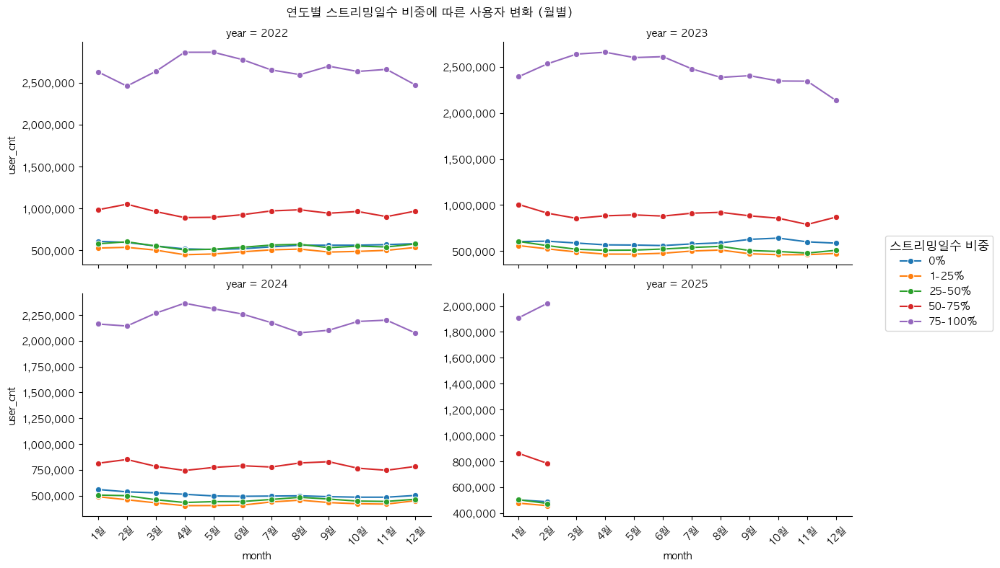

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# year_month를 datetime 형식으로 변환
st_day_ratio_df['year_month'] = pd.to_datetime(st_day_ratio_df['year_month'], format='%Y%m')

# 연도별로 year와 month 컬럼 추가
st_day_ratio_df['year'] = st_day_ratio_df['year_month'].dt.year
st_day_ratio_df['month'] = st_day_ratio_df['year_month'].dt.month

# y축 값이 null인 데이터를 제외
filtered_df = st_day_ratio_df.dropna(subset=['user_cnt'])

# FacetGrid를 사용하여 연도별로 라인 플롯 생성
g = sns.FacetGrid(filtered_df, col="year", col_wrap=2, height=4, aspect=1.5, sharey=False)
g.map_dataframe(
    sns.lineplot,
    x='month',
    y='user_cnt',
    hue='st_day_ratio_group',
    marker='o'
)

# x축 레이블 설정 (월 표시)
for ax in g.axes.flatten():
    ax.set_xticks(range(1, 13))  # 1월부터 12월까지 x축 설정
    ax.set_xticklabels([f'{m}월' for m in range(1, 13)], rotation=45)  # 월 이름 표시

# y축을 숫자 + 콤마 형식으로 설정
for ax in g.axes.flatten():
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

# 범례를 오른쪽으로 이동
handles, labels = g.axes[0].get_legend_handles_labels()  # 범례 핸들과 라벨 가져오기
g.fig.legend(
    handles=handles,
    labels=labels,
    title='스트리밍일수 비중',
    bbox_to_anchor=(1.02, 0.5),  # 그래프 오른쪽 중앙에 위치
    loc='center left',
    fontsize=10,
    title_fontsize=12
)

# 전체 제목 설정
plt.subplots_adjust(top=0.9, right=0.85)  # 그래프와 범례 간격 조정
g.fig.suptitle("연도별 스트리밍일수 비중에 따른 사용자 변화 (월별)")

# 그래프 표시
plt.tight_layout()
plt.show()

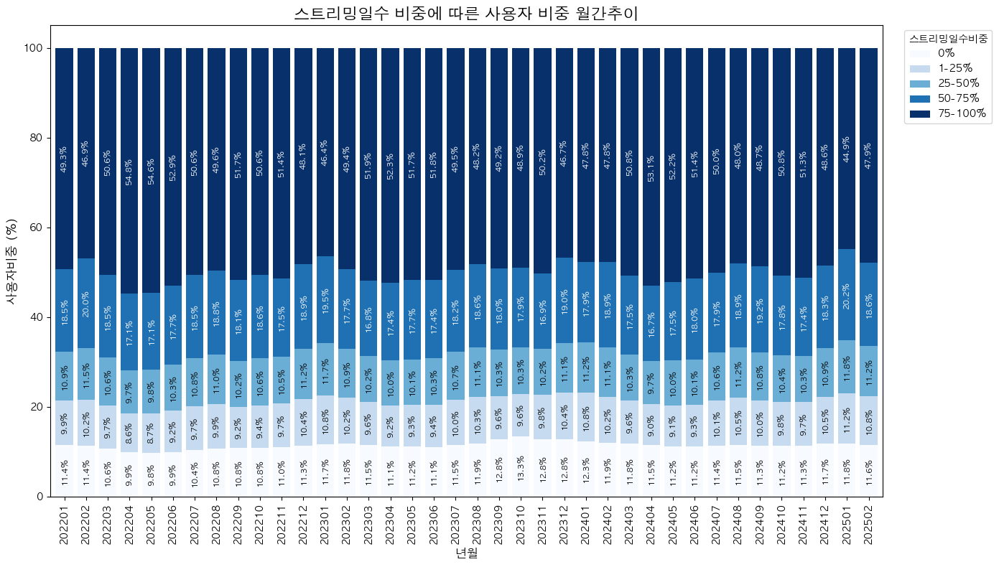

In [13]:
# 데이터를 피벗 테이블로 변환 (stacking을 위해)
pivot_table = st_day_ratio_df.pivot_table(
    index='log_month',
    columns='st_day_ratio_group',
    values='user_ratio_by_st_day_ratio',
    aggfunc='sum'
)

# 스택형 바 플롯 그리기
fig, ax = plt.subplots(figsize=(15, 8))
bars = pivot_table.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 8),
    colormap='Blues',
    width=0.8,
    ax=ax
)

# 각 영역에 비율 값 추가
for container, group in zip(bars.containers, pivot_table.columns):
    for bar in container:
        if bar.get_height() > 0:  # 높이가 0보다 큰 경우만 표시
            height = bar.get_height()
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_y() + height / 2
            # 그룹에 따라 텍스트 색상 설정
            text_color = 'white' if group in ['75-100%', '50-75%'] else 'black'
            ax.text(
                x, y, f'{height:.1f}%', 
                ha='center', va='center', 
                fontsize=8, color=text_color, 
                rotation=90  # 텍스트를 90도로 회전
            )

# 그래프 제목 및 레이블 설정
plt.title('스트리밍일수 비중에 따른 사용자 비중 월간추이', fontsize=16)
plt.xlabel('년월', fontsize=12)
plt.ylabel('사용자비중 (%)', fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.legend(title='스트리밍일수비중', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10)

# 그래프 표시
plt.tight_layout()
plt.show()

In [17]:
# 평균값 피벗 테이블
mean_pivot = result.pivot(index='year', columns='st_day_ratio_group', values='mean')
print("평균값 피벗 테이블:")
print(mean_pivot)

# 중위값 피벗 테이블
median_pivot = result.pivot(index='year', columns='st_day_ratio_group', values='median')
print("중위값 피벗 테이블:")
print(median_pivot)

평균값 피벗 테이블:
st_day_ratio_group         0%      1-25%     25-50%     50-75%    75-100%
year                                                                     
2022                10.670000   9.555833  10.583333  18.261667  50.929167
2023                11.965000   9.841667  10.580000  17.919167  49.692500
2024                11.541667   9.893333  10.539167  17.990833  50.035000
2025                11.675000  11.020000  11.530000  19.400000  46.385000
중위값 피벗 테이블:
st_day_ratio_group      0%   1-25%  25-50%  50-75%  75-100%
year                                                       
2022                10.770   9.680  10.610  18.485   50.640
2023                11.735   9.725  10.325  17.795   49.475
2024                11.445   9.895  10.500  17.905   50.410
2025                11.675  11.020  11.530  19.400   46.385


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/2197407446.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]


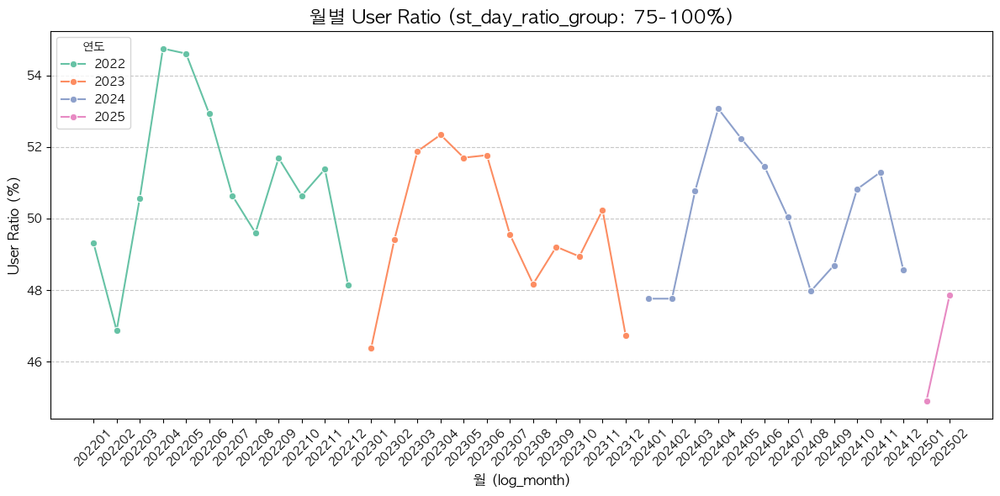

In [78]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# st_day_ratio_group이 '75-100%'인 데이터 필터링
filtered_df = st_day_ratio_df[st_day_ratio_df['st_day_ratio_group'] == '75-100%']

# log_month에서 연도 추출
filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]

# 그래프 생성
plt.figure(figsize=(12, 6))

# Line plot 생성 (hue='year'로 연도별 나눔)
sns.lineplot(data=filtered_df, x='log_month', y='user_ratio_by_st_day_ratio', hue='year', marker='o', palette='Set2')

# 그래프 제목 및 레이블 설정
plt.title('월별 User Ratio (st_day_ratio_group: 75-100%)', fontsize=16)
plt.xlabel('월 (log_month)', fontsize=12)
plt.ylabel('User Ratio (%)', fontsize=12)
plt.xticks(rotation=45)  # x축 레이블 45도 회전
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 범례 설정
plt.legend(title='연도', fontsize=10, loc='upper left')

# 그래프 표시
plt.tight_layout()
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/3082727715.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]


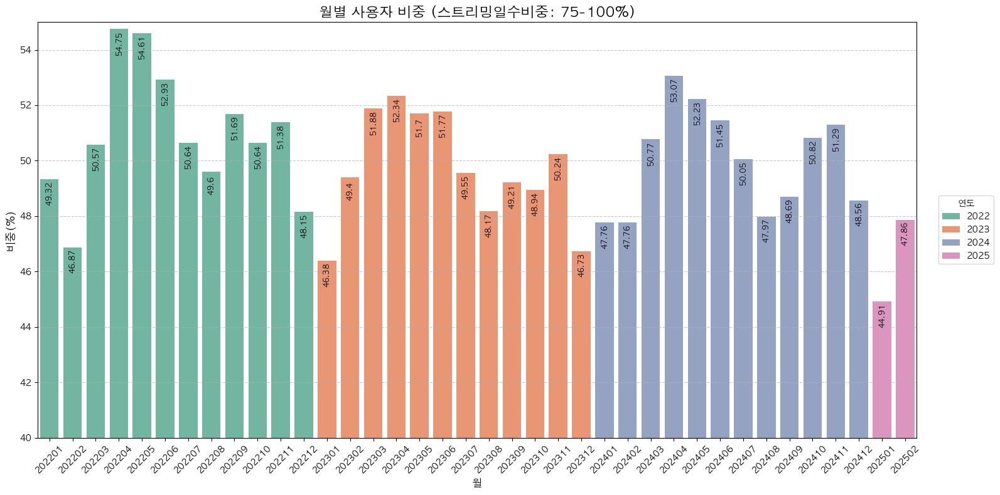

In [101]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# st_day_ratio_group이 '75-100%'인 데이터 필터링
filtered_df = st_day_ratio_df[st_day_ratio_df['st_day_ratio_group'] == '75-100%']

# log_month에서 연도 추출
filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]

# 그래프 생성
plt.figure(figsize=(16, 8))

# Bar plot 생성 (hue='year'로 연도별 나눔)
barplot = sns.barplot(
    data=filtered_df,
    x='log_month',
    y='user_ratio_by_st_day_ratio',
    hue='year',
    palette='Set2'
)

# y축 범위 설정
plt.ylim(40, 55)

# 각 막대에 값 표시 (소수 둘째 자리에서 반올림, 막대 안에 표시)
for p in barplot.patches:
    value = round(p.get_height(), 2)  # 소수 둘째 자리에서 반올림
    if not pd.isna(value):  # 값이 NaN이 아닌 경우에만 표시
        barplot.annotate(
            f'{value}',
            (p.get_x() + p.get_width() / 2., p.get_height() - .5),  # 막대 안에 위치
            ha='center', va='center',
            fontsize=9, color='black', rotation=90  # 검은색 텍스트, 90도 회전
        )

# 그래프 제목 및 레이블 설정
plt.title('월별 사용자 비중 (스트리밍일수비중: 75-100%)', fontsize=16)
plt.xlabel('월', fontsize=12)
plt.ylabel('비중(%)', fontsize=12)
plt.xticks(rotation=45)  # x축 레이블 45도 회전
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 범례 설정 (그림 바깥으로 이동)
plt.legend(title='연도', fontsize=10, loc='center left', bbox_to_anchor=(1.02, 0.5))

# 그래프 표시
plt.tight_layout()
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/2051878101.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]


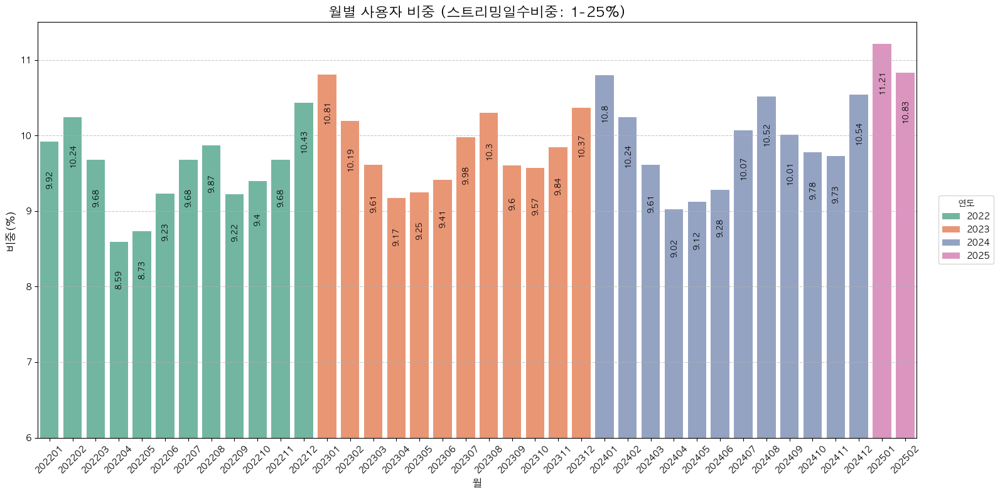

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# st_day_ratio_group이 '75-100%'인 데이터 필터링
filtered_df = st_day_ratio_df[st_day_ratio_df['st_day_ratio_group'] == '1-25%']

# log_month에서 연도 추출
filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]

# 그래프 생성
plt.figure(figsize=(16, 8))

# Bar plot 생성 (hue='year'로 연도별 나눔)
barplot = sns.barplot(
    data=filtered_df,
    x='log_month',
    y='user_ratio_by_st_day_ratio',
    hue='year',
    palette='Set2'
)

# y축 범위 설정
plt.ylim(6, 11.5)

# 각 막대에 값 표시 (소수 둘째 자리에서 반올림, 막대 안에 표시)
for p in barplot.patches:
    value = round(p.get_height(), 2)  # 소수 둘째 자리에서 반올림
    if not pd.isna(value):  # 값이 NaN이 아닌 경우에만 표시
        barplot.annotate(
            f'{value}',
            (p.get_x() + p.get_width() / 2., p.get_height() - .5),  # 막대 안에 위치
            ha='center', va='center',
            fontsize=9, color='black', rotation=90  # 검은색 텍스트, 90도 회전
        )

# 그래프 제목 및 레이블 설정
plt.title('월별 사용자 비중 (스트리밍일수비중: 1-25%)', fontsize=16)
plt.xlabel('월', fontsize=12)
plt.ylabel('비중(%)', fontsize=12)
plt.xticks(rotation=45)  # x축 레이블 45도 회전
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 범례 설정 (그림 바깥으로 이동)
plt.legend(title='연도', fontsize=10, loc='center left', bbox_to_anchor=(1.02, 0.5))

# 그래프 표시
plt.tight_layout()
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/2395042952.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]


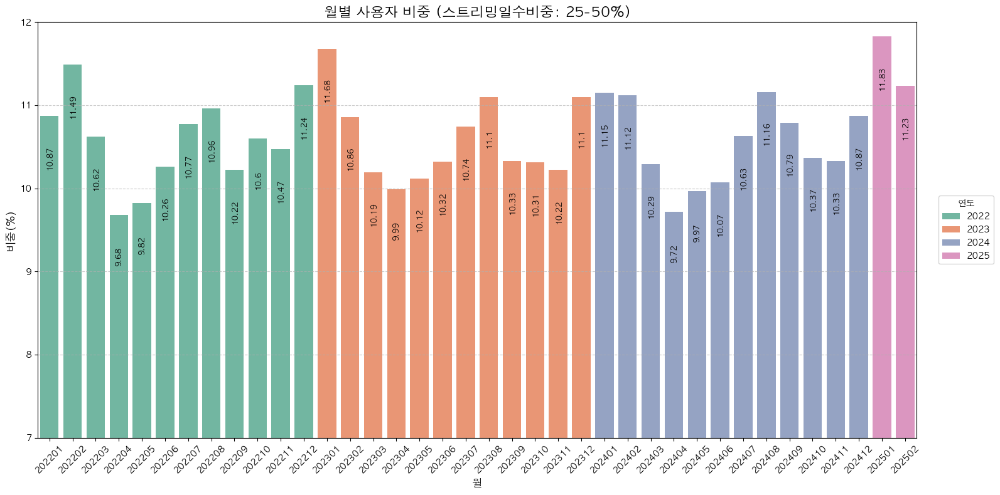

In [106]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# st_day_ratio_group이 '75-100%'인 데이터 필터링
filtered_df = st_day_ratio_df[st_day_ratio_df['st_day_ratio_group'] == '25-50%']

# log_month에서 연도 추출
filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]

# 그래프 생성
plt.figure(figsize=(16, 8))

# Bar plot 생성 (hue='year'로 연도별 나눔)
barplot = sns.barplot(
    data=filtered_df,
    x='log_month',
    y='user_ratio_by_st_day_ratio',
    hue='year',
    palette='Set2'
)

# y축 범위 설정
plt.ylim(7, 12)

# 각 막대에 값 표시 (소수 둘째 자리에서 반올림, 막대 안에 표시)
for p in barplot.patches:
    value = round(p.get_height(), 2)  # 소수 둘째 자리에서 반올림
    if not pd.isna(value):  # 값이 NaN이 아닌 경우에만 표시
        barplot.annotate(
            f'{value}',
            (p.get_x() + p.get_width() / 2., p.get_height() - .5),  # 막대 안에 위치
            ha='center', va='center',
            fontsize=9, color='black', rotation=90  # 검은색 텍스트, 90도 회전
        )

# 그래프 제목 및 레이블 설정
plt.title('월별 사용자 비중 (스트리밍일수비중: 25-50%)', fontsize=16)
plt.xlabel('월', fontsize=12)
plt.ylabel('비중(%)', fontsize=12)
plt.xticks(rotation=45)  # x축 레이블 45도 회전
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 범례 설정 (그림 바깥으로 이동)
plt.legend(title='연도', fontsize=10, loc='center left', bbox_to_anchor=(1.02, 0.5))

# 그래프 표시
plt.tight_layout()
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/3326440875.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]


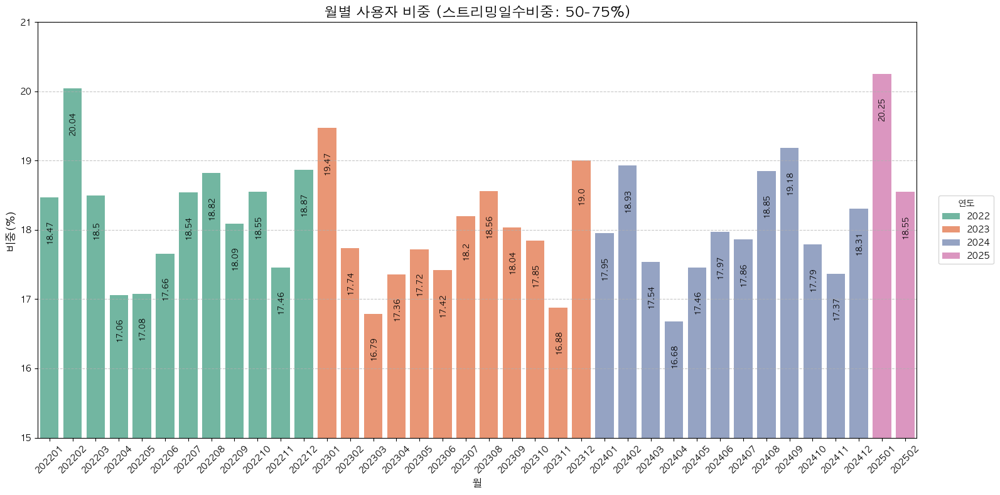

In [108]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# st_day_ratio_group이 '75-100%'인 데이터 필터링
filtered_df = st_day_ratio_df[st_day_ratio_df['st_day_ratio_group'] == '50-75%']

# log_month에서 연도 추출
filtered_df['year'] = filtered_df['log_month'].astype(str).str[:4]

# 그래프 생성
plt.figure(figsize=(16, 8))

# Bar plot 생성 (hue='year'로 연도별 나눔)
barplot = sns.barplot(
    data=filtered_df,
    x='log_month',
    y='user_ratio_by_st_day_ratio',
    hue='year',
    palette='Set2'
)

# y축 범위 설정
plt.ylim(15, 21)

# 각 막대에 값 표시 (소수 둘째 자리에서 반올림, 막대 안에 표시)
for p in barplot.patches:
    value = round(p.get_height(), 2)  # 소수 둘째 자리에서 반올림
    if not pd.isna(value):  # 값이 NaN이 아닌 경우에만 표시
        barplot.annotate(
            f'{value}',
            (p.get_x() + p.get_width() / 2., p.get_height() - .5),  # 막대 안에 위치
            ha='center', va='center',
            fontsize=9, color='black', rotation=90  # 검은색 텍스트, 90도 회전
        )

# 그래프 제목 및 레이블 설정
plt.title('월별 사용자 비중 (스트리밍일수비중: 50-75%)', fontsize=16)
plt.xlabel('월', fontsize=12)
plt.ylabel('비중(%)', fontsize=12)
plt.xticks(rotation=45)  # x축 레이블 45도 회전
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 범례 설정 (그림 바깥으로 이동)
plt.legend(title='연도', fontsize=10, loc='center left', bbox_to_anchor=(1.02, 0.5))

# 그래프 표시
plt.tight_layout()
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/3275220031.py:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


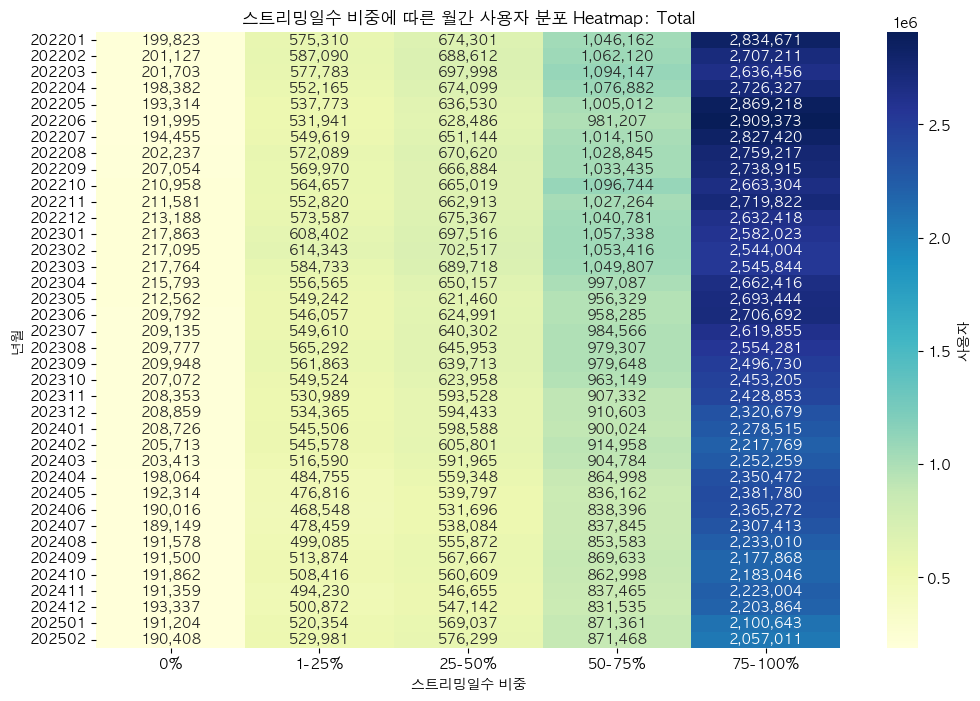

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/3275220031.py:25: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


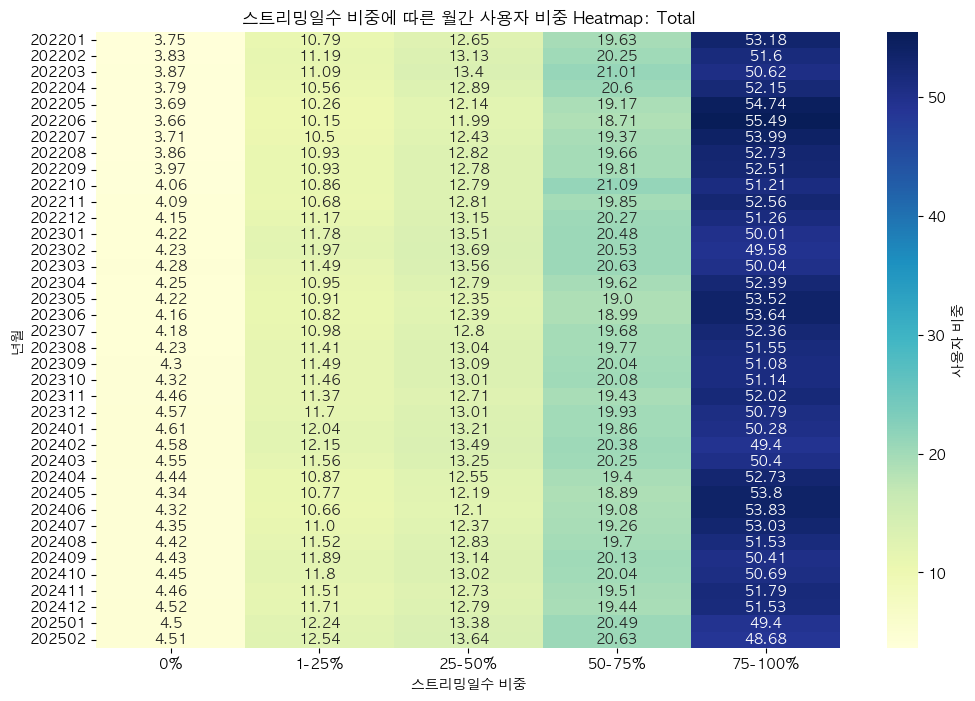

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/3275220031.py:42: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


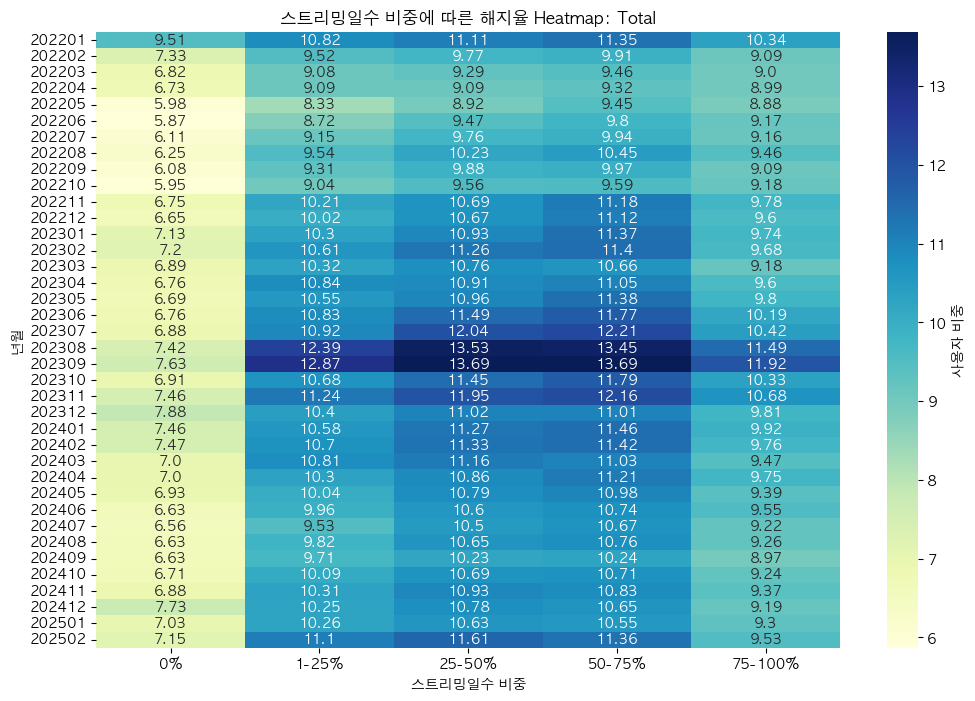

In [23]:

# 피벗 테이블 생성
pivot_table = st_day_ratio_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 분포 Heatmap: Total')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = st_day_ratio_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_ratio_by_st_day_ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 비중 Heatmap: Total')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = st_day_ratio_df.pivot(index='year_month', columns='st_day_ratio_group', values='ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지율 Heatmap: Total')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/152571712.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


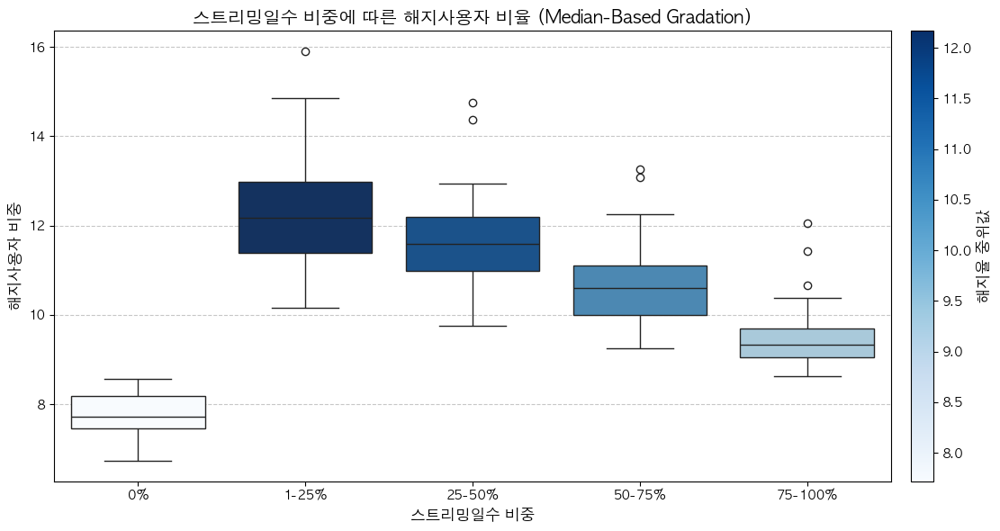

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# 그룹별 ratio 중위값 계산
median_ratios = st_day_ratio_df.groupby('st_day_ratio_group')['ratio'].median().sort_values()

# 색상 매핑 (중위값 순서에 따라 그라데이션 적용)
norm = Normalize(vmin=median_ratios.min(), vmax=median_ratios.max())
cmap = plt.cm.Blues  # 원하는 컬러맵 선택
colors = {group: cmap(norm(median)) for group, median in median_ratios.items()}

# x축 순서 지정
x_order = ['0%', '1-25%', '25-50%','50-75%', '75-100%']


# Box Plot 그리기
fig, ax = plt.subplots(figsize=(12, 6))  # Axes 객체 생성
sns.boxplot(
    data=st_day_ratio_df,
    x='st_day_ratio_group',
    y='ratio',
    order=x_order,  # 지정된 순서로 정렬
    palette=colors,  # 색상 적용
    ax=ax  # Axes 지정
)

# 컬러바 추가
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.02)  # Axes 지정
cbar.set_label('해지율 중위값', fontsize=12)

# 그래프 제목 및 레이블 설정
ax.set_title('스트리밍일수 비중에 따른 해지사용자 비율 (Median-Based Gradation)', fontsize=14)
ax.set_xlabel('스트리밍일수 비중', fontsize=12)
ax.set_ylabel('해지사용자 비중', fontsize=12)

# 그리드 추가
ax.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

In [20]:
st_day_ratio_group_query = '''
select A.year_month
     , A.log_month
     , A.vip_grade_nm	 
     , case
        when A.lst_d30_st_day_ratio = 0 or lst_d30_st_day_ratio is null then '0%'
        when A.lst_d30_st_day_ratio < 25 then '1-25%'
        when A.lst_d30_st_day_ratio < 50 then '25-50%'
        when A.lst_d30_st_day_ratio < 75 then '50-75%'
        else '75-100%'
        end as st_day_ratio_group
    , count(distinct member_key) as user_cnt
    , round(cast(count(distinct member_key) as double)/cast(tot_user_cnt as double)*100,2) as user_ratio_by_st_day_ratio
	 , count(distinct if(out_yn = '유지',member_key)) as keep_user_cnt
    , round(cast(count(distinct if(out_yn = '유지',member_key)) as double)/cast(tot_keep_user_cnt as double)*100,2) as keep_user_ratio_by_st_day_ratio
    , count(distinct if(out_yn = '해지',member_key)) as out_user_cnt
    , round(cast(count(distinct if(out_yn = '해지',member_key)) as double)/cast(tot_out_user_cnt as double)*100,2) as out_user_ratio_by_st_day_ratio
	 , round(cast(count(distinct if(out_yn = '해지',member_key)) as double)/cast(count(distinct member_key) as double)*100,2) as ratio     
from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_ST_DTL_TB A
left join(
   select year_month
        , vip_grade_nm
        , count(distinct member_key) as tot_user_cnt
        , count(distinct if(out_yn = '유지',member_key)) as tot_keep_user_cnt
        , count(distinct if(out_yn = '해지',member_key)) as tot_out_user_cnt
   from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_ST_DTL_TB
   group by 1,2
) B ON A.year_month = B.year_month AND A.vip_grade_nm = B.vip_grade_nm
group by 1,2,3,4,tot_user_cnt,tot_keep_user_cnt,tot_out_user_cnt
order by 3,4,1
'''

cur.execute(st_day_ratio_group_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

st_day_ratio_group_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
st_day_ratio_group_df.head()

,year_month,log_month,vip_grade_nm,st_day_ratio_group,user_cnt,user_ratio_by_st_day_ratio,keep_user_cnt,keep_user_ratio_by_st_day_ratio,out_user_cnt,out_user_ratio_by_st_day_ratio,ratio
0,202201,202201,A_일반,0%,257755,29.90,244433,37.81,13322,6.18,5.17
1,202202,202202,A_일반,0%,241367,30.81,234505,37.44,6862,4.37,2.84
2,202203,202203,A_일반,0%,208112,26.86,203169,33.15,4943,3.05,2.38
3,202204,202204,A_일반,0%,193147,23.95,186874,28.80,6273,3.98,3.25
4,202205,202205,A_일반,0%,184549,23.70,179362,28.34,5187,3.56,2.81


In [21]:
# year_month를 datetime 형식으로 변환
st_day_ratio_group_df['log_month'] = pd.to_datetime(st_day_ratio_group_df['log_month'], format='%Y%m')


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/3596449568.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/3596449568.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(x_order, rotation=0)  # x축 레이블 설정
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/3596449568.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/3596449568.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. afte

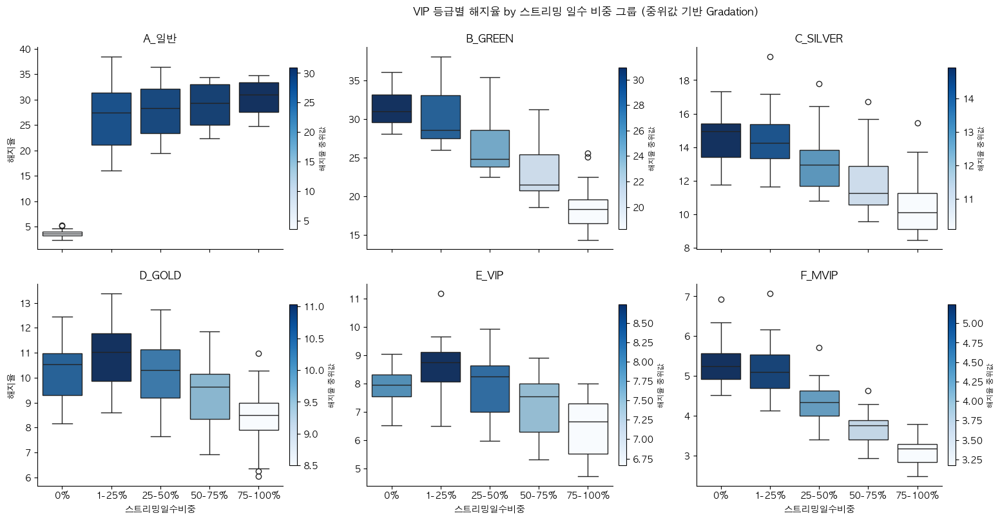

In [24]:
# x축 순서 지정
x_order = ['0%', '1-25%', '25-50%', '50-75%', '75-100%']

# 각 vip_grade_nm 그룹별로 색상 매핑
def get_palette(data, group_col, value_col, cmap_name="Blues"):
    """그룹별로 중위값 기반 색상 매핑을 생성"""
    median_ratios = data.groupby(group_col)[value_col].median()
    norm = Normalize(vmin=median_ratios.min(), vmax=median_ratios.max())
    cmap = plt.get_cmap(cmap_name)
    return {group: cmap(norm(median)) for group, median in median_ratios.items()}, norm, cmap

# FacetGrid 생성
g = sns.FacetGrid(st_day_ratio_group_df, col="vip_grade_nm", col_wrap=3, height=4, aspect=1.5, sharey=False)

# 각 Facet에 대해 boxplot 그리기
for ax, (vip_grade, data) in zip(g.axes.flatten(), st_day_ratio_group_df.groupby("vip_grade_nm")):
    # 그룹별 색상 매핑 생성
    palette, norm, cmap = get_palette(data, "st_day_ratio_group", "ratio")
    
    # Boxplot 그리기
    sns.boxplot(
        data=data,
        x="st_day_ratio_group",
        y="ratio",
        order=x_order,
        palette=palette,
        ax=ax
    )
    ax.set_title(vip_grade)  # 각 subplot에 제목 설정
    ax.set_xticklabels(x_order, rotation=0)  # x축 레이블 설정

    # 컬러바 추가
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # 빈 배열 설정
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', pad=0.02, shrink=0.8)
    cbar.set_label('해지율 중위값', fontsize=8)

# 전체 제목 및 레이블 설정
g.set_axis_labels("스트리밍일수비중", "해지율")
plt.subplots_adjust(top=0.9, right=0.85)  # 그래프와 컬러바 간격 조정
g.fig.suptitle("VIP 등급별 해지율 by 스트리밍 일수 비중 그룹 (중위값 기반 Gradation)")

# 그래프 표시
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/1004282008.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/1004282008.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_21169/1004282008.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


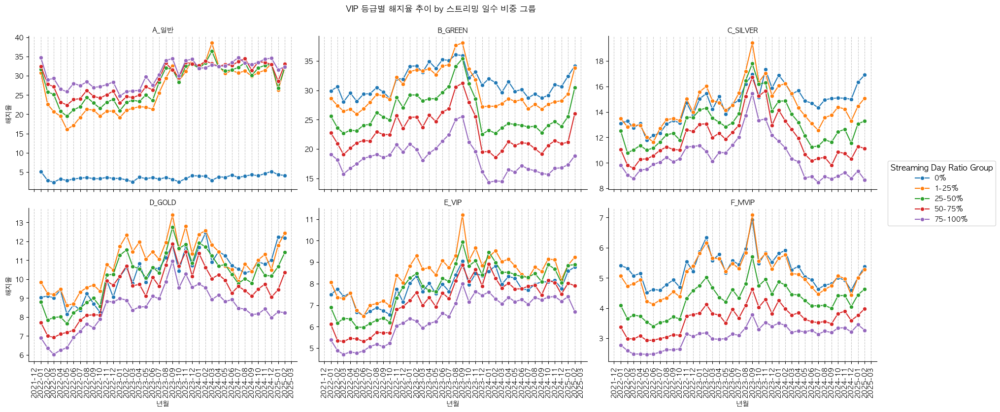

In [25]:
# vip_grade_nm 별로 year_month를 x축, q2를 y축으로 하고, out_yn에 따라 두 개의 선을 그리는 라인 플롯
g = sns.FacetGrid(st_day_ratio_group_df, col="vip_grade_nm", col_wrap=3, height=4, aspect=1.5, sharey=False)
g.map_dataframe(sns.lineplot, x='log_month', y='ratio', hue='st_day_ratio_group', marker='o')

# x축 레이블 90도 회전 및 년월 형식으로 설정
for ax in g.axes.flatten():
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.MonthLocator())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.grid(axis='x', linestyle='--', alpha=0.7)  # x축에 그리드 선 추가

# 범례를 오른쪽으로 이동
handles, labels = g.axes[0].get_legend_handles_labels()  # 범례 핸들과 라벨 가져오기
g.fig.legend(
    handles=handles,
    labels=labels,
    title='Streaming Day Ratio Group',
    bbox_to_anchor=(1.0, 0.5),  # 그래프 오른쪽 중앙에 위치
    loc='center left',
    fontsize=10,
    title_fontsize=12
)

# 그래프 제목 및 레이블 설정
g.set_axis_labels("년월", "해지율")
g.set_titles("{col_name}")

# 전체 제목 설정
plt.subplots_adjust(top=0.9)
g.fig.suptitle("VIP 등급별 해지율 추이 by 스트리밍 일수 비중 그룹")

# 그래프 표시
plt.show()

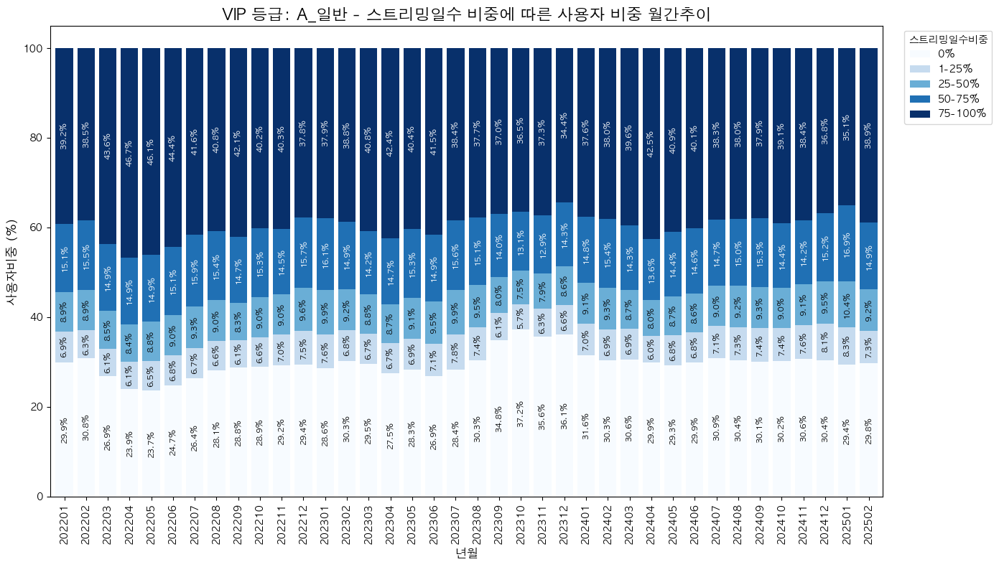

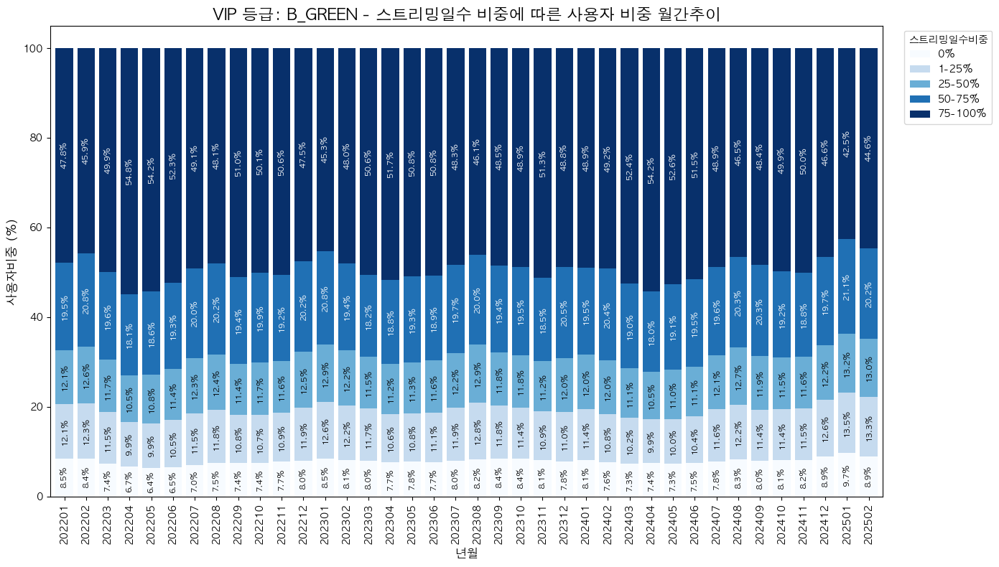

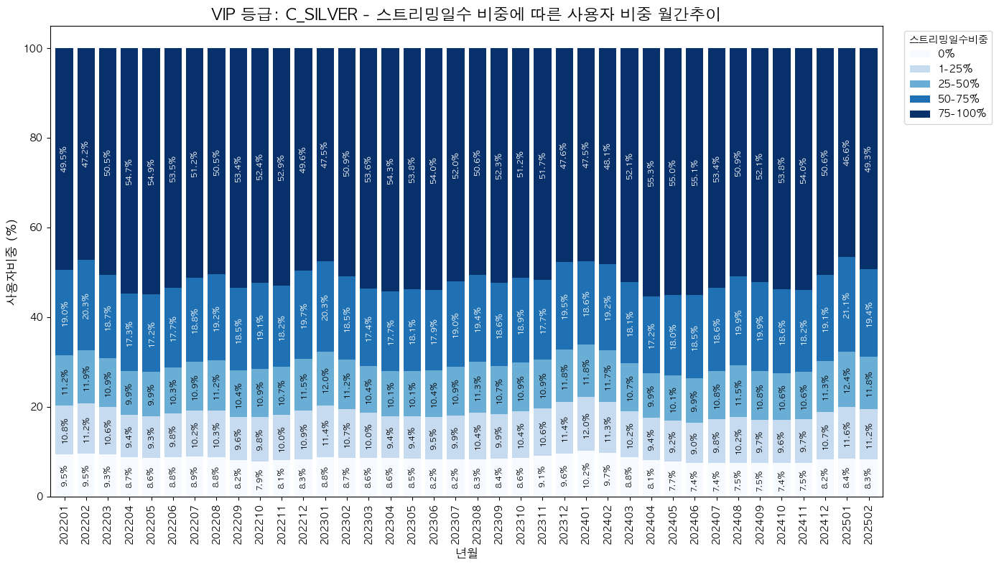

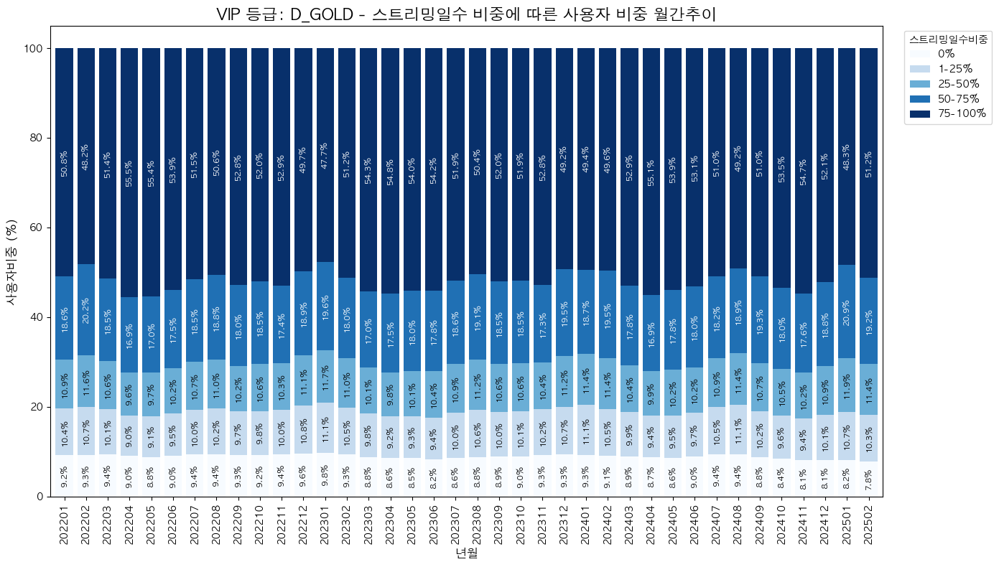

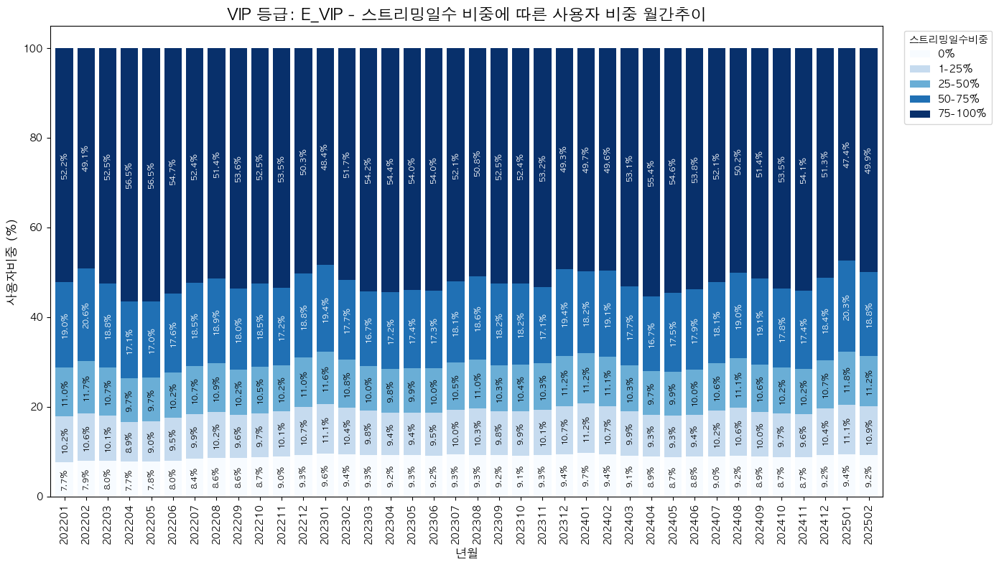

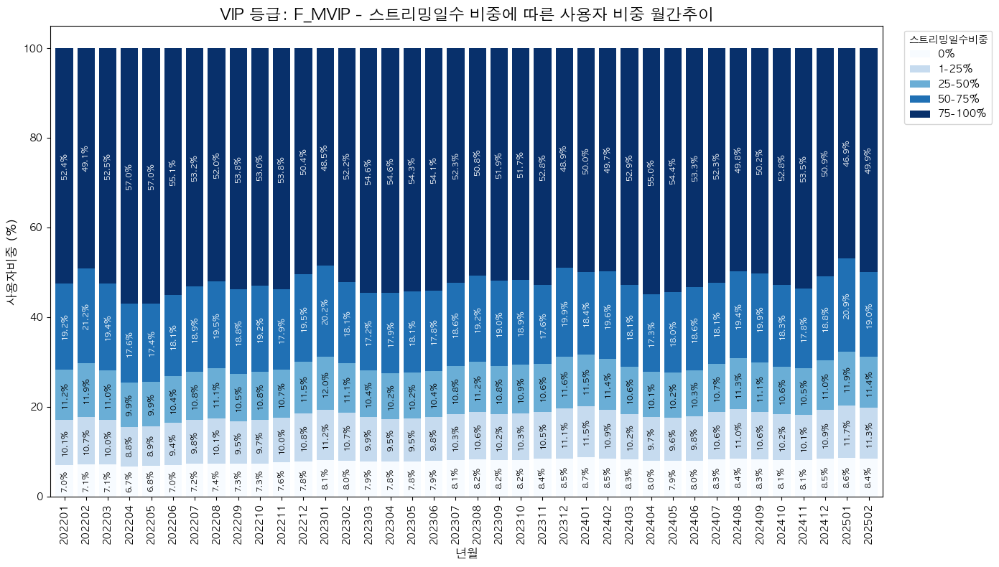

In [28]:
# 데이터를 vip_grade_nm별로 그룹화
grouped = st_day_ratio_group_df.groupby('vip_grade_nm')

# 각 vip_grade_nm 그룹별로 스택형 바 플롯 생성
for vip_grade, data in grouped:
    # 데이터를 피벗 테이블로 변환 (stacking을 위해)
    pivot_table = data.pivot_table(
        index='year_month',
        columns='st_day_ratio_group',
        values='user_ratio_by_st_day_ratio',
        aggfunc='sum'
    )

    # 스택형 바 플롯 그리기
    fig, ax = plt.subplots(figsize=(15, 8))
    bars = pivot_table.plot(
        kind='bar',
        stacked=True,
        figsize=(14, 8),
        colormap='Blues',
        width=0.8,
        ax=ax
    )

    # 각 영역에 비율 값 추가
    for container, group in zip(bars.containers, pivot_table.columns):
        for bar in container:
            if bar.get_height() > 0:  # 높이가 0보다 큰 경우만 표시
                height = bar.get_height()
                x = bar.get_x() + bar.get_width() / 2
                y = bar.get_y() + height / 2
                # 그룹에 따라 텍스트 색상 설정
                text_color = 'white' if group in ['75-100%', '50-75%'] else 'black'
                ax.text(
                    x, y, f'{height:.1f}%', 
                    ha='center', va='center', 
                    fontsize=8, color=text_color, 
                    rotation=90  # 텍스트를 90도로 회전
                )

    # 그래프 제목 및 레이블 설정
    plt.title(f'VIP 등급: {vip_grade} - 스트리밍일수 비중에 따른 사용자 비중 월간추이', fontsize=16)
    plt.xlabel('년월', fontsize=12)
    plt.ylabel('사용자비중 (%)', fontsize=12)
    plt.xticks(rotation=90, fontsize=10)
    plt.legend(title='스트리밍일수비중', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10)

    # 그래프 표시
    plt.tight_layout()
    plt.show()

In [30]:

# 연도 컬럼 추가
st_day_ratio_group_df['year'] = st_day_ratio_group_df['log_month'].dt.year

# 등급, 연도별로 스트리밍 비중별 평균 사용자 비중 계산
pivot_table = st_day_ratio_group_df.pivot_table(
    index=['vip_grade_nm', 'year'],  # 등급과 연도를 인덱스로 설정
    columns='st_day_ratio_group',   # 스트리밍 비중을 컬럼으로 설정
    values='user_ratio_by_st_day_ratio',  # 사용자 비중 값
    aggfunc='mean'  # 평균 계산
)

# 결과 출력
print(pivot_table)

st_day_ratio_group         0%      1-25%     25-50%     50-75%    75-100%
vip_grade_nm year                                                        
A_일반         2022   27.556667   6.597500   8.882500  15.169167  41.792500
             2023   31.115000   6.820833   8.876667  14.600000  38.588333
             2024   30.349167   7.104167   8.946667  14.657500  38.942500
             2025   29.555000   7.785000   9.775000  15.900000  36.985000
B_GREEN      2022    7.414167  11.151667  11.755833  19.569167  50.111667
             2023    8.058333  11.555833  11.891667  19.417500  49.078333
             2024    7.873333  11.117500  11.640833  19.444167  49.925000
             2025    9.275000  13.405000  13.100000  20.670000  43.545000
C_SILVER     2022    8.712500  10.157500  10.804167  18.643333  51.682500
             2023    8.641667  10.259167  10.890833  18.587500  51.623333
             2024    8.126667  10.060000  10.797500  18.680833  52.331667
             2025    8.380000  11.3650

In [31]:
# 연도와 월 컬럼 추가
st_day_ratio_group_df['year'] = st_day_ratio_group_df['log_month'].dt.year
st_day_ratio_group_df['month'] = st_day_ratio_group_df['log_month'].dt.month

# 1월과 2월 데이터 필터링
jan_feb_data = st_day_ratio_group_df[st_day_ratio_group_df['month'].isin([1, 2])]

# 등급, 연도별로 스트리밍 비중별 평균 사용자 비중 계산
jan_feb_pivot_table = jan_feb_data.pivot_table(
    index=['vip_grade_nm', 'year'],  # 등급과 연도를 인덱스로 설정
    columns='st_day_ratio_group',   # 스트리밍 비중을 컬럼으로 설정
    values='user_ratio_by_st_day_ratio',  # 사용자 비중 값
    aggfunc='mean'  # 평균 계산
)

# 결과 출력
print(jan_feb_pivot_table)

st_day_ratio_group      0%   1-25%  25-50%  50-75%  75-100%
vip_grade_nm year                                          
A_일반         2022   30.355   6.600   8.880  15.310   38.855
             2023   29.415   7.180   9.570  15.515   38.325
             2024   30.930   6.980   9.195  15.090   37.805
             2025   29.555   7.785   9.775  15.900   36.985
B_GREEN      2022    8.475  12.190  12.360  20.140   46.835
             2023    8.300  12.400  12.570  20.085   46.640
             2024    7.835  11.115  12.020  19.965   49.065
             2025    9.275  13.405  13.100  20.670   43.545
C_SILVER     2022    9.500  11.005  11.560  19.615   48.320
             2023    8.725  11.090  11.600  19.420   49.170
             2024    9.935  11.675  11.705  18.885   47.800
             2025    8.380  11.365  12.055  20.235   47.965
D_GOLD       2022    9.255  10.545  11.235  19.430   49.540
             2023    9.565  10.800  11.360  18.785   49.485
             2024    9.175  10.805  11.4

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1448053946.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


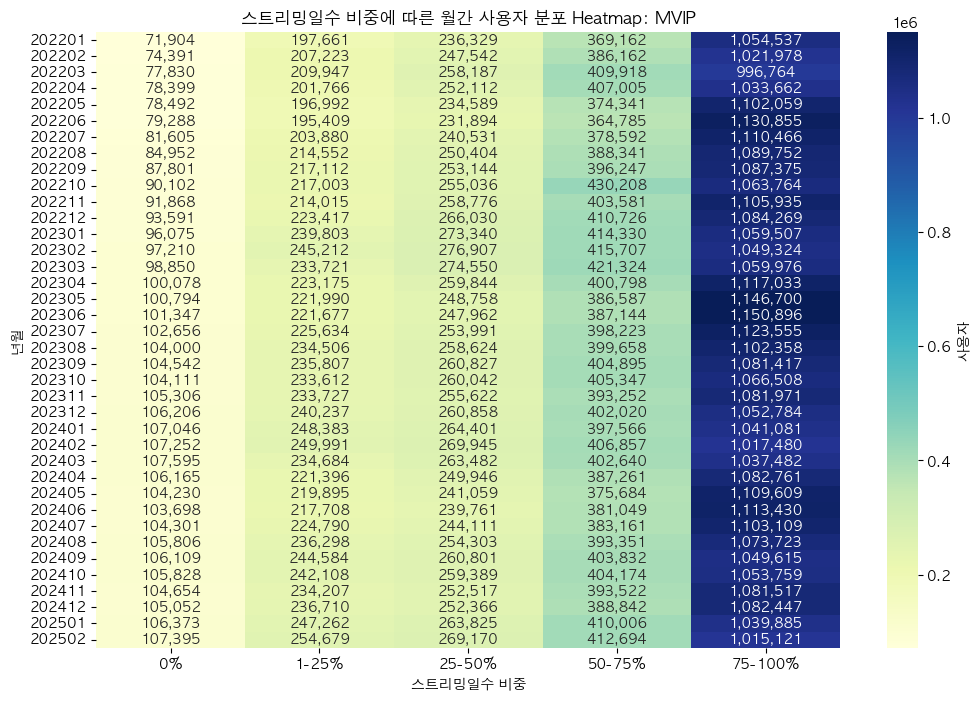

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1448053946.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


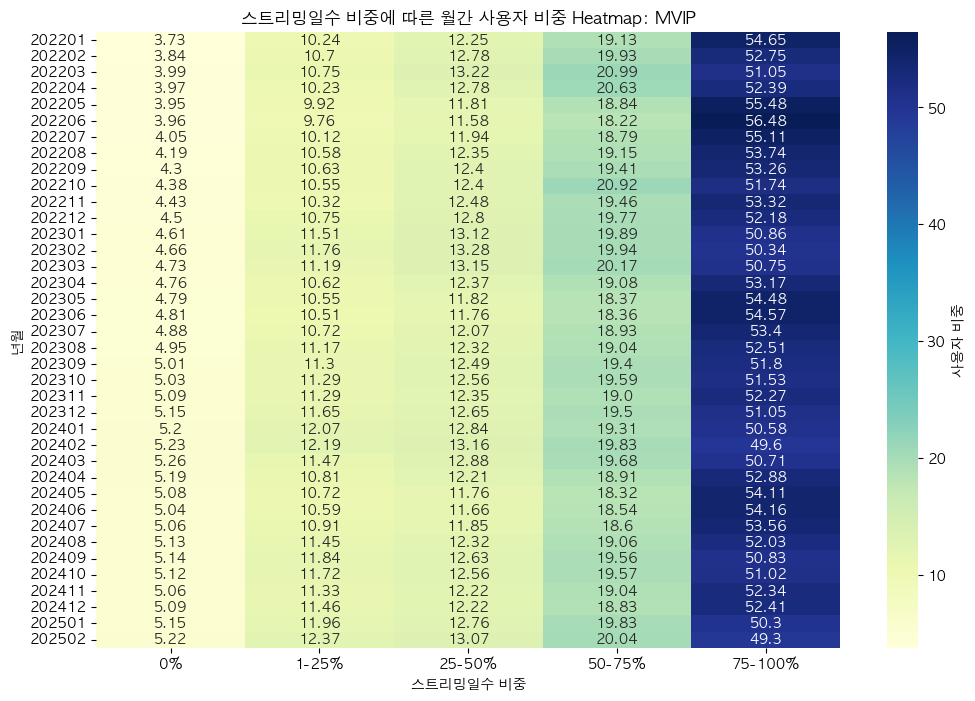

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1448053946.py:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


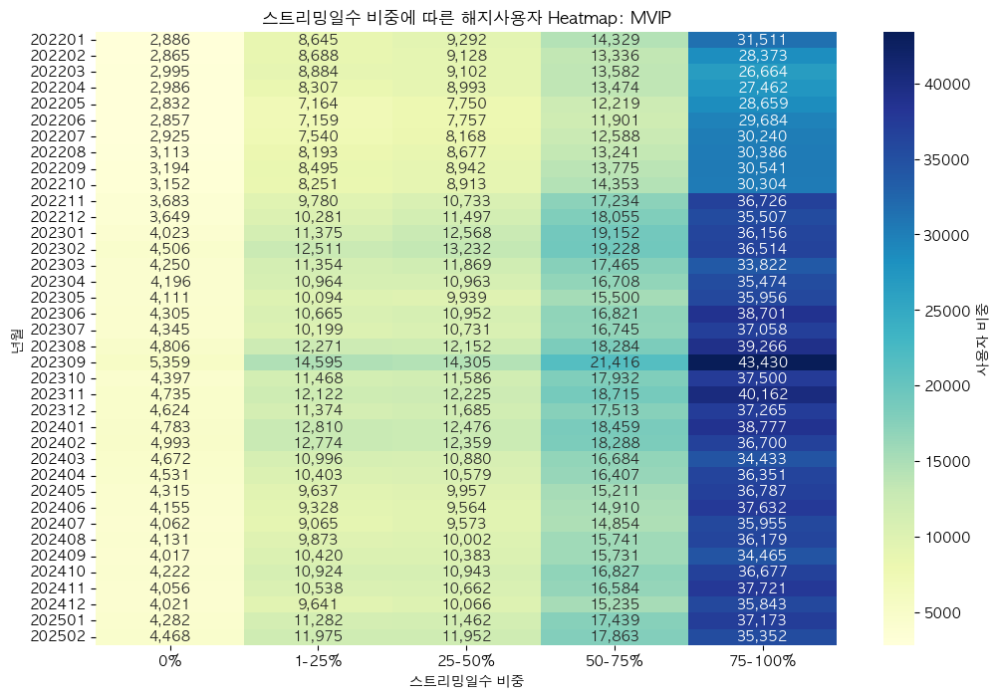

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1448053946.py:62: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


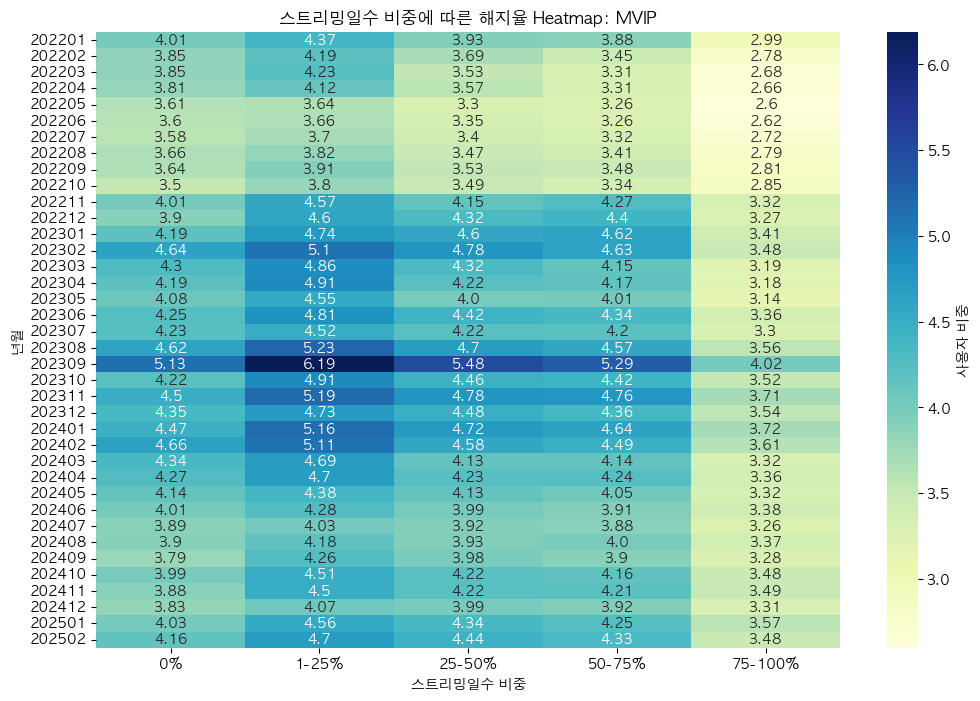

In [ ]:
# MVIP 등급만 필터링
mvip_df = st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'F_MIVP']

# 피벗 테이블 생성
pivot_table = mvip_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 분포 Heatmap: MVIP')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = mvip_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_ratio_by_st_day_ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 비중 Heatmap: MVIP')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = mvip_df.pivot(index='year_month', columns='st_day_ratio_group', values='out_user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지사용자 Heatmap: MVIP')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = mvip_df.pivot(index='year_month', columns='st_day_ratio_group', values='ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지율 Heatmap: MVIP')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()



In [50]:
st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'F_MIVP']

,year_month,log_month,vip_grade_nm,st_day_ratio_group,user_cnt,user_ratio_by_st_day_ratio,keep_user_cnt,keep_user_ratio_by_st_day_ratio,out_user_cnt,out_user_ratio_by_st_day_ratio,ratio
950,202201,2022-01-01,F_MIVP,0%,71904,3.73,69018,3.70,2886,4.33,4.01
951,202202,2022-02-01,F_MIVP,0%,74391,3.84,71526,3.81,2865,4.59,3.85
952,202203,2022-03-01,F_MIVP,0%,77830,3.99,74835,3.96,2995,4.89,3.85
953,202204,2022-04-01,F_MIVP,0%,78399,3.97,75413,3.94,2986,4.88,3.81
954,202205,2022-05-01,F_MIVP,0%,78492,3.95,75660,3.92,2832,4.83,3.61
...,...,...,...,...,...,...,...,...,...,...,...
1135,202410,2024-10-01,F_MIVP,75-100%,1053759,51.02,1017082,51.22,36677,46.08,3.48
1136,202411,2024-11-01,F_MIVP,75-100%,1081517,52.34,1043796,52.54,37721,47.41,3.49
1137,202412,2024-12-01,F_MIVP,75-100%,1082447,52.41,1046604,52.58,35843,47.91,3.31
1138,202501,2025-01-01,F_MIVP,75-100%,1039885,50.30,1002712,50.50,37173,45.53,3.57


In [ ]:
# MVIP 등급만 필터링
mvip_df = st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'F_MIVP']

# 데이터를 피벗 테이블로 변환 (stacking을 위해)
pivot_table = mvip_df.pivot_table(
    index='year_month',
    columns='st_day_ratio_group',
    values='user_ratio_by_st_day_ratio',
    aggfunc='sum'
)

# 스택형 바 플롯 그리기
fig, ax = plt.subplots(figsize=(15, 8))
bars = pivot_table.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 8),
    colormap='Blues',
    width=0.8,
    ax=ax
)

# 각 영역에 비율 값 추가
for container, group in zip(bars.containers, pivot_table.columns):
    for bar in container:
        if bar.get_height() > 0:  # 높이가 0보다 큰 경우만 표시
            height = bar.get_height()
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_y() + height / 2
            # 그룹에 따라 텍스트 색상 설정
            text_color = 'white' if group in ['75-100%', '50-75%'] else 'black'
            ax.text(
                x, y, f'{height:.1f}%', 
                ha='center', va='center', 
                fontsize=8, color=text_color, 
                rotation=90  # 텍스트를 90도로 회전
            )

# 그래프 제목 및 레이블 설정
plt.title('스트리밍일수 비중에 따른 사용자 비중 월간추이', fontsize=16)
plt.xlabel('년월', fontsize=12)
plt.ylabel('사용자비중 (%)', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.legend(title='스트리밍일수비중', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=10)

# 그래프 표시
plt.tight_layout()
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2141783607.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


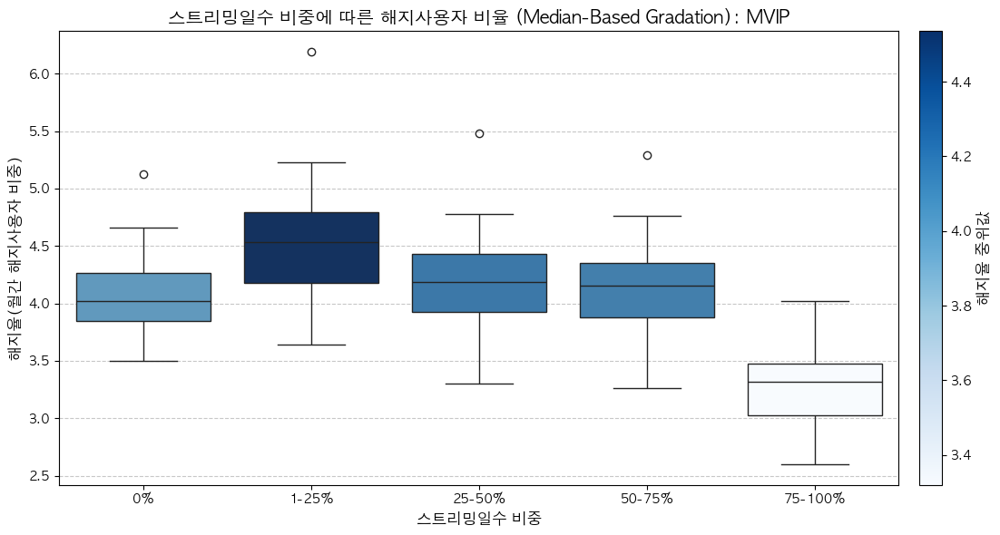

In [41]:
# MVIP 등급만 필터링
mvip_df = st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'F_MIVP']

# 그룹별 ratio 중위값 계산
median_ratios = mvip_df.groupby('st_day_ratio_group')['ratio'].median().sort_values()

# 색상 매핑 (중위값 순서에 따라 그라데이션 적용)
norm = Normalize(vmin=median_ratios.min(), vmax=median_ratios.max())
cmap = plt.cm.Blues  # 원하는 컬러맵 선택
colors = {group: cmap(norm(median)) for group, median in median_ratios.items()}

# x축 순서 지정
x_order = ['0%', '1-25%', '25-50%','50-75%', '75-100%']


# Box Plot 그리기
fig, ax = plt.subplots(figsize=(12, 6))  # Axes 객체 생성
sns.boxplot(
    data=mvip_df,
    x='st_day_ratio_group',
    y='ratio',
    order=x_order,  # 지정된 순서로 정렬
    palette=colors,  # 색상 적용
    ax=ax  # Axes 지정
)

# 컬러바 추가
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.02)  # Axes 지정
cbar.set_label('해지율 중위값', fontsize=12)

# 그래프 제목 및 레이블 설정
ax.set_title('스트리밍일수 비중에 따른 해지사용자 비율 (Median-Based Gradation): MVIP', fontsize=14)
ax.set_xlabel('스트리밍일수 비중', fontsize=12)
ax.set_ylabel('해지율(월간 해지사용자 비중)', fontsize=12)

# 그리드 추가
ax.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

In [37]:
st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'E_VIP']

,year_month,vip_grade_nm,st_day_ratio_group,user_cnt,user_ratio_by_st_day_ratio,keep_user_cnt,keep_user_ratio_by_st_day_ratio,out_user_cnt,out_user_ratio_by_st_day_ratio,ratio
608,202201,E_VIP,0-25%,147887,14.64,138259,14.58,9628,15.57,6.51
609,202202,E_VIP,0-25%,153049,15.35,143447,15.24,9602,17.15,6.27
610,202203,E_VIP,0-25%,152593,15.70,142991,15.56,9602,18.04,6.29
611,202204,E_VIP,0-25%,146288,15.35,137065,15.22,9223,17.47,6.30
612,202205,E_VIP,0-25%,141790,15.04,133768,14.98,8022,15.97,5.66
...,...,...,...,...,...,...,...,...,...,...
755,202410,E_VIP,75-100%,310371,52.06,286769,52.23,23602,50.14,7.60
756,202411,E_VIP,75-100%,314111,53.49,290147,53.63,23964,51.82,7.63
757,202412,E_VIP,75-100%,305964,53.24,283495,53.33,22469,52.20,7.34
758,202501,E_VIP,75-100%,286519,51.02,264542,51.19,21977,49.13,7.67


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/973585600.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


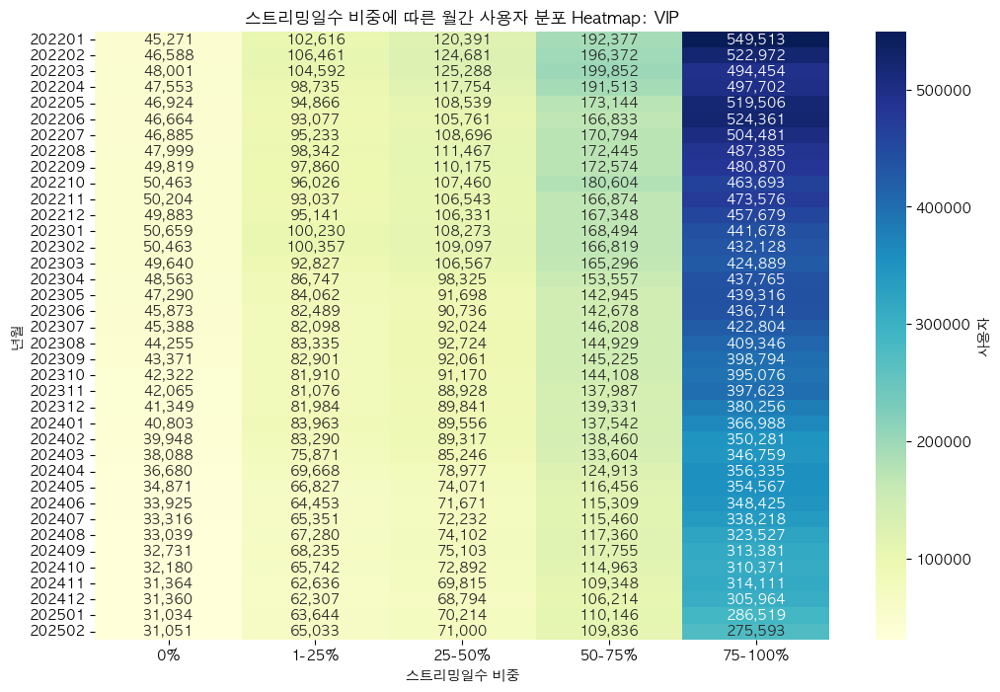

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/973585600.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


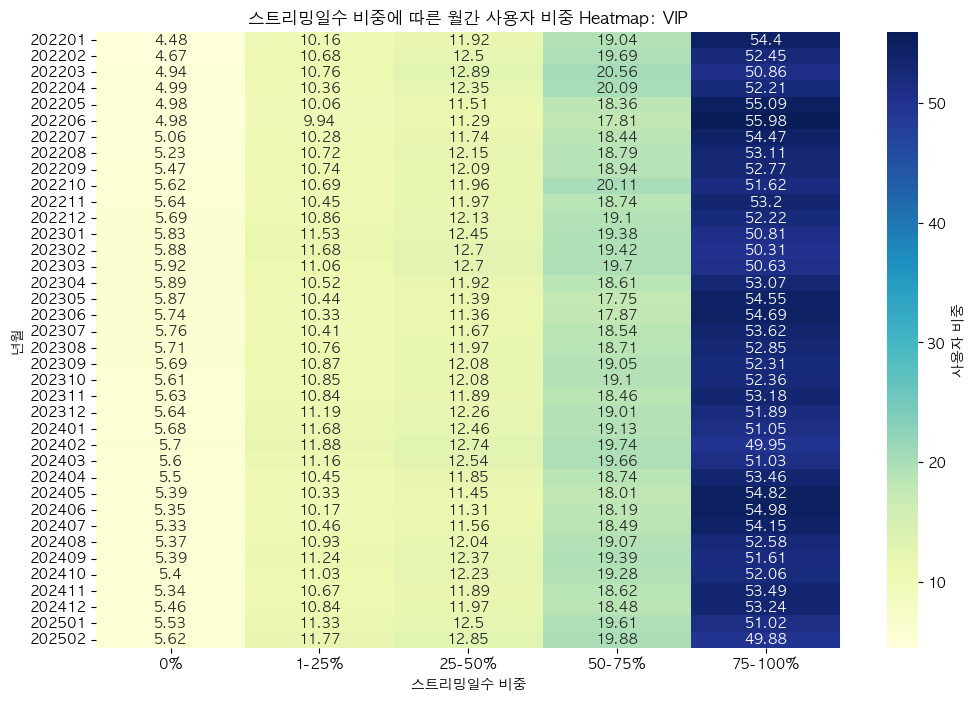

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/973585600.py:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


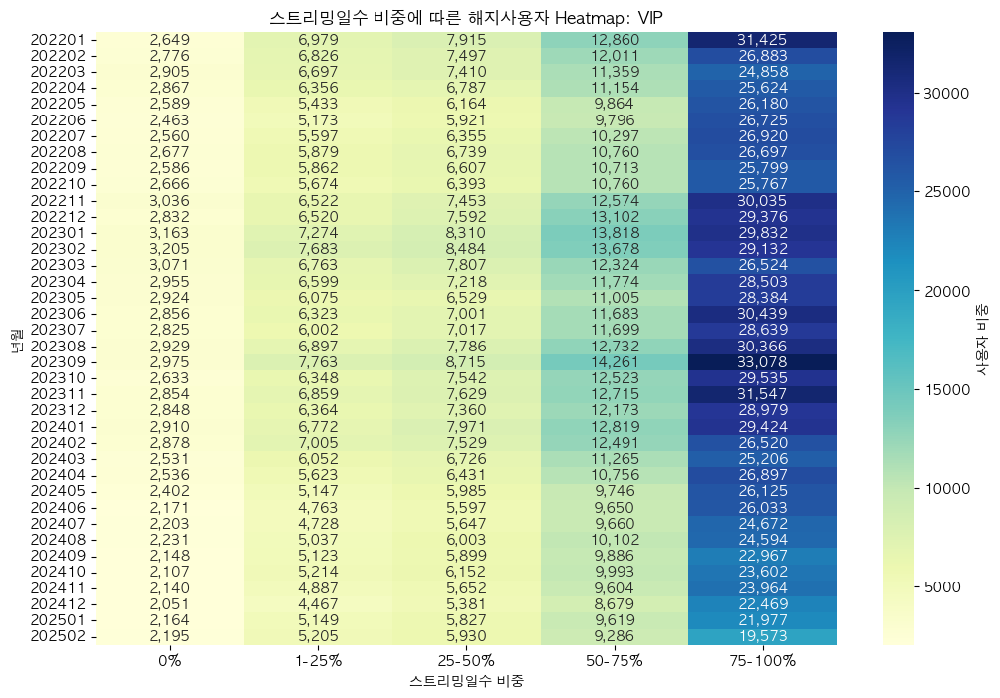

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/973585600.py:63: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


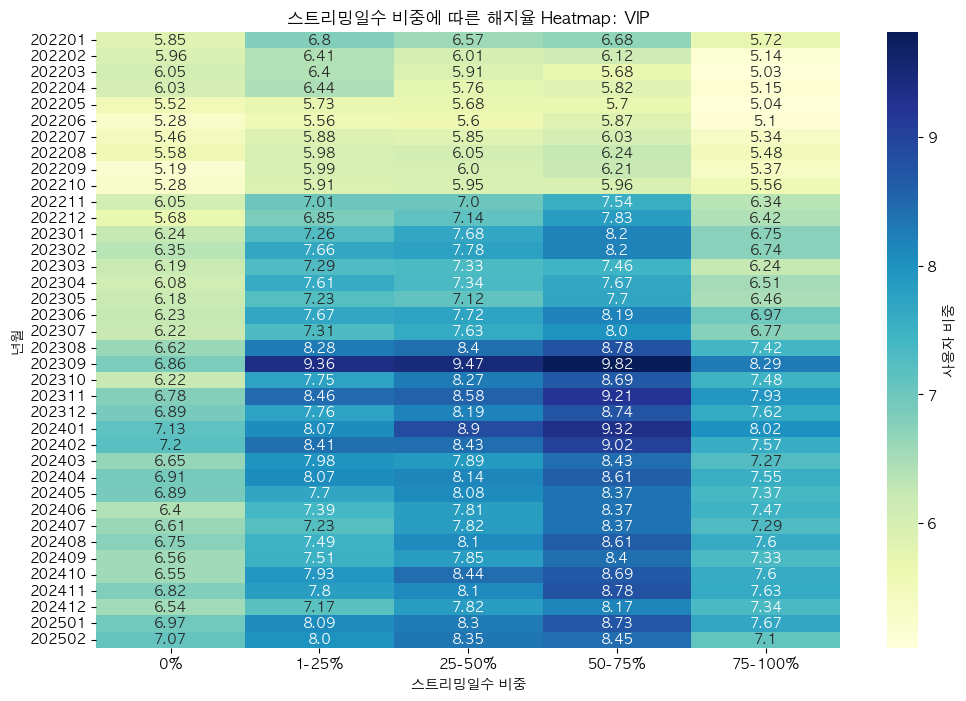

In [37]:
# VIP 등급만 필터링
vip_df = st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'E_VIP']

# 피벗 테이블 생성
pivot_table = vip_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 분포 Heatmap: VIP')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = vip_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_ratio_by_st_day_ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 비중 Heatmap: VIP')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = vip_df.pivot(index='year_month', columns='st_day_ratio_group', values='out_user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지사용자 Heatmap: VIP')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = vip_df.pivot(index='year_month', columns='st_day_ratio_group', values='ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지율 Heatmap: VIP')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2582014265.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


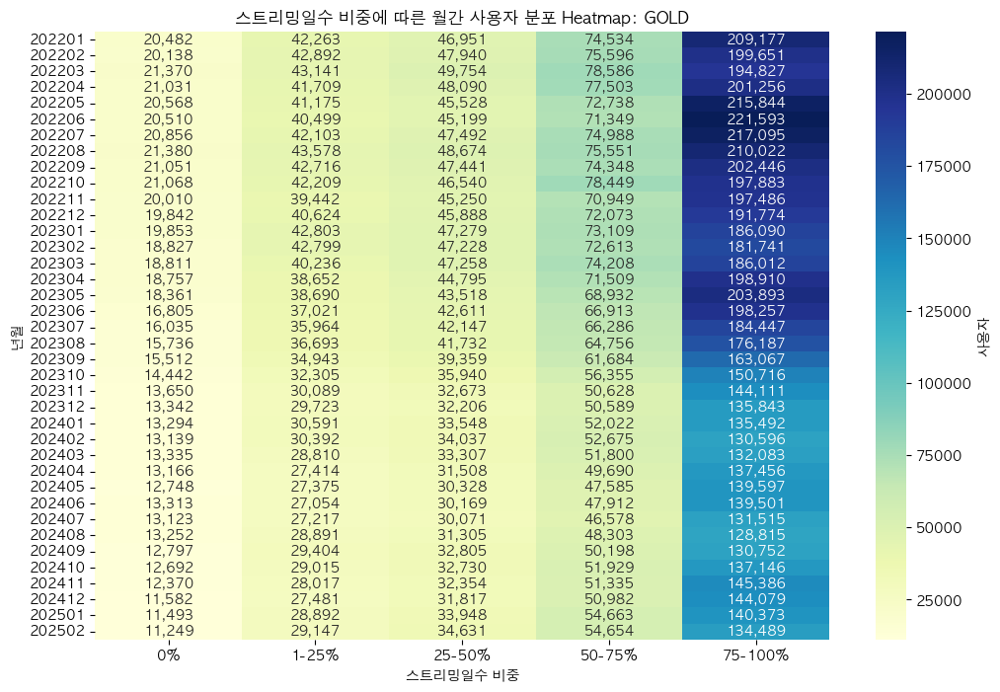

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2582014265.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


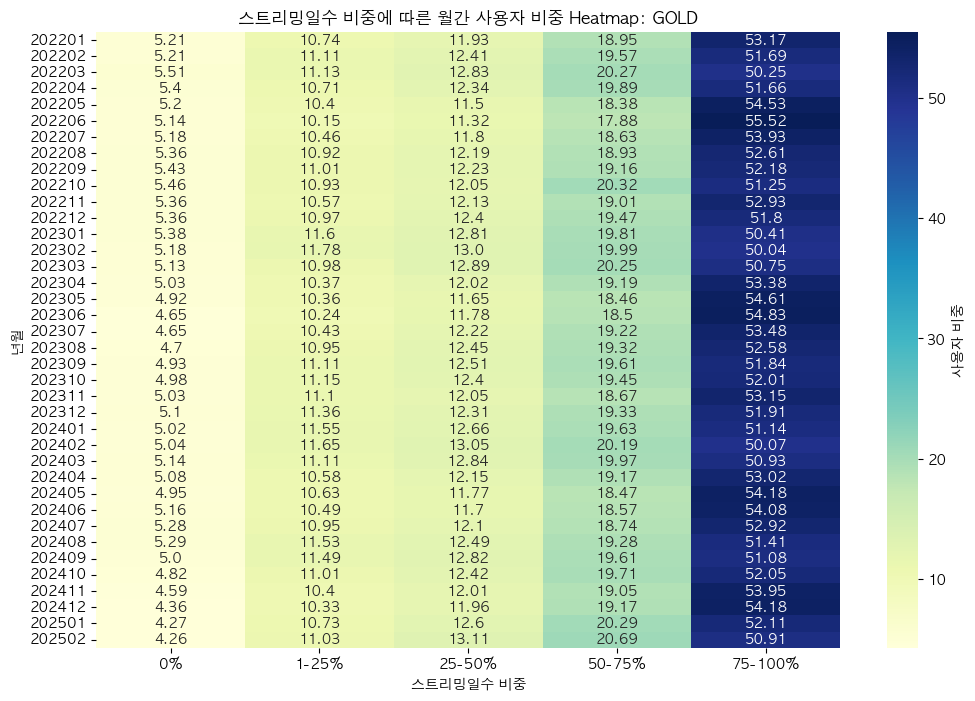

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2582014265.py:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


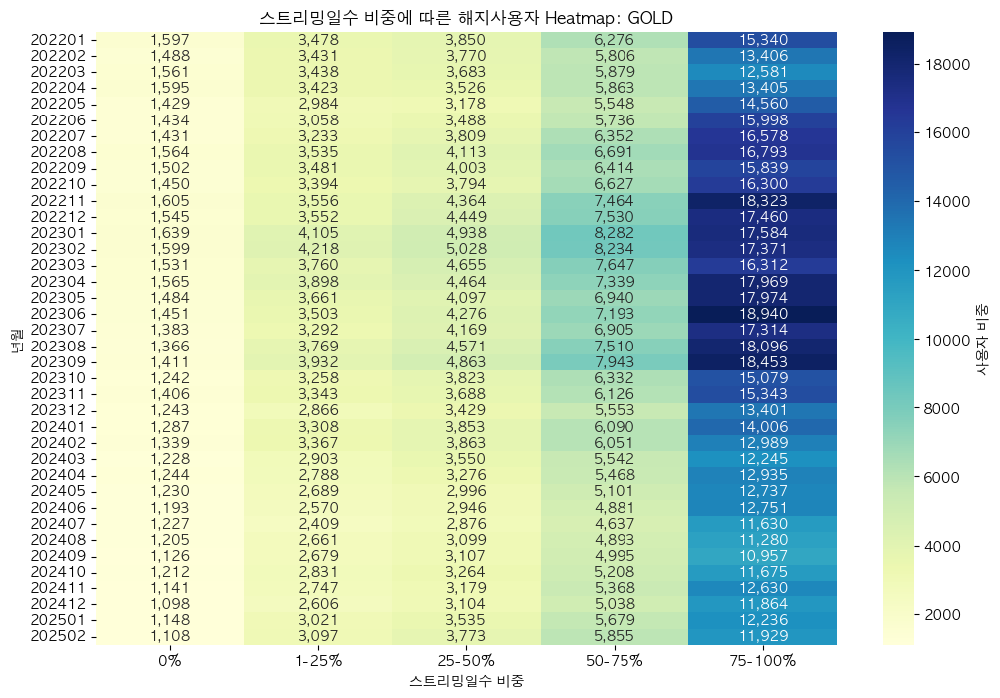

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2582014265.py:63: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


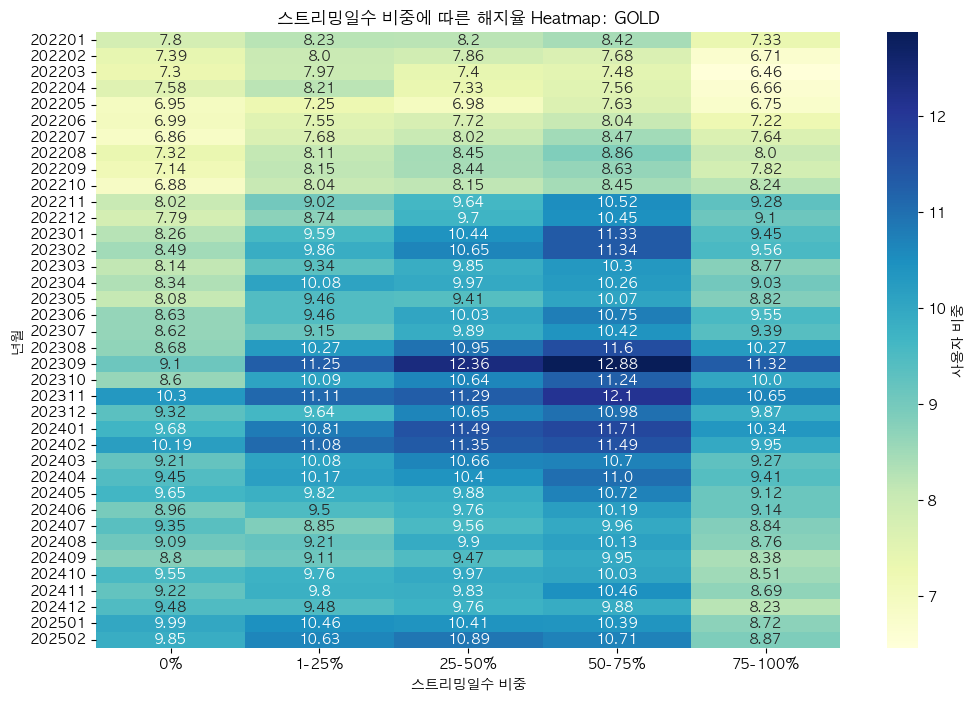

In [38]:
# VIP 등급만 필터링
gold_df = st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'D_GOLD']

# 피벗 테이블 생성
pivot_table = gold_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 분포 Heatmap: GOLD')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = gold_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_ratio_by_st_day_ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 비중 Heatmap: GOLD')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = gold_df.pivot(index='year_month', columns='st_day_ratio_group', values='out_user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지사용자 Heatmap: GOLD')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = gold_df.pivot(index='year_month', columns='st_day_ratio_group', values='ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지율 Heatmap: GOLD')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/638456909.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


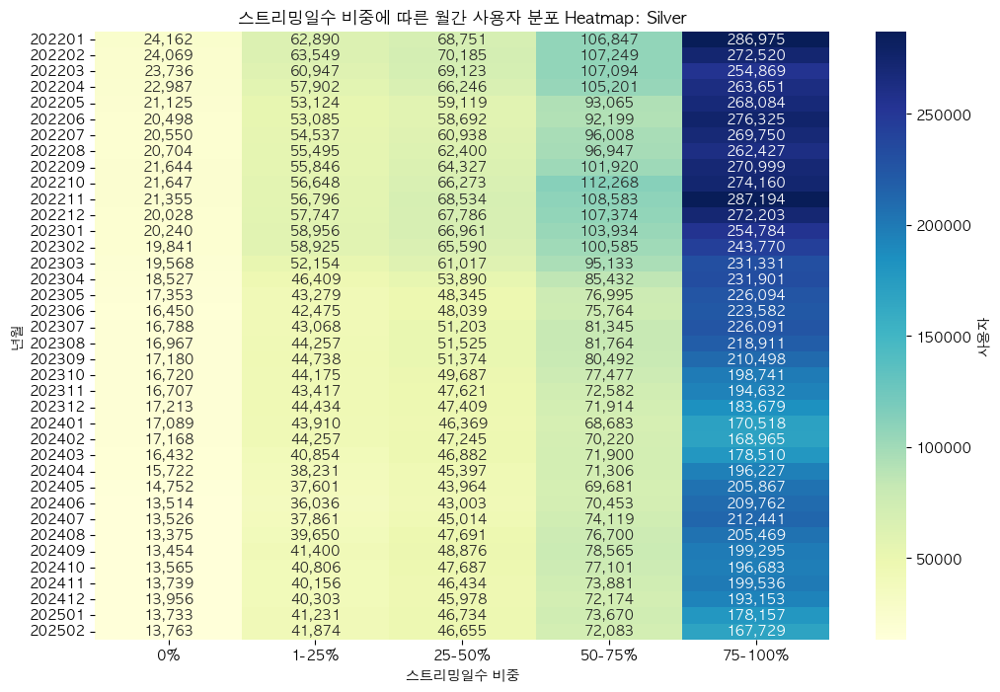

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/638456909.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


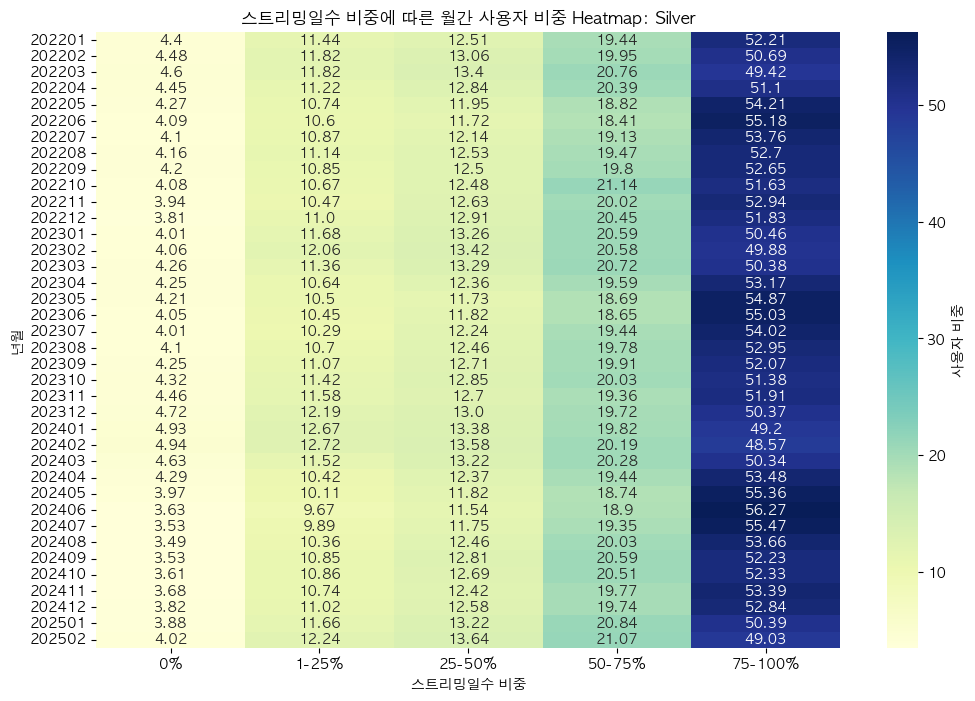

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/638456909.py:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


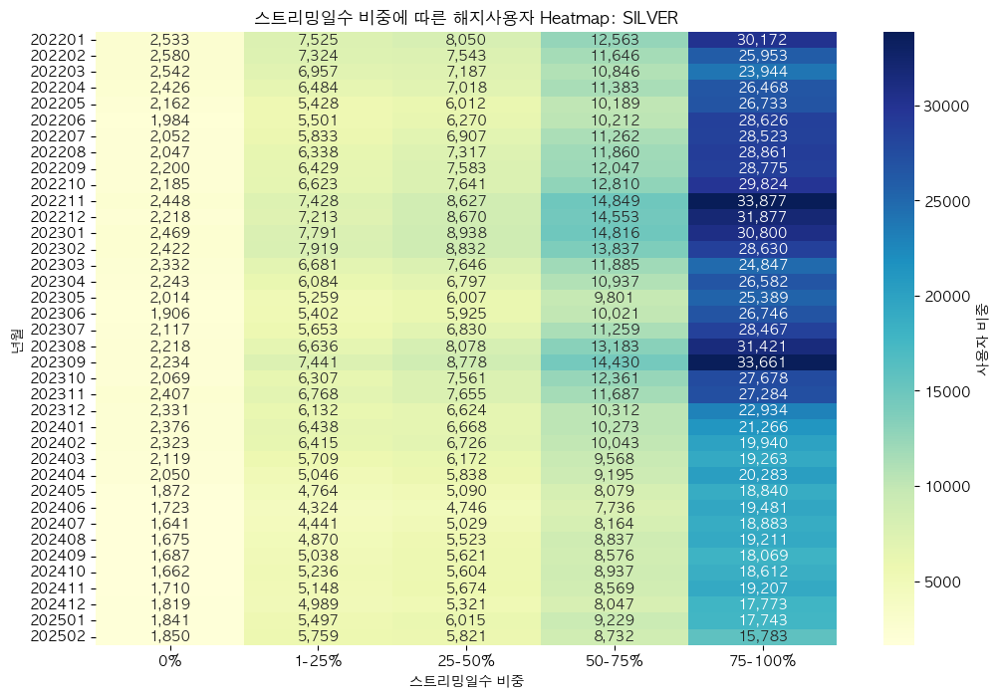

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/638456909.py:63: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


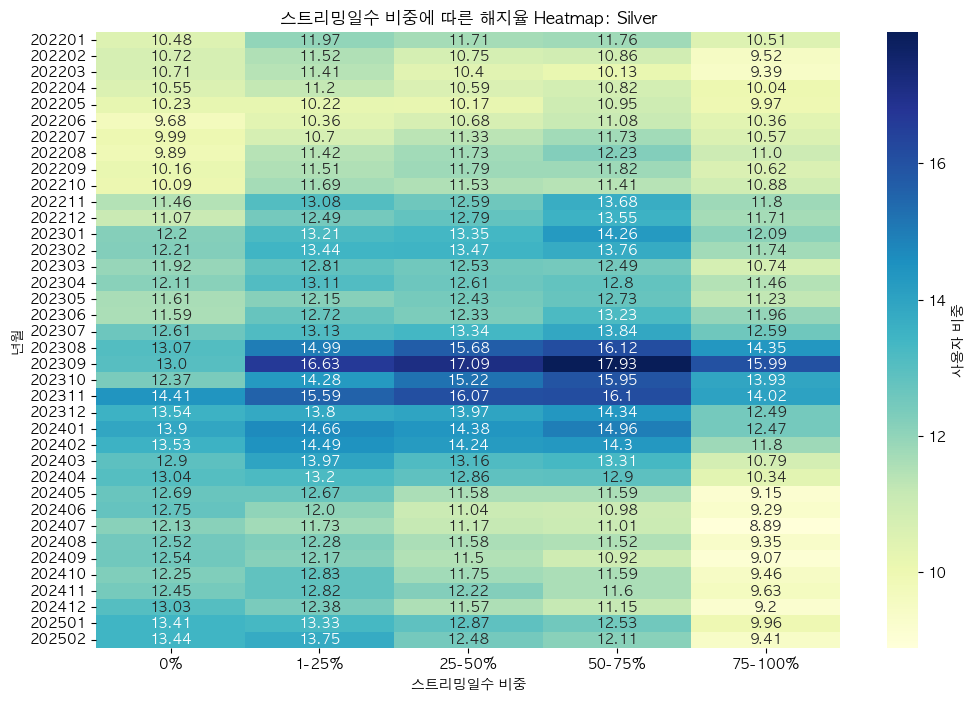

In [39]:
# VIP 등급만 필터링
silver_df = st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'C_SILVER']

# 피벗 테이블 생성
pivot_table = silver_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 분포 Heatmap: Silver')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = silver_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_ratio_by_st_day_ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 비중 Heatmap: Silver')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = silver_df.pivot(index='year_month', columns='st_day_ratio_group', values='out_user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지사용자 Heatmap: SILVER')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = silver_df.pivot(index='year_month', columns='st_day_ratio_group', values='ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지율 Heatmap: Silver')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2868422559.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


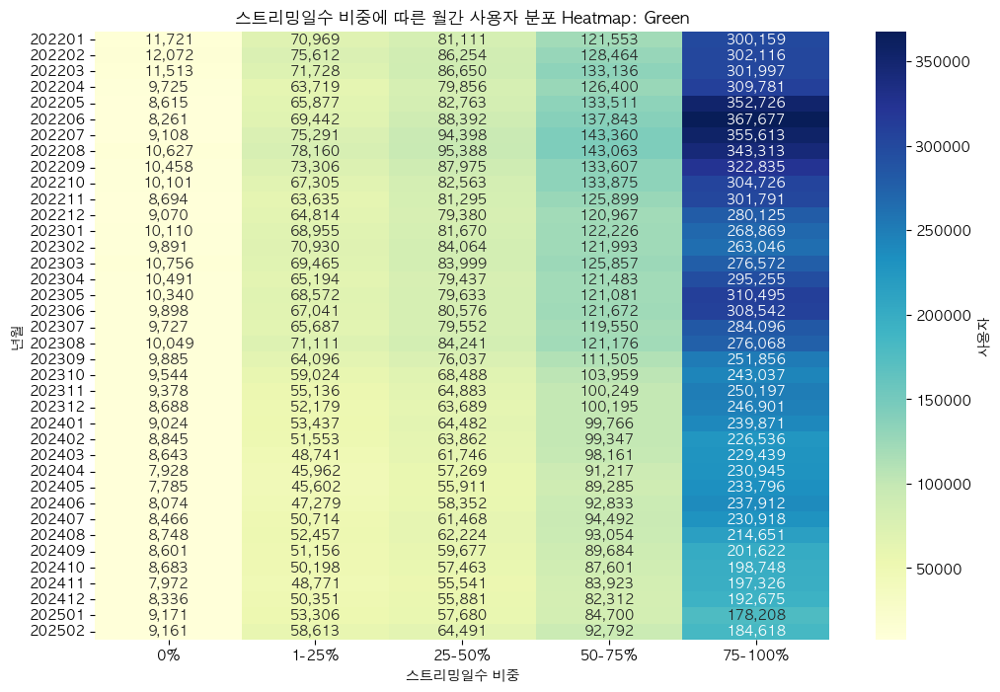

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2868422559.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


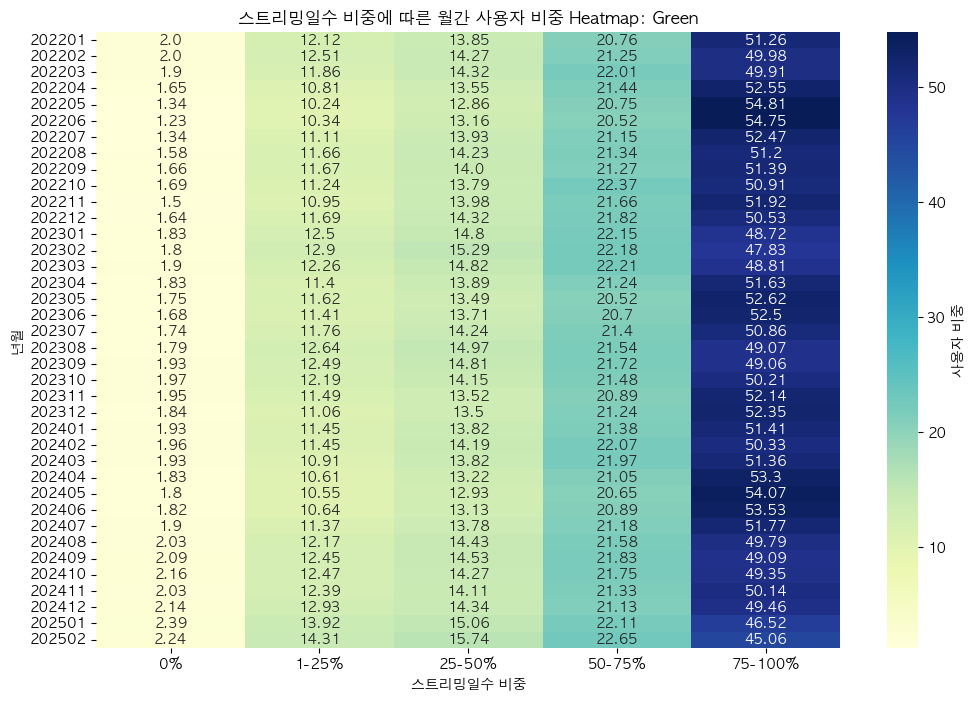

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2868422559.py:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


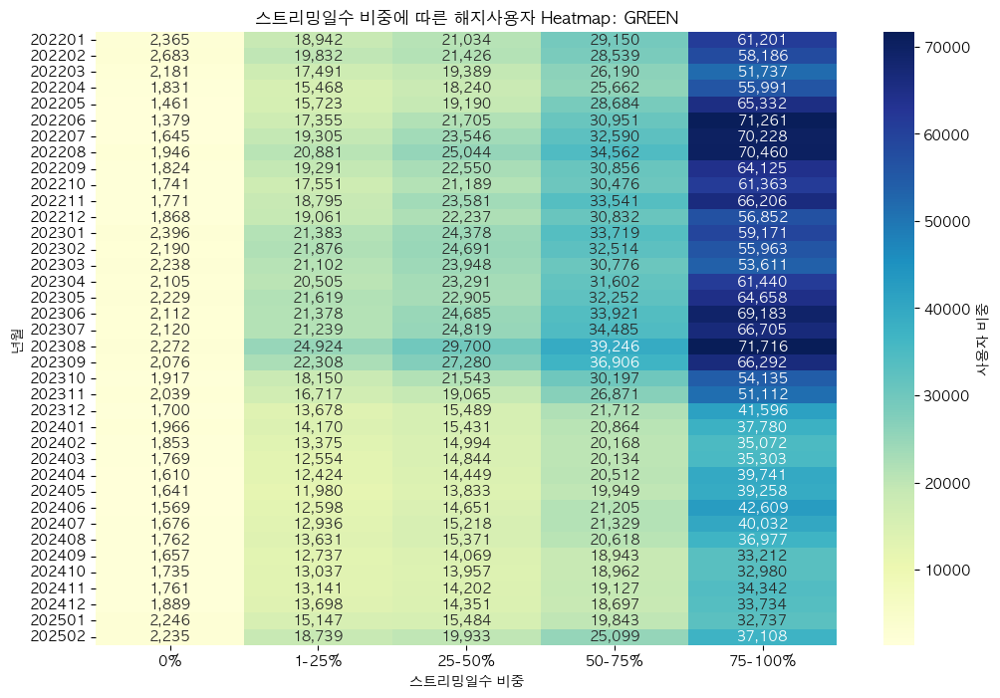

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2868422559.py:62: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


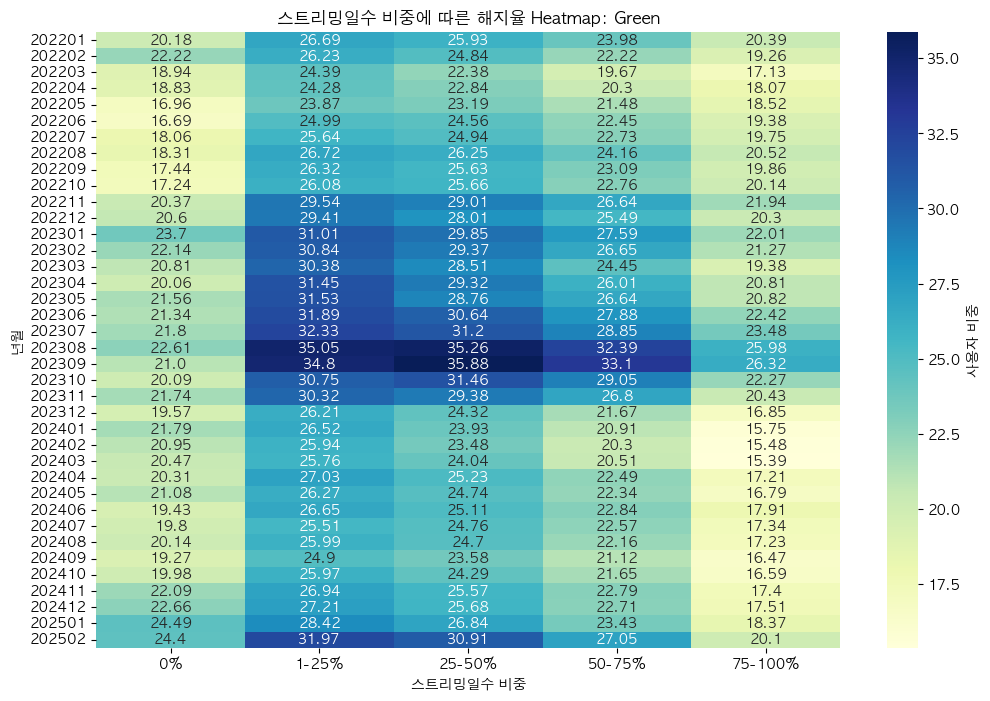

In [40]:
# VIP 등급만 필터링
pivot_df = st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'B_GREEN']

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 분포 Heatmap: Green')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_ratio_by_st_day_ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 비중 Heatmap: Green')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='st_day_ratio_group', values='out_user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지사용자 Heatmap: GREEN')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='st_day_ratio_group', values='ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지율 Heatmap: Green')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1040562671.py:11: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


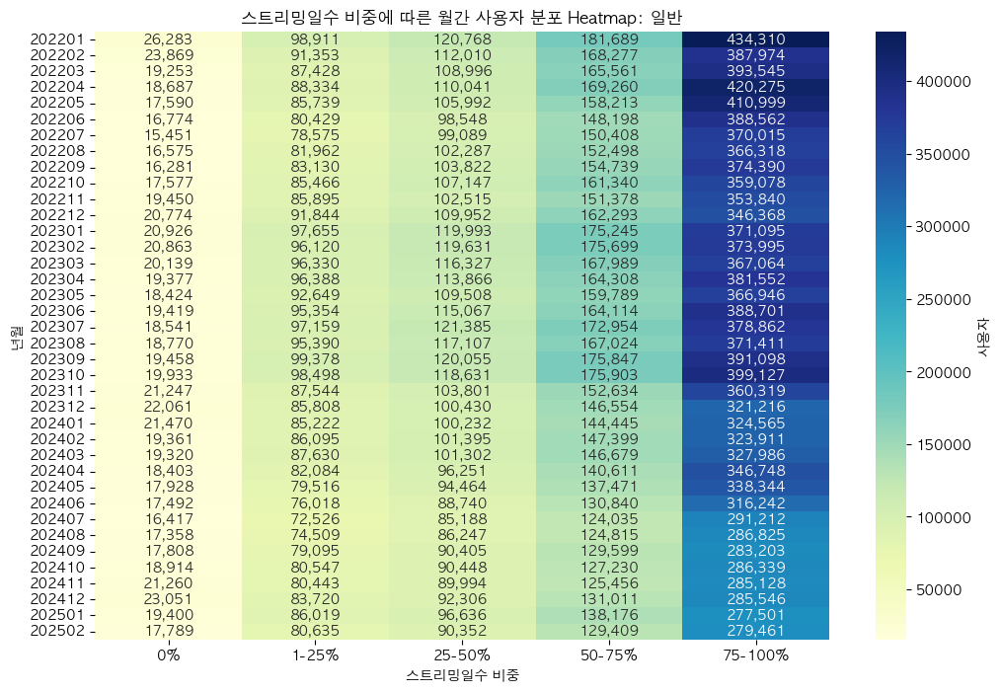

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1040562671.py:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


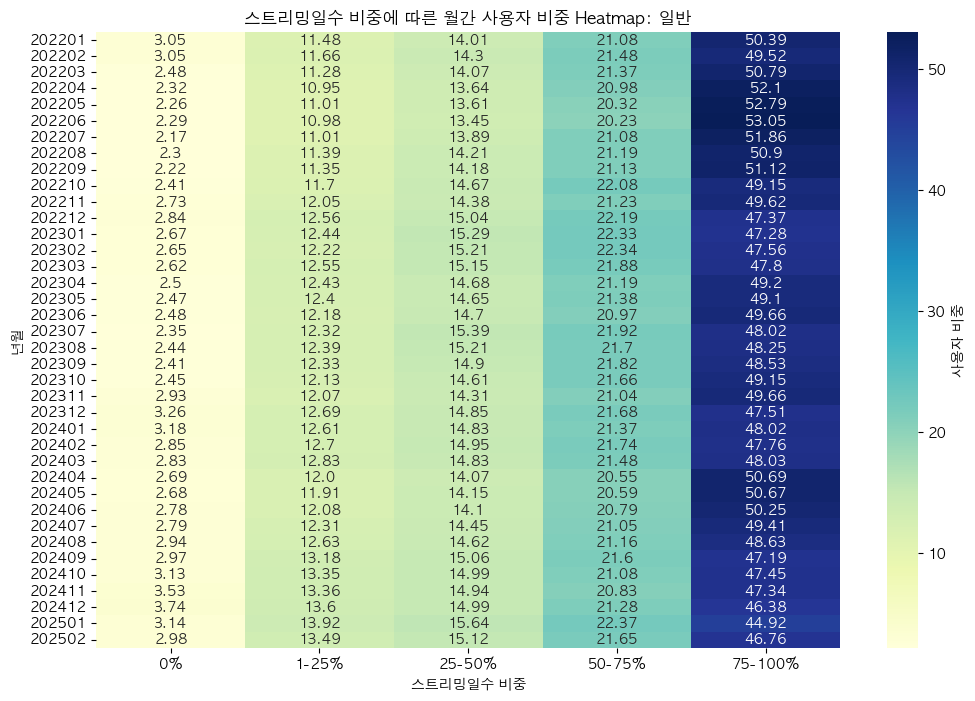

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1040562671.py:45: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


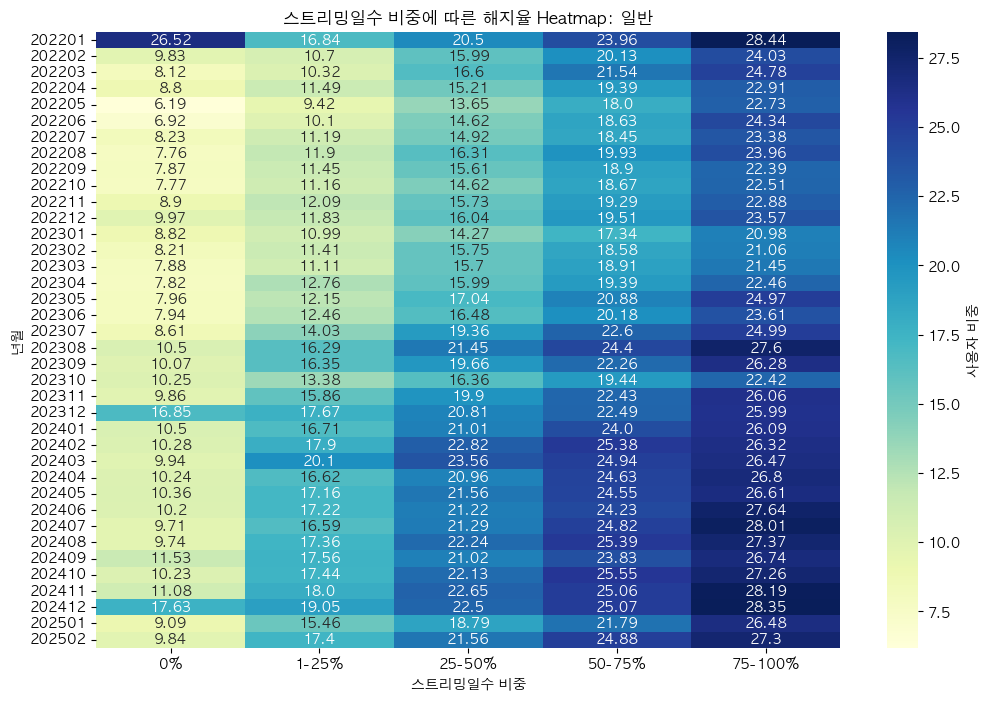

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_70680/1040562671.py:62: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')


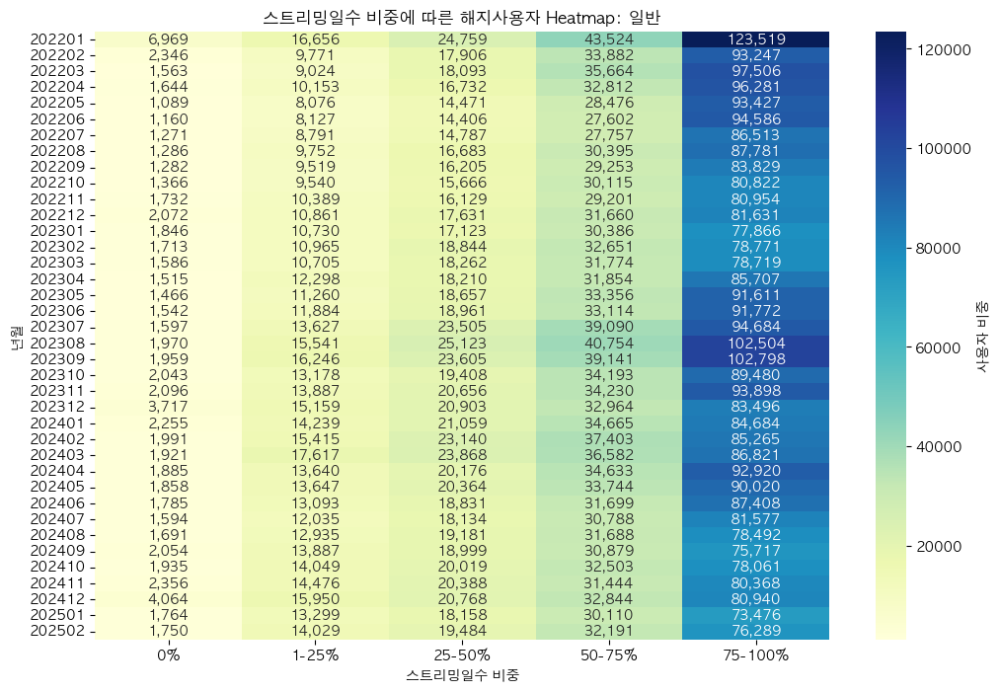

In [59]:
# VIP 등급만 필터링
pivot_df = st_day_ratio_group_df[st_day_ratio_group_df['vip_grade_nm'] == 'A_일반']

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 분포 Heatmap: 일반')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.yticks(rotation=0)
plt.show()


# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='st_day_ratio_group', values='user_ratio_by_st_day_ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 월간 사용자 비중 Heatmap: 일반')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='st_day_ratio_group', values='ratio')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지율 Heatmap: 일반')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

# 피벗 테이블 생성
pivot_table = pivot_df.pivot(index='year_month', columns='st_day_ratio_group', values='out_user_cnt')

# 히트맵 그리기
plt.figure(figsize=(12, 8))

# 히트맵의 값을 포맷팅하여 콤마 추가
formatted_values = pivot_table.applymap(lambda x: f'{x:,}' if pd.notnull(x) else '')

sns.heatmap(pivot_table, annot=formatted_values, fmt="", cmap="YlGnBu", cbar_kws={'label': '사용자 비중'})
plt.title('스트리밍일수 비중에 따른 해지사용자 Heatmap: 일반')
plt.xlabel('스트리밍일수 비중')
plt.ylabel('년월')
plt.xticks(rotation=0)
plt.yticks(rotation=0)
plt.show()

In [39]:
age_query = '''
select year_month
     --, vip_grade_nm	 
     , age_group
     , count(distinct member_key) as user_cnt     
     , count(distinct if(out_yn = '유지',member_key)) as keep_user_cnt
     , count(distinct if(out_yn = '해지',member_key)) as out_user_cnt
     , round(cast(count(distinct if(out_yn = '해지',member_key)) as double)/cast(count(distinct member_key) as double)*100,2) as ratio
from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_ST_DTL_TB 
group by 1,2
order by 1,2
'''

cur.execute(age_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

age_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
age_df.head()

,year_month,age_group,user_cnt,keep_user_cnt,out_user_cnt,ratio
0,202201,10대,400063,311464,88599,22.15
1,202201,20대,1730713,1507527,223186,12.90
2,202201,30대,1525835,1406773,119062,7.80
3,202201,40대,975480,898142,77338,7.93
4,202201,50대,498611,461233,37378,7.50


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_10436/2493608262.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


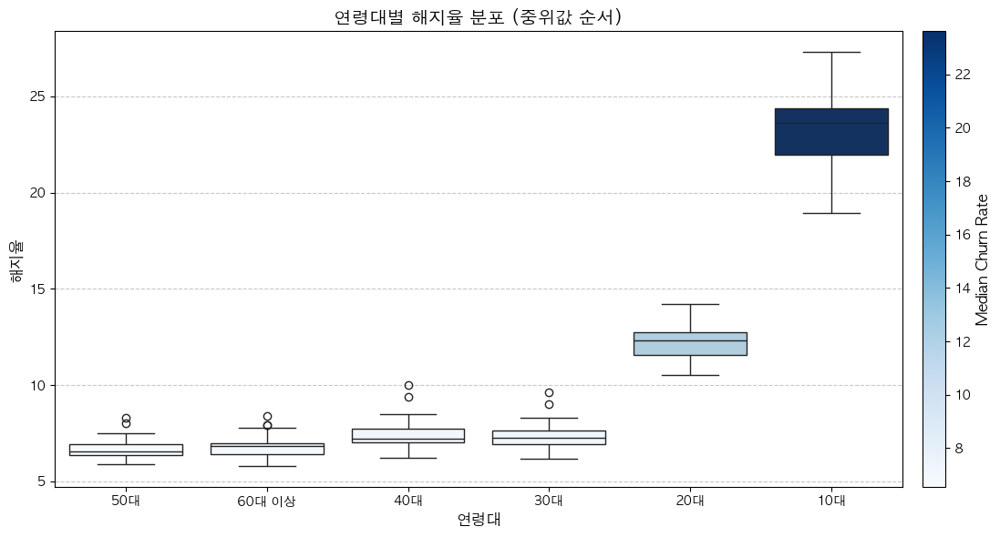

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# NO_INFO 제외
filtered_df = age_df[age_df['age_group'] != 'NO_INFO']

# 연령대별 해지율 중위값 계산
median_ratios = filtered_df.groupby('age_group')['ratio'].median().sort_values()

# 색상 매핑 (중위값 순서에 따라 그라데이션 적용)
norm = Normalize(vmin=median_ratios.min(), vmax=median_ratios.max())
cmap = plt.cm.Blues  # 원하는 컬러맵 선택
colors = {age_group: cmap(norm(median)) for age_group, median in median_ratios.items()}

# Box Plot 그리기
fig, ax = plt.subplots(figsize=(12, 6))  # Axes 객체 생성
sns.boxplot(
    data=filtered_df,
    x='age_group',
    y='ratio',
    order=median_ratios.index,  # 중위값 순서로 정렬
    palette=colors,  # 색상 적용
    ax=ax  # Axes 지정
)

# 컬러바 추가
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.02)  # Axes 지정
cbar.set_label('Median Churn Rate', fontsize=12)

# 그래프 제목 및 레이블 설정
ax.set_title('연령대별 해지율 분포 (중위값 순서)', fontsize=14)
ax.set_xlabel('연령대', fontsize=12)
ax.set_ylabel('해지율', fontsize=12)

# 그리드 추가
ax.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/1634968042.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['year'] = filtered_df['year_month'].astype(str).str[:4]


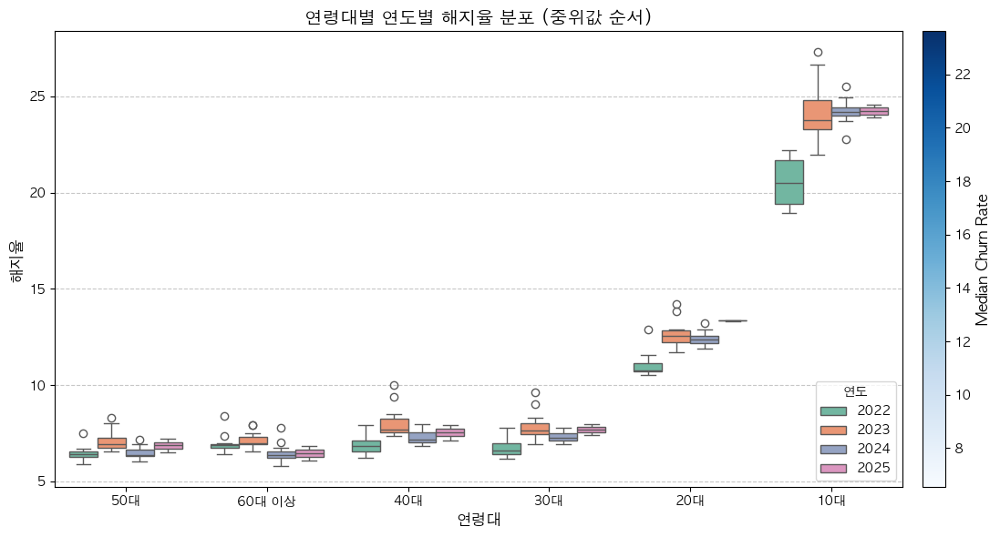

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# NO_INFO 제외
filtered_df = age_df[age_df['age_group'] != 'NO_INFO']

# year_month에서 연도 추출
filtered_df['year'] = filtered_df['year_month'].astype(str).str[:4]

# 연령대별 해지율 중위값 계산
median_ratios = filtered_df.groupby('age_group')['ratio'].median().sort_values()

# 색상 매핑 (중위값 순서에 따라 그라데이션 적용)
norm = Normalize(vmin=median_ratios.min(), vmax=median_ratios.max())
cmap = plt.cm.Blues  # 원하는 컬러맵 선택
colors = {age_group: cmap(norm(median)) for age_group, median in median_ratios.items()}

# Box Plot 그리기
fig, ax = plt.subplots(figsize=(12, 6))  # Axes 객체 생성
sns.boxplot(
    data=filtered_df,
    x='age_group',
    y='ratio',
    hue='year',  # 연도별로 나눔
    order=median_ratios.index,  # 중위값 순서로 정렬
    palette='Set2',  # 연도별 색상 팔레트
    ax=ax  # Axes 지정
)

# 컬러바 추가 (중위값 기준)
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', pad=0.02)  # Axes 지정
cbar.set_label('Median Churn Rate', fontsize=12)

# 그래프 제목 및 레이블 설정
ax.set_title('연령대별 연도별 해지율 분포 (중위값 순서)', fontsize=14)
ax.set_xlabel('연령대', fontsize=12)
ax.set_ylabel('해지율', fontsize=12)

# 범례 설정 (오른쪽 아래로 이동)
ax.legend(title='연도', fontsize=10, loc='lower right')

# 그리드 추가
ax.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

In [45]:
age_grade_query = '''
select year_month
     , if(vip_grade_nm = 'F_MIVP','F_MVIP',vip_grade_nm) as vip_grade_nm	 
     , age_group
     , count(distinct member_key) as user_cnt     
     , count(distinct if(out_yn = '유지',member_key)) as keep_user_cnt
     , count(distinct if(out_yn = '해지',member_key)) as out_user_cnt
     , round(cast(count(distinct if(out_yn = '해지',member_key)) as double)/cast(count(distinct member_key) as double)*100,2) as ratio
from HADOOP_KENT.MELON_SYS_TEMP_PRODUCTION.SAMUEL_USER_VIP_PROD_ST_DTL_TB 
where age_group <> 'NO_INFO'
group by 1,2,3
order by 1,2,3
'''

cur.execute(age_grade_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

age_grade_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
age_grade_df.head()

,year_month,vip_grade_nm,age_group,user_cnt,keep_user_cnt,out_user_cnt,ratio
0,202201,A_일반,10대,140306,97619,42687,30.42
1,202201,A_일반,20대,288007,204707,83300,28.92
2,202201,A_일반,30대,189265,146692,42573,22.49
3,202201,A_일반,40대,142466,114165,28301,19.87
4,202201,A_일반,50대,63774,51990,11784,18.48


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/1115510233.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=mvip_data, x='age_group', y='ratio', palette='Blues')


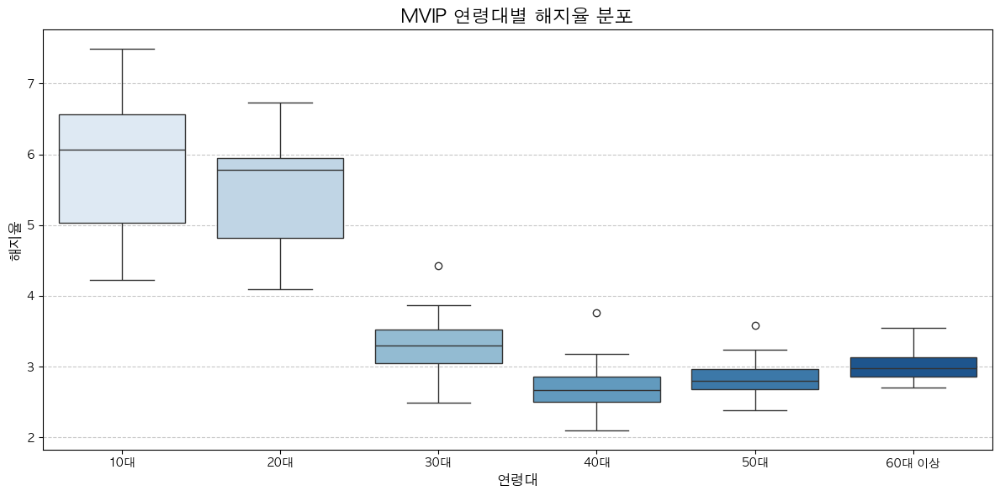

In [50]:
# MVIP 데이터 필터링
mvip_data = age_grade_df[age_grade_df['vip_grade_nm'] == 'F_MVIP']

# 그래프 생성
plt.figure(figsize=(12, 6))

# Box plot 생성
sns.boxplot(data=mvip_data, x='age_group', y='ratio', palette='Blues')

# 그래프 제목 및 레이블 설정
plt.title('MVIP 연령대별 해지율 분포', fontsize=16)
plt.xlabel('연령대', fontsize=12)
plt.ylabel('해지율', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/2506662354.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mvip_data['year'] = mvip_data['year_month'].astype(str).str[:4]


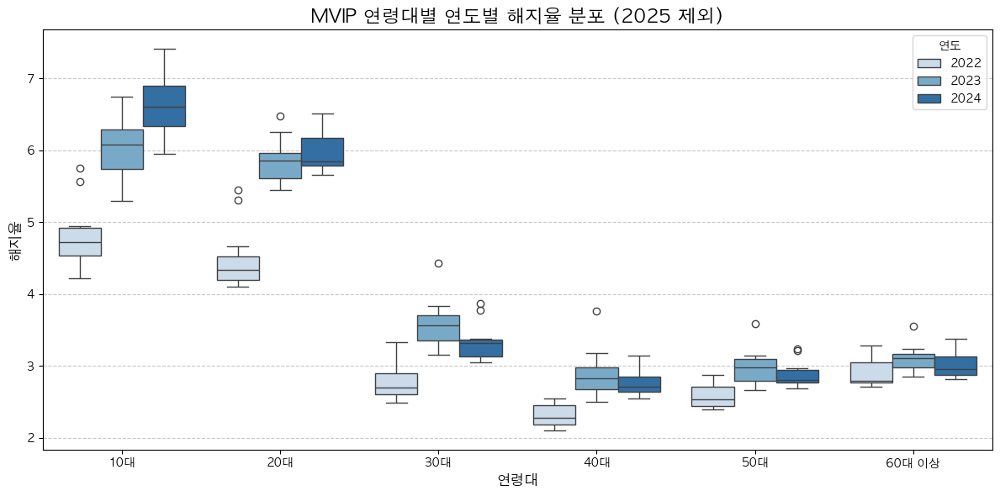

In [ ]:
# year_month에서 연도 추출
mvip_data['year'] = mvip_data['year_month'].astype(str).str[:4]

# 25년도 데이터 제외
mvip_data = mvip_data[mvip_data['year'] != '2025']

# 그래프 생성
plt.figure(figsize=(12, 6))

# Box plot 생성 (연도별로 나눔)
sns.boxplot(data=mvip_data, x='age_group', y='ratio', hue='year', palette='Blues')

# 그래프 제목 및 레이블 설정
plt.title('MVIP 연령대별 연도별 해지율 분포 (2025 제외)', fontsize=16)
plt.xlabel('연령대', fontsize=12)
plt.ylabel('해지율', fontsize=12)
plt.legend(title='연도', fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()



/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/3385480929.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  teen_data['year'] = teen_data['year_month'].astype(str).str[:4]


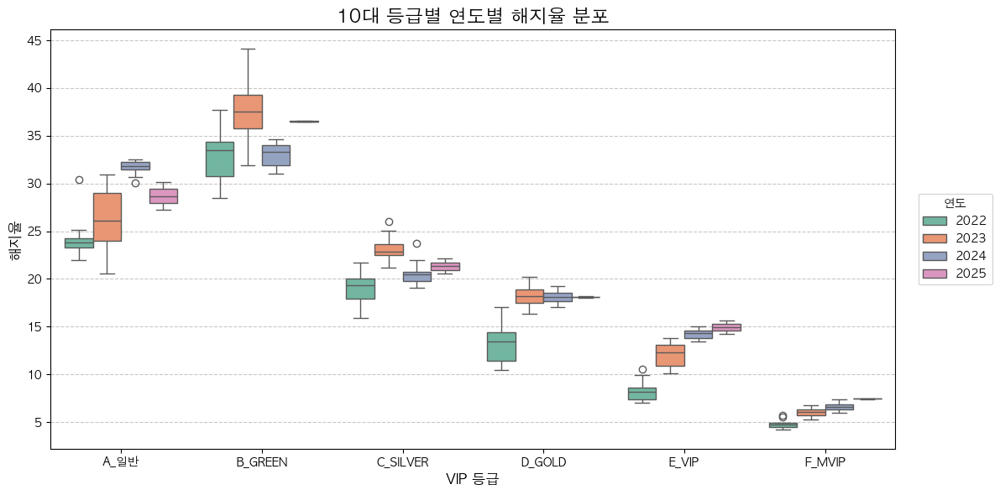

In [64]:
# 10대 데이터 필터링
teen_data = age_grade_df[age_grade_df['age_group'] == '10대']

# year_month에서 연도 추출
teen_data['year'] = teen_data['year_month'].astype(str).str[:4]

# 그래프 생성
plt.figure(figsize=(12, 6))

# Box plot 생성 (등급별 x축, 연도별 hue)
sns.boxplot(data=teen_data, x='vip_grade_nm', y='ratio', hue='year', palette='Set2')

# 그래프 제목 및 레이블 설정
plt.title('10대 등급별 연도별 해지율 분포', fontsize=16)
plt.xlabel('VIP 등급', fontsize=12)
plt.ylabel('해지율', fontsize=12)

# 범례 설정 (그림 밖 오른쪽으로 이동)
plt.legend(title='연도', fontsize=10, loc='center left', bbox_to_anchor=(1.02, 0.5))

# 그리드 추가
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

In [15]:
# 골드이상 사용자중 해지방어 프로모션 사용자 비율 확인
dfs_promo_query = '''
SELECT F1.DT
     , DATE_FORMAT(F1.DT,'%Y-%m') AS YM
     , DATE_FORMAT(F1.DT,'%Y%m%d') AS log_date     
     , F1.OUT_PROD_CNT
     , F1.SELF_OUT_PROD_CNT
     , F1.TRGT_PROD_CNT
     , F1.at_pay_trgt_prod_cnt
     , CAST(F2.NEW_PROMO_PROD_CNT as DOUBLE)/CAST(F1.at_pay_trgt_prod_cnt + F2.NEW_PROMO_PROD_CNT AS DOUBLE)*100 AS NEW_PROMO_PROD_RATIO
     , F2.NEW_PROMO_PROD_CNT
     , F2.NEW_PROMO_PROD_CNT_2 
     , F1.SELF_OUT_PROD_RATIO
     , CAST(F1.SELF_OUT_PROD_CNT + F2.NEW_PROMO_PROD_CNT AS DOUBLE)/CAST(F1.TRGT_PROD_CNT + F2.NEW_PROMO_PROD_CNT AS DOUBLE)*100 AS NEW_SELF_OUT_PROD_RATIO
     , CAST(F1.SELF_OUT_PROD_CNT + F2.NEW_PROMO_PROD_CNT AS DOUBLE)/CAST(F1.TRGT_PROD_CNT + F2.NEW_PROMO_PROD_CNT AS DOUBLE)*100 - F1.SELF_OUT_PROD_RATIO AS DIFF_OUT_RATIO
     , CAST(F1.SELF_OUT_PROD_CNT + F2.NEW_PROMO_PROD_CNT_2 AS DOUBLE)/CAST(F1.TRGT_PROD_CNT + F2.NEW_PROMO_PROD_CNT_2 AS DOUBLE)*100 AS NEW_SELF_OUT_PROD_RATIO_2
FROM(
    SELECT A.DT         
         , COUNT(DISTINCT A.BUY_NO) AS OUT_PROD_CNT
         , COUNT(DISTINCT IF(A.PROD_STAT_CD IN (3100, 3401, 3701, 4000, 3200, 3201),A.BUY_NO)) AS SELF_OUT_PROD_CNT
         , COUNT(DISTINCT IF(A.PROD_STAT_CD IN (3100, 3401, 3701, 4000, 3200, 3201,3300, 3301, 3903, 3902, 3900) OR at_pay_trgt_yn = 1,A.BUY_NO)) AS TRGT_PROD_CNT
         , CAST(COUNT(DISTINCT IF(A.PROD_STAT_CD IN (3100, 3401, 3701, 4000, 3200, 3201),A.BUY_NO)) AS DOUBLE)/CAST(COUNT(DISTINCT IF(A.PROD_STAT_CD IN (3100, 3401, 3701, 4000, 3200, 3201,3300, 3301, 3903, 3902, 3900) OR at_pay_trgt_yn = 1,A.BUY_NO)) AS DOUBLE)*100 AS SELF_OUT_PROD_RATIO
         , COUNT(DISTINCT IF(at_pay_trgt_yn = 1,A.BUY_NO)) AS at_pay_trgt_prod_cnt
    FROM HADOOP_KENT.MELON_MA_STAT_PRODUCTION.F_PROD_USER_FXMT_DT A 
    JOIN HADOOP_KENT.MELON_MA_STAT_PRODUCTION.D_PROD B  ON (A.PROD_ID = B.PROD_ID)
    WHERE A.LOG_DATE BETWEEN CAST('20240101' AS VARCHAR(8)) AND CAST('20250227' AS VARCHAR(8)) 
    AND DATE_FORMAT(A.DT,'%Y%m%d') BETWEEN CAST('20240101' AS VARCHAR(8)) AND CAST('20250227' AS VARCHAR(8)) 
    AND A.PF_YN = 1 -- 유료
    AND DATE(A.VLD_STRT_DATE) <= DATE(A.VLD_END_DATE)
    AND B.PROD_ATTR_CD NOT IN (10040, 10050)
    AND B.PROD_SELL_PRT_CD = 60000 -- B2C
    AND B.PROD_PRT_CD IN ( 20000, 20010 )
    AND AT_BUY_CNT > 11
    GROUP BY 1
) F1
LEFT JOIN(
    SELECT T1.DT
         , COUNT(DISTINCT T1.BUY_NO) AS NEW_PROMO_PROD_CNT    
         , COUNT(DISTINCT IF(PROMO_NM LIKE '첫달 100원 + %',T1.BUY_NO)) AS NEW_PROMO_PROD_CNT_2    
    FROM HADOOP_KENT.MELON_MA_STAT_PRODUCTION.F_PROD_USER_FXMT_DT T1
    JOIN HADOOP_KENT.MELON_MA_STAT_PRODUCTION.D_PROMO T2 ON (T1.PROMO_ID = T2.PROMO_ID)
    JOIN HADOOP_KENT.MELON_ODS_COMMERCE_PRODUCTION.SBY_BUY_HIST T3 ON (T1.BUY_NO = T3.BUY_NO)
    WHERE LOG_DATE BETWEEN '20240101' AND '20250227'
    AND T2.PROMO_GRP_CD = 41 -- 해지방어프로모션
    AND T1.PROD_JOIN_PRT_CD NOT IN (9999)
    AND T3.AUTO_BUY_CO = T3.PROMO_FIRST_APPLC_PTIME /* 해지방어 프로모션 시작 상품 */
    AND AT_BUY_CNT > 11
    GROUP BY 1
) F2 ON F1.DT = F2.DT
ORDER BY 2,1
'''

cur.execute(dfs_promo_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

dfs_promo_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
dfs_promo_df.head()

,dt,YM,log_date,out_prod_cnt,self_out_prod_cnt,trgt_prod_cnt,at_pay_trgt_prod_cnt,NEW_PROMO_PROD_RATIO,new_promo_prod_cnt,new_promo_prod_cnt_2,self_out_prod_ratio,NEW_SELF_OUT_PROD_RATIO,DIFF_OUT_RATIO,NEW_SELF_OUT_PROD_RATIO_2
0,2024-01-01,2024-01,20240101,2919927,2021,117932,115880,0.553529,645,0,1.713699,2.248328,0.534629,1.713699
1,2024-01-02,2024-01,20240102,2918353,1829,96740,94873,0.753193,720,0,1.890635,2.615432,0.724797,1.890635
2,2024-01-03,2024-01,20240103,2917873,1193,53215,51988,1.266736,667,0,2.241849,3.451988,1.210139,2.241849
3,2024-01-04,2024-01,20240104,2918152,2058,114394,112312,0.281455,317,0,1.799045,2.070420,0.271375,1.799045
4,2024-01-05,2024-01,20240105,2916957,1977,115327,113306,0.629692,718,0,1.714256,2.322375,0.608119,1.714256


In [28]:
# dt를 datetime 형식으로 변환
dfs_promo_df['dt'] = pd.to_datetime(dfs_promo_df['dt'])

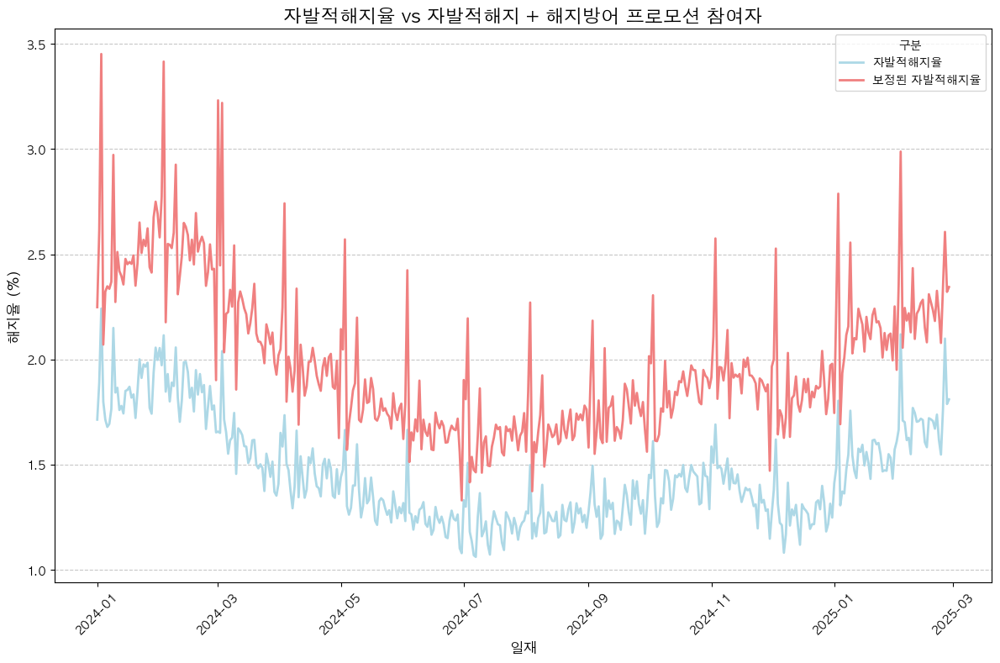

In [26]:
# 그래프 생성
plt.figure(figsize=(12, 8))

# SELF_OUT_PROD_RATIO 라인 플롯
sns.lineplot(data=dfs_promo_df, x='dt', y='self_out_prod_ratio', label='자발적해지율', color='lightblue', linewidth=2)

# NEW_SELF_OUT_PROD_RATIO 라인 플롯
sns.lineplot(data=dfs_promo_df, x='dt', y='NEW_SELF_OUT_PROD_RATIO', label='보정된 자발적해지율', color='lightcoral', linewidth=2)

# 그래프 제목 및 레이블 설정
plt.title('자발적해지율 vs 자발적해지 + 해지방어 프로모션 참여자', fontsize=16)
plt.xlabel('일재', fontsize=12)
plt.ylabel('해지율 (%)', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='구분', fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

In [18]:
dfs_promo_df

,dt,YM,log_date,out_prod_cnt,self_out_prod_cnt,trgt_prod_cnt,at_pay_trgt_prod_cnt,NEW_PROMO_PROD_RATIO,new_promo_prod_cnt,new_promo_prod_cnt_2,self_out_prod_ratio,NEW_SELF_OUT_PROD_RATIO,DIFF_OUT_RATIO,NEW_SELF_OUT_PROD_RATIO_2
0,2024-01-01,2024-01,20240101,2919927,2021,117932,115880,0.553529,645,0,1.713699,2.248328,0.534629,1.713699
1,2024-01-02,2024-01,20240102,2918353,1829,96740,94873,0.753193,720,0,1.890635,2.615432,0.724797,1.890635
2,2024-01-03,2024-01,20240103,2917873,1193,53215,51988,1.266736,667,0,2.241849,3.451988,1.210139,2.241849
3,2024-01-04,2024-01,20240104,2918152,2058,114394,112312,0.281455,317,0,1.799045,2.070420,0.271375,1.799045
4,2024-01-05,2024-01,20240105,2916957,1977,115327,113306,0.629692,718,0,1.714256,2.322375,0.608119,1.714256
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419,2025-02-23,2025-02,20250223,2753655,1405,90785,89351,0.547622,492,0,1.547612,2.078289,0.530677,1.547612
420,2025-02-24,2025-02,20250224,2753404,1624,92195,90538,0.600538,547,0,1.761484,2.340903,0.579419,1.761484
421,2025-02-25,2025-02,20250225,2752916,1987,94660,92637,0.529368,493,1,2.099091,2.606329,0.507237,2.100126
422,2025-02-26,2025-02,20250226,2751637,1638,91609,89937,0.552871,500,1,1.788034,2.321163,0.533129,1.789106


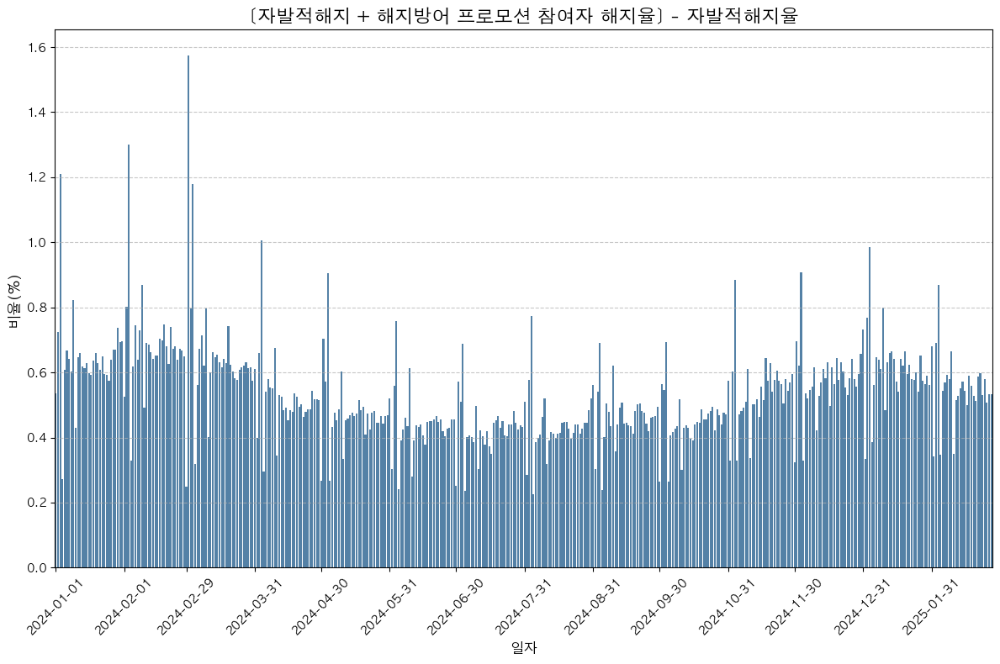

In [ ]:


# 그래프 생성
plt.figure(figsize=(12, 8))

# Bar plot 생성 (색상을 어둡게 설정)
sns.barplot(data=dfs_promo_df, x='dt', y='DIFF_OUT_RATIO', color='steelblue')

# x축 레이블을 매월 1일만 표시
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  # 매월 1일
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # 날짜 형식 설정
plt.xticks(rotation=45)  # x축 레이블 45도 회전

# 그래프 제목 및 레이블 설정
plt.title('[자발적해지 + 해지방어 프로모션 참여자 해지율] - 자발적해지율', fontsize=16)
plt.xlabel('일자', fontsize=12)
plt.ylabel('비율(%)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

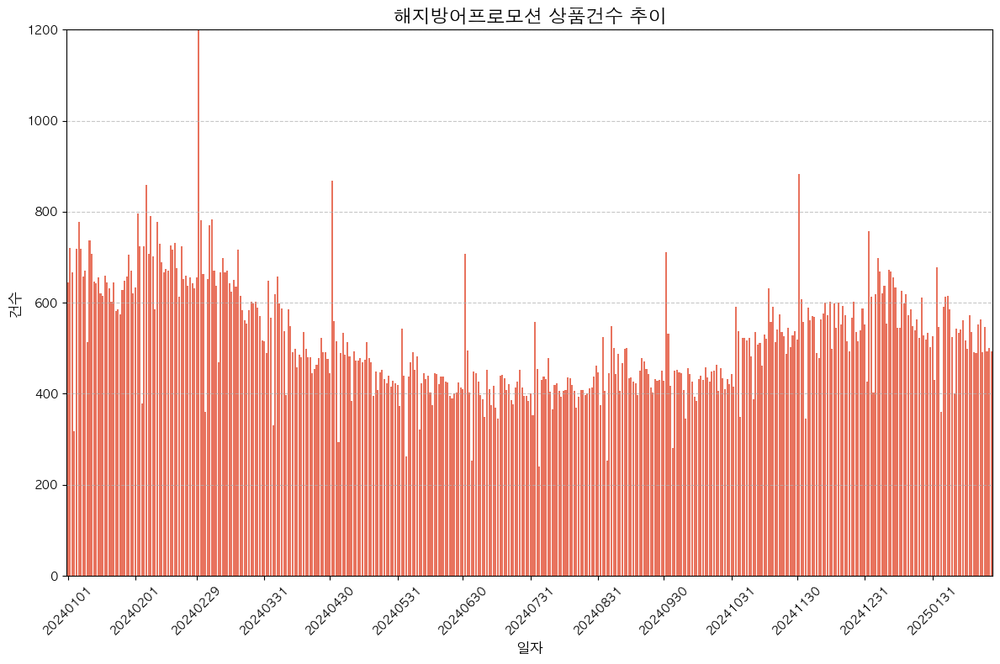

In [38]:


# 그래프 생성
plt.figure(figsize=(12, 8))

# Bar plot 생성 (색상을 어둡게 설정)
sns.barplot(data=dfs_promo_df, x='log_date', y='new_promo_prod_cnt', color='tomato')

# x축 레이블을 매월 1일만 표시
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  # 매월 1일
#plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # 날짜 형식 설정
plt.xticks(rotation=45)  # x축 레이블 45도 회전

# y축 범위 설정
plt.ylim(0, 1200)
# 그래프 제목 및 레이블 설정
plt.title('해지방어프로모션 상품건수 추이', fontsize=16)
plt.xlabel('일자', fontsize=12)
plt.ylabel('건수', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()

In [ ]:
dfs_promo_grade_query = '''
SELECT F1.DT
     , DATE_FORMAT(F1.DT,'%Y-%m') AS YM
     , DATE_FORMAT(F1.DT,'%Y%m%d') AS log_date
     , F1.GRADE 
     , F1.OUT_PROD_CNT
     , F1.SELF_OUT_PROD_CNT
     , F1.TRGT_PROD_CNT
     , F1.at_pay_trgt_prod_cnt
     , CAST(F2.NEW_PROMO_PROD_CNT as DOUBLE)/CAST(F1.at_pay_trgt_prod_cnt + F2.NEW_PROMO_PROD_CNT AS DOUBLE)*100 AS NEW_PROMO_PROD_RATIO
     , F2.NEW_PROMO_PROD_CNT
     , F2.NEW_PROMO_PROD_CNT_2 
     , F1.SELF_OUT_PROD_RATIO
     , CAST(F1.SELF_OUT_PROD_CNT + F2.NEW_PROMO_PROD_CNT AS DOUBLE)/CAST(F1.TRGT_PROD_CNT + F2.NEW_PROMO_PROD_CNT AS DOUBLE)*100 AS NEW_SELF_OUT_PROD_RATIO
     , CAST(F1.SELF_OUT_PROD_CNT + F2.NEW_PROMO_PROD_CNT AS DOUBLE)/CAST(F1.TRGT_PROD_CNT + F2.NEW_PROMO_PROD_CNT AS DOUBLE)*100 - F1.SELF_OUT_PROD_RATIO AS DIFF_OUT_RATIO
     , CAST(F1.SELF_OUT_PROD_CNT + F2.NEW_PROMO_PROD_CNT_2 AS DOUBLE)/CAST(F1.TRGT_PROD_CNT + F2.NEW_PROMO_PROD_CNT_2 AS DOUBLE)*100 AS NEW_SELF_OUT_PROD_RATIO_2
FROM(
    SELECT A.DT
         , CASE
              WHEN A.AT_BUY_CNT >= 60 THEN '6) MVIP'
              WHEN A.AT_BUY_CNT >= 36 THEN '5) VIP'
              WHEN A.AT_BUY_CNT >= 12 THEN '4) GOLD'
              WHEN A.AT_BUY_CNT >= 6 THEN '3) SILVER'
              WHEN A.AT_BUY_CNT >= 3 THEN '2) GREEN'
              ELSE '1) 일반'
           END AS GRADE
         , COUNT(DISTINCT A.BUY_NO) AS OUT_PROD_CNT
         , COUNT(DISTINCT IF(A.PROD_STAT_CD IN (3100, 3401, 3701, 4000, 3200, 3201),A.BUY_NO)) AS SELF_OUT_PROD_CNT
         , COUNT(DISTINCT IF(A.PROD_STAT_CD IN (3100, 3401, 3701, 4000, 3200, 3201,3300, 3301, 3903, 3902, 3900) OR at_pay_trgt_yn = 1,A.BUY_NO)) AS TRGT_PROD_CNT
         , CAST(COUNT(DISTINCT IF(A.PROD_STAT_CD IN (3100, 3401, 3701, 4000, 3200, 3201),A.BUY_NO)) AS DOUBLE)/CAST(COUNT(DISTINCT IF(A.PROD_STAT_CD IN (3100, 3401, 3701, 4000, 3200, 3201,3300, 3301, 3903, 3902, 3900) OR at_pay_trgt_yn = 1,A.BUY_NO)) AS DOUBLE)*100 AS SELF_OUT_PROD_RATIO
         , COUNT(DISTINCT IF(at_pay_trgt_yn = 1,A.BUY_NO)) AS at_pay_trgt_prod_cnt
    FROM HADOOP_KENT.MELON_MA_STAT_PRODUCTION.F_PROD_USER_FXMT_DT A 
    JOIN HADOOP_KENT.MELON_MA_STAT_PRODUCTION.D_PROD B  ON (A.PROD_ID = B.PROD_ID)
    WHERE A.LOG_DATE BETWEEN CAST('20240101' AS VARCHAR(8)) AND CAST('20250227' AS VARCHAR(8)) 
    AND DATE_FORMAT(A.DT,'%Y%m%d') BETWEEN CAST('20240101' AS VARCHAR(8)) AND CAST('20250227' AS VARCHAR(8)) 
    AND A.PF_YN = 1 -- 유료
    AND DATE(A.VLD_STRT_DATE) <= DATE(A.VLD_END_DATE)
    AND B.PROD_ATTR_CD NOT IN (10040, 10050)
    AND B.PROD_SELL_PRT_CD = 60000 -- B2C
    AND B.PROD_PRT_CD IN ( 20000, 20010 )
    GROUP BY 1,2
) F1
LEFT JOIN(
    SELECT T1.DT
         , CASE
              WHEN T1.AT_BUY_CNT >= 60 THEN '6) MVIP'
              WHEN T1.AT_BUY_CNT >= 36 THEN '5) VIP'
              WHEN T1.AT_BUY_CNT >= 12 THEN '4) GOLD'
              WHEN T1.AT_BUY_CNT >= 6 THEN '3) SILVER'
              WHEN T1.AT_BUY_CNT >= 3 THEN '2) GREEN'
              ELSE '1) 일반'
           END AS GRADE
         , COUNT(DISTINCT T1.BUY_NO) AS NEW_PROMO_PROD_CNT    
         , COUNT(DISTINCT IF(PROMO_NM LIKE '첫달 100원 + %',T1.BUY_NO)) AS NEW_PROMO_PROD_CNT_2    
    FROM HADOOP_KENT.MELON_MA_STAT_PRODUCTION.F_PROD_USER_FXMT_DT T1
    JOIN HADOOP_KENT.MELON_MA_STAT_PRODUCTION.D_PROMO T2 ON (T1.PROMO_ID = T2.PROMO_ID)
    JOIN HADOOP_KENT.MELON_ODS_COMMERCE_PRODUCTION.SBY_BUY_HIST T3 ON (T1.BUY_NO = T3.BUY_NO)
    WHERE LOG_DATE BETWEEN '20240101' AND '20250227'
    AND T2.PROMO_GRP_CD = 41 -- 해지방어프로모션
    AND T1.PROD_JOIN_PRT_CD NOT IN (9999)
    AND T3.AUTO_BUY_CO = T3.PROMO_FIRST_APPLC_PTIME /* 해지방어 프로모션 시작 상품 */
    GROUP BY 1,2
) F2 ON F1.DT = F2.DT AND F1.GRADE = F2.GRADE    
ORDER BY 2,1
'''

cur.execute(dfs_promo_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

dfs_promo_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
dfs_promo_df.head()

,dt,YM,log_date,grade,out_prod_cnt,self_out_prod_cnt,trgt_prod_cnt,at_pay_trgt_prod_cnt,NEW_PROMO_PROD_RATIO,new_promo_prod_cnt,new_promo_prod_cnt_2,self_out_prod_ratio,NEW_SELF_OUT_PROD_RATIO,DIFF_OUT_RATIO,NEW_SELF_OUT_PROD_RATIO_2
0,2024-01-01,2024-01,20240101,5) VIP,813743,540,33049,32498,0.438099,143,0,1.633937,2.057725,0.423787,1.633937
1,2024-01-01,2024-01,20240101,3) SILVER,376743,916,18918,17995,0.171974,31,0,4.841949,4.997625,0.155676,4.841949
2,2024-01-01,2024-01,20240101,4) GOLD,1011737,991,44130,43128,0.447809,194,0,2.245638,2.673495,0.427857,2.245638
3,2024-01-01,2024-01,20240101,2) GREEN,311383,1115,13281,12161,0.016443,2,0,8.395452,8.409245,0.013793,8.395452
4,2024-01-01,2024-01,20240101,6) MVIP,1094447,490,40753,40254,0.759331,308,0,1.202365,1.943450,0.741085,1.202365


In [57]:
# dt를 datetime 형식으로 변환
dfs_promo_df['dt'] = pd.to_datetime(dfs_promo_df['dt'])


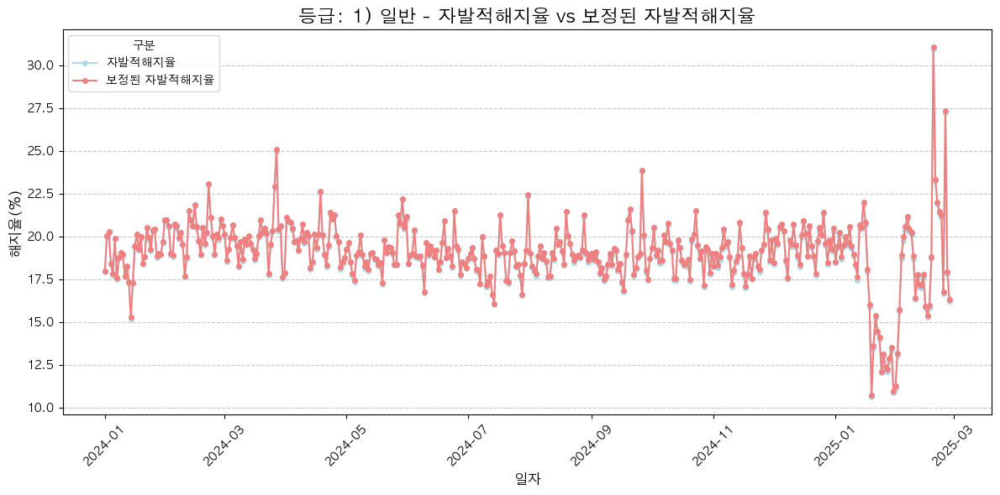

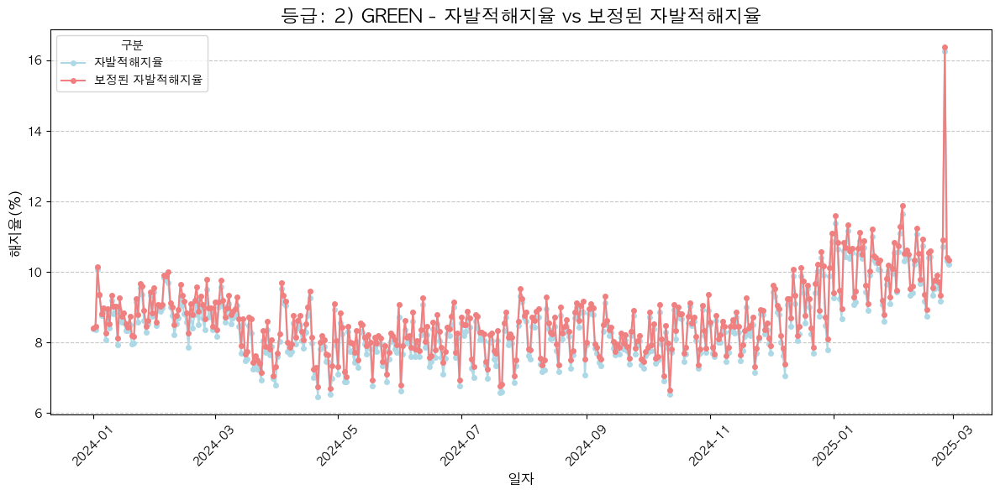

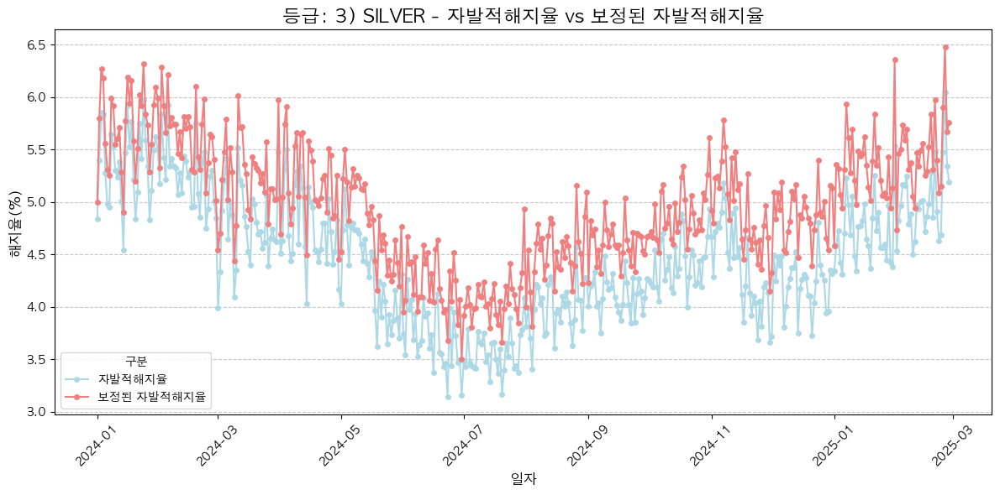

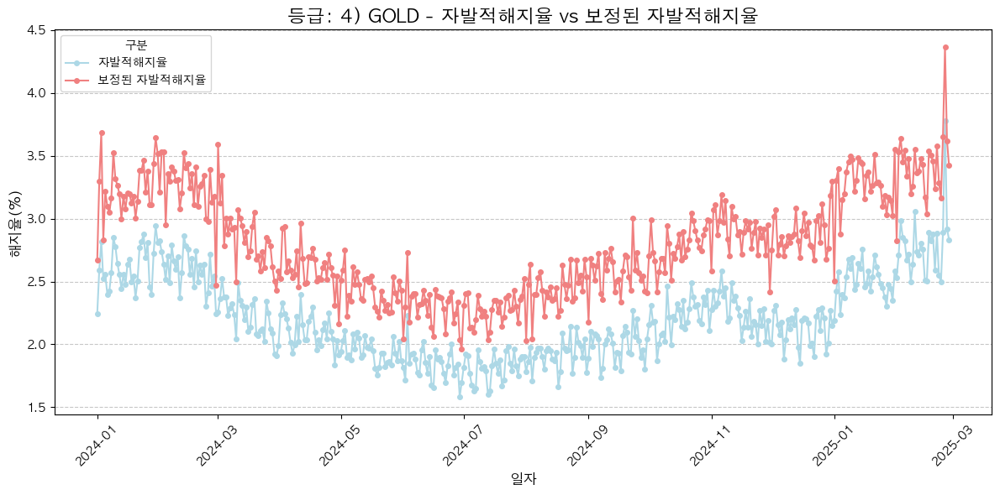

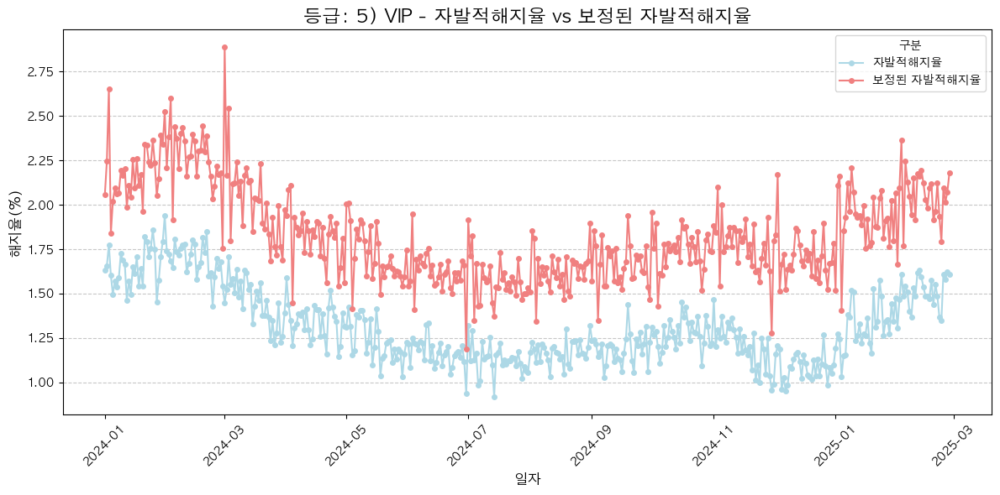

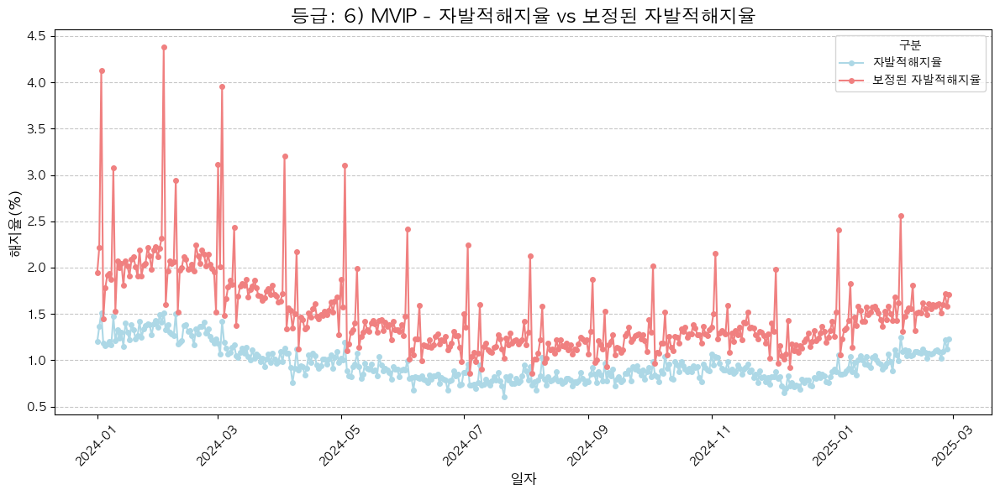

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# grade별로 데이터를 그룹화
grouped = dfs_promo_df.groupby('grade')

# grade별로 플롯 생성
for grade, data in grouped:
    plt.figure(figsize=(12, 6))
    
    # Line plot 생성 (포인트 크기 조정 및 연한 색상 설정)
    plt.plot(data['dt'], data['self_out_prod_ratio'], label='자발적해지율', marker='o', markersize=4, color='lightblue')
    plt.plot(data['dt'], data['NEW_SELF_OUT_PROD_RATIO'], label='보정된 자발적해지율', marker='o', markersize=4, color='lightcoral')
    
    # 그래프 제목 및 레이블 설정
    plt.title(f'등급: {grade} - 자발적해지율 vs 보정된 자발적해지율', fontsize=16)
    plt.xlabel('일자', fontsize=12)
    plt.ylabel('해지율(%)', fontsize=12)
    plt.xticks(rotation=45)
    plt.legend(title='구분', fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # 그래프 표시
    plt.tight_layout()
    plt.show()

In [67]:
album_query = '''
    select A.album_id
         , A.album_name
         , A.artist_id
         , A.artist_nm
         , B.fandom_user_cnt
         , B.mvip_fandom_user_cnt
         , A.issue_date
         , substr(A.issue_date,1,6) as issue_month
         , substr(A.issue_date,1,4) as issue_year
        
    from(
        SELECT album_id
             , ALBUM_NAME_WEB_LIST as album_name
             , rep_artist_id_basket as artist_id
             , rep_artist_name_basket as artist_nm
             , issue_date
        FROM HADOOP_KENT.MELON_ODS_META_PRODUCTION.PB_ALBUM_DTL_TB_RO
        WHERE ISSUE_DATE BETWEEN '20231001' AND '20250131'
        AND rep_artist_id_basket not in ('2727','1384479','1703695')
    ) A
    LEFT JOIN(
        SELECT fandom.log_date
             , fandom.artist_id
             , count(distinct fandom.MEMBER_KEY) AS fandom_user_cnt
             , count(distinct if(vip.member_key is not null,fandom.member_key)) as mvip_fandom_user_cnt
        from(
        select artist_id
             , member_key
             , log_date
        FROM HADOOP_KENT.MELON_MA_PROD_PRODUCTION.A_USER_ARTIST_FANDOM_TRGT_DAY
        WHERE LOG_DATE BETWEEN '20231001' AND '20250131'
        AND (CONTAINS(FANDOM_TYPE,'A')=true OR CONTAINS(FANDOM_TYPE,'B')=true OR CONTAINS(FANDOM_TYPE,'C')=true)
        GROUP BY 1,2,3
        ) fandom
        left join(
            select member_key,log_date
            from hadoop_kent.melon_ma_user_production.a_user_vip_grade_day
            where log_date between '20231001' AND '20250131'
            and vip_grade_nm = 'MVIP'
            group by 1,2
        ) vip on fandom.member_Key = vip.member_key and fandom.log_date = vip.log_date
        group by 1,2
    ) B ON A.ISSUE_DATE = B.LOG_DATE AND A.artist_id = cast(B.artist_id as varchar)
    where mvip_fandom_user_cnt > 1000
    order by issue_date
'''

cur.execute(album_query)

results = cur.fetchall()
colnames = [part[0] for part in cur.description]

album_df = pd.DataFrame(results, columns=colnames)

cur.cancel()
conn.close()
album_df.head()

,album_id,album_name,artist_id,artist_nm,fandom_user_cnt,mvip_fandom_user_cnt,issue_date,issue_month,issue_year
0,11339379,HEAT (Clean Ver.),2137482,(여자)아이들,11431,1001,20231004,202310,2023
1,11339380,HEAT,2137482,(여자)아이들,11433,1001,20231005,202310,2023
2,11339400,Fact Check - The 5th Album,991413,NCT 127,42653,4163,20231006,202310,2023
3,11340391,Do or Die,994944,임영웅,70178,2144,20231009,202310,2023
4,11333459,I&#39;VE MINE,3055146,IVE (아이브),21415,1678,20231013,202310,2023


/var/folders/qw/6lks7c5d14scf7qtctm8m6jh0000gn/T/ipykernel_65166/2419654192.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=album_df, x='issue_month', y='mvip_fandom_user_cnt', palette='Blues')


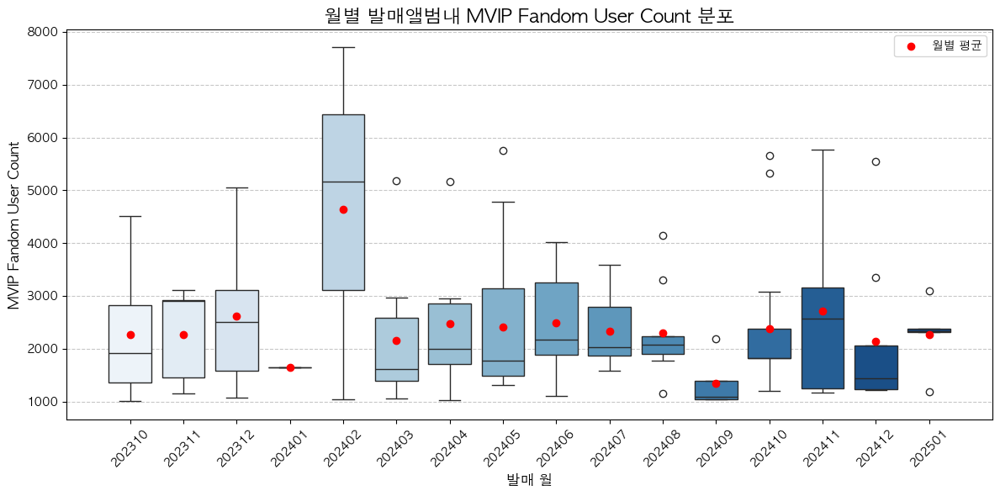

In [74]:
# issue_month를 문자열 형식으로 변환 (필요 시)
album_df['issue_month'] = album_df['issue_month'].astype(str)

# 월별 평균 mvip_fandom_user_cnt 계산
monthly_avg = album_df.groupby('issue_month')['mvip_fandom_user_cnt'].mean().reset_index()

# 그래프 생성
plt.figure(figsize=(12, 6))

# Box plot 생성
sns.boxplot(data=album_df, x='issue_month', y='mvip_fandom_user_cnt', palette='Blues')

# 월별 평균 포인트 추가 (빨간색)
plt.scatter(
    x=monthly_avg['issue_month'],
    y=monthly_avg['mvip_fandom_user_cnt'],
    color='red',
    label='월별 평균',
    zorder=5  # 포인트를 박스플롯 위에 표시
)

# 그래프 제목 및 레이블 설정
plt.title('월별 발매앨범내 MVIP Fandom User Count 분포', fontsize=16)
plt.xlabel('발매 월', fontsize=12)
plt.ylabel('MVIP Fandom User Count', fontsize=12)
plt.xticks(rotation=45)  # x축 레이블 45도 회전
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 범례 추가
plt.legend(loc='upper right', fontsize=10)

# 그래프 표시
plt.tight_layout()
plt.show()

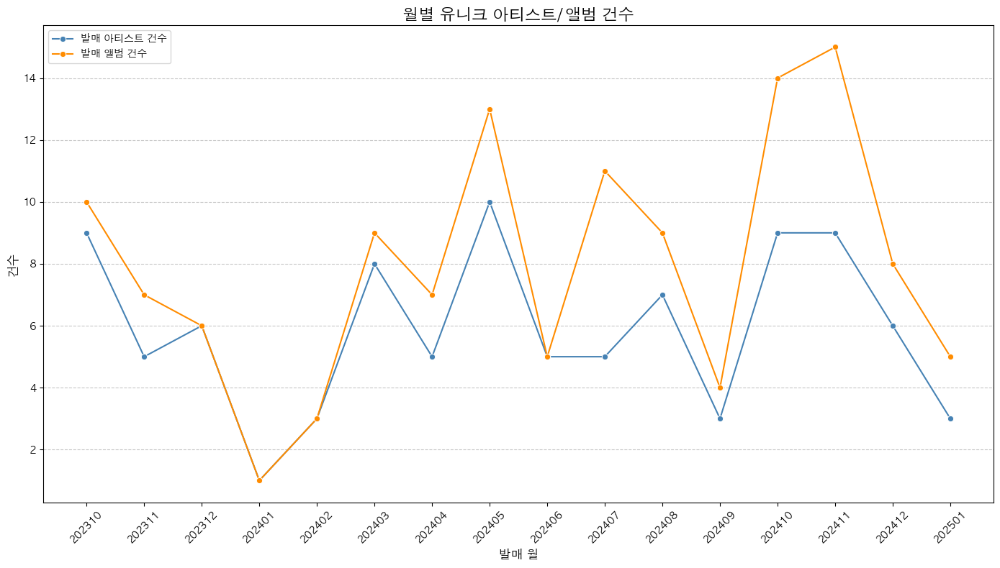

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# issue_month를 문자열 형식으로 변환 (필요 시)
album_df['issue_month'] = album_df['issue_month'].astype(str)

# 월별 유니크 아티스트 건수 계산 (artist_id 기준)
unique_artists = album_df.groupby('issue_month')['artist_id'].nunique().reset_index()
unique_artists.rename(columns={'artist_id': 'unique_artist_count'}, inplace=True)

# 월별 유니크 앨범 건수 계산
unique_albums = album_df.groupby('issue_month')['album_id'].nunique().reset_index()
unique_albums.rename(columns={'album_id': 'unique_album_count'}, inplace=True)

# 월별 데이터 병합
monthly_data = pd.merge(unique_artists, unique_albums, on='issue_month')

# 그래프 생성
plt.figure(figsize=(14, 8))

# Line plot: 유니크 아티스트 건수
sns.lineplot(data=monthly_data, x='issue_month', y='unique_artist_count', marker='o', color='steelblue', label='발매 아티스트 건수')

# Line plot: 유니크 앨범 건수
sns.lineplot(data=monthly_data, x='issue_month', y='unique_album_count', marker='o', color='darkorange', label='발매 앨범 건수')

# x축 레이블 회전
plt.xticks(rotation=45)

# y축 레이블 설정
plt.ylabel('건수', fontsize=12)
plt.xlabel('발매 월', fontsize=12)

# 그래프 제목 설정
plt.title('월별 유니크 아티스트/앨범 건수', fontsize=16)

# 범례 추가
plt.legend(loc='upper left', fontsize=10)

# 그리드 추가
plt.grid(axis='y', linestyle='--', alpha=0.7)

# 그래프 표시
plt.tight_layout()
plt.show()